## Calibrate the tSIR transmissibility parameter using NY case data.
- Do it with the 705 zipcodes in Sifat's data
- Does adding the additional missing zipcodes (e.g from US Census bureau data) make a difference?

In [1]:
# standard imports
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import sys

In [2]:
# import project scripts
project_path = "/home/nick/Documents/4tb_sync/UVA GDrive/Summer 2022 (C4GC with BII)/measles_metapop/{}"
sys.path.append(project_path.format("scripts"))
from spatial_tsir import *

## Load and clean data

In [3]:
# immunization data
immun = pd.read_csv(project_path.format("data/VA_zipcodes_cleaned/ZC_immunization_sifat.csv"))
# drop rows with zero population
immun = immun[immun['population'] > 0]
immun.sort_values(by='zipcode',inplace=True)
immun.reset_index(drop=True, inplace=True)
immun.head()

,node,zipcode,population,nVaccCount
0,1075,20007,1493,111
1,481,20105,19750,1567
2,482,20106,3316,289
3,523,20109,41198,3436
4,1180,20110,44006,3463


In [4]:
# random zipcode in TN?
immun[immun['zipcode'] > 30000]

,node,zipcode,population,nVaccCount
704,386,37620,1499,157


In [5]:
# distance data
dists = pd.read_csv(project_path.format("data/VA_zipcodes_cleaned/ZC_distance_sifat_nom_geopy.csv"))
dists = dists[['zipcode1','zipcode2','distKM']]

In [6]:
# there are some zipcodes which are very close to each other
# to avoid numerical errors set them 1km away
print(dists[dists['distKM'] < 1].head())
#dists['distKM'] = dists['distKM'].replace(0,1)

        zipcode1  zipcode2    distKM
103174     23507     23517  0.901989
103175     23517     23507  0.901989
415950     22801     22807  0.485097
415951     22807     22801  0.485097
486820     22205     22213  0.901626


In [7]:
dists
dists.to_csv(project_path.format('data/for_sim_opt_cleaned/dist.csv'))

In [8]:
# pivot into matrix format
dists = dists.pivot(index='zipcode1',columns='zipcode2')
# fill diagonal with 0s
dists = dists.fillna(0)
dists.head()

distKM                                                         \
zipcode2      20007      20105      20106      20109      20110      20111   
zipcode1                                                                     
20007      0.000000  43.488963  83.262415  40.631702  39.023633  36.538757   
20105     43.488963   0.000000  46.458354  18.521859  22.051255  21.315067   
20106     83.262415  46.458354   0.000000  42.685475  44.842012  47.110861   
20109     40.631702  18.521859  42.685475   0.000000   3.982382   4.947951   
20110     39.023633  22.051255  44.842012   3.982382   0.000000   2.590111   

                                                      ...              \
zipcode2      20112      20115      20117      20119  ...       24634   
zipcode1                                              ...               
20007     41.575859  70.911925  55.109462  57.021453  ...  461.353950   
20105     31.223611  29.654972  12.057040  32.815535  ...  422.709349   
20106     46.416076  19.581901  42.151872  29.888819  ...  378.232756   
20109     12.788013  32.796616  27.706060  18.333408  ...  420.727655   
20110      9.205262  36.190343  31.630453  18.382787  ...  422.453164   

                                                                      \
zipcode2       24637       24639       24641       24646       24649   
zipcode1                                                               
20007     458.052679  465.123640  461.996939  477.682064  474.192985   
20105     420.711943  427.469472  424.376509  439.428264  436.551620   
20106     375.423744  382.351761  379.239017  394.680508  391.429355   
20109     417.544749  424.575476  421.452465  437.077250  433.647499   
20110     419.035200  426.119492  422.991139  438.726763  435.187499   

                                                          
zipcode2       24651       24656       24657       37620  
zipcode1                                                  
20007     437.530881  479.154416  460.028904  520.202492  
20105     400.445923  440.390433  421.637660  484.192890  
20106     355.024094  396.007105  376.979047  438.361683  
20109     397.057889  438.525230  419.414089  479.957266  
20110     398.508390  440.269621  421.092536  481.214370  

[5 rows x 705 columns]

In [9]:
# check that indices are aligned
print(all(immun['zipcode'] == dists.index))
print(all(immun['zipcode']==pd.Series([x[1] for x in dists.columns])))

True
True


In [11]:
immun['vacc'] = (immun['pop'] - immun['unvacc'])/immun['pop']
immun_to_save = immun[['zipcode','pop','vacc']]

KeyError: 'pop'

In [ ]:
immun_to_save.columns = ['id','pop','vacc']
immun_to_save.to_csv(project_path.format('data/for_sim_opt_cleaned/pop.csv'),index=False)

## Set up simulator

In [10]:
# load fitted gravity parameters
grav_params = np.load(project_path.format("outputs/log_calib_grav_params_jul22.npy"))

#grav_params = np.array( [0.08658264,   2.95947255,   1.0884192 , np.exp(-23) ])

#grav_params = np.array([0.8739332,1.02912974,0.98879558,np.exp(-9.5)])
#grav_params = np.array([0.83439332,1.02912974,0.98879558,np.exp(-10)])
#grav_params = np.array([0.10658264,2.95947255,1.0884192,np.exp(-23)])
#grav_params = np.array([0.10658264,2.95947255,1.0884192,np.exp(-22.5)])

#grav_params = [      0.46743565,   1.43587031,   1.3381735 , np.exp(-10.)        ,
#        np.exp(-1.29466935)]
grav_params = np.array([2.05129243,   1.00658961,   1.39756446, np.exp(-22.51557391)])

print(grav_params)

[2.05129243e+00 1.00658961e+00 1.39756446e+00 1.66575258e-10]


In [11]:
# simulation parameters
config = {
    'iters':20,
    'alpha': 0.97,
    'tau1': grav_params[0],
    'tau2': grav_params[1],
    'rho': grav_params[2],
    'theta': grav_params[3],
    #'phi' : grav_params[4],
    'grav_variant': "orig",
    'beta': 14 # placeholder
}

In [12]:
# setup initial state
patch_pop = immun
patch_pop.columns = ['node', 'zipcode', 'pop', 'unvacc']
# Recovered = Population - Unvaccinated
R = np.array(patch_pop['pop'] - patch_pop['unvacc'])

In [13]:
# Set up seed: top 5 population to start with...
# But how to deal with this in general?
top5_index = patch_pop.sort_values(by='pop',ascending=False).head(5).index
I = np.zeros(len(patch_pop.index))
np.put(I,top5_index,1)

initial_state = np.vstack([I,R]).T
initial_state

array([[    0.,  1382.],
       [    0., 18183.],
       [    0.,  3027.],
       ...,
       [    0.,  2673.],
       [    0.,   642.],
       [    0.,  1342.]])

In [14]:
# run the simulation
tsir_pool = spatial_tSIR_pool(
    config=config,
    patch_pop = immun,
    initial_state = initial_state,
    n_sim = 100,
    distances = np.array(dists)
)

In [15]:
from multiprocess import Pool
with Pool(12) as pool:
    tsir_pool.run_simulation(pool=pool)

<AxesSubplot:>

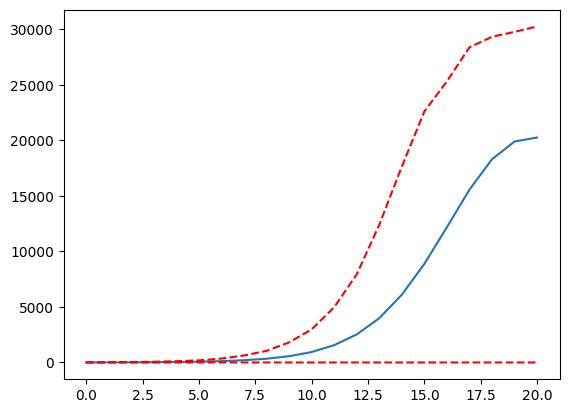

In [16]:
tsir_pool.plot_interval()

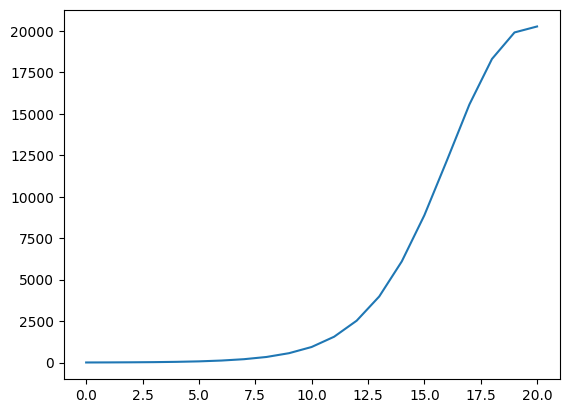

In [17]:
plt.plot(np.mean(tsir_pool.get_samples(),axis=0))

In [18]:
paths = list(tsir_pool.get_samples())
sums = np.sum(tsir_pool.get_samples(),axis=1)
joined = [(sums[i],paths[i]) for i in range(len(paths))]
joined.sort(key=lambda item:item[0])
unjoined = np.array([p for s,p in joined])
unjoined.shape
unjoined[50,:]

array([5.0000e+00, 1.3000e+01, 1.7000e+01, 2.3000e+01, 2.1000e+01,
       3.7000e+01, 7.6000e+01, 1.3600e+02, 2.2200e+02, 3.7300e+02,
       5.8900e+02, 1.0970e+03, 1.8890e+03, 3.1290e+03, 5.2960e+03,
       8.3660e+03, 1.2535e+04, 1.7935e+04, 2.3636e+04, 2.7522e+04,
       2.9732e+04])

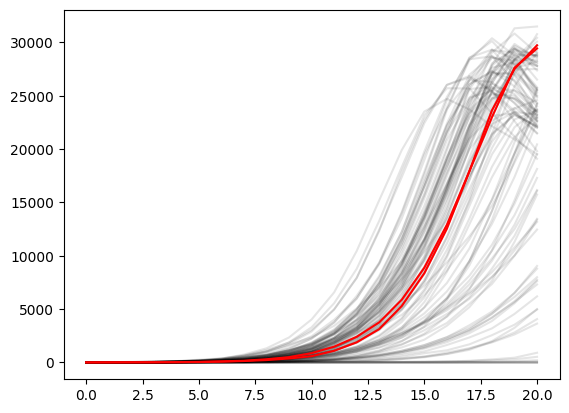

In [19]:
plt.plot(unjoined.T, color="black", alpha=0.1)
nrows = unjoined.shape[0]
if nrows % 2 == 0:
    plt.plot(unjoined[int(nrows/2),:],color="red")
    plt.plot(unjoined[int(nrows/2 + 1),:],color="red")
else:
    plt.plot(unjoined[int((nrows+2)/2),:],color="red")
plt.show()

## Load and process NYC case data

In [20]:
nyc_measles = pd.read_csv(project_path.format("data/nyc_measles_nejm.csv"))

In [21]:
biweekly_cases = [nyc_measles.loc[i,'cases']+nyc_measles.loc[i+1,'cases'] for i in range(0,len(nyc_measles.index),2)]
biweekly_dates = [nyc_measles.loc[i,'date'] for i in range(0,len(nyc_measles.index),2)]

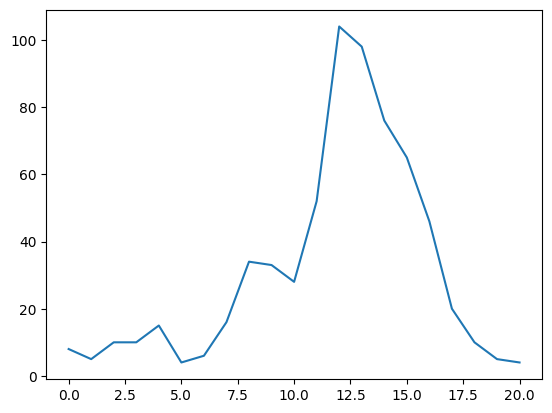

In [22]:
plt.plot(biweekly_cases)

In [23]:
sum(biweekly_cases)

649.0

In [25]:
# us census bureau, 2018 acs 1-year estimate
# https://data.census.gov/table?q=population&g=1600000US3651000&tid=ACSDP1Y2018.DP05
nyc_population = 8398748

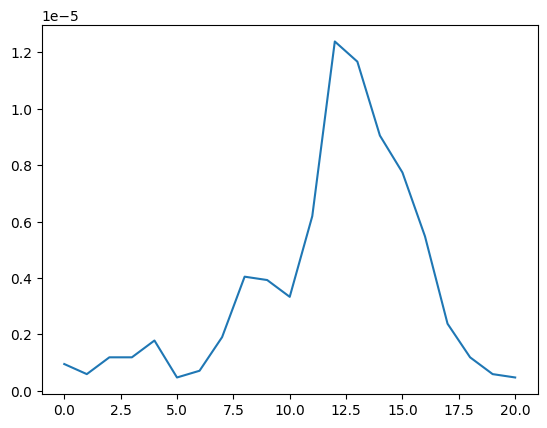

In [26]:
plt.plot(np.array(biweekly_cases)/nyc_population)

__how to choose a parameter__

- Do a standard "minimize MSE" type thing? Huh, but wait, doesn't tsir model support inference of $\beta$ paramter?
- we need to fix a seed... where should it start? NoVA? that seems reasonable (e.g recently there was the measles outbreak from Afghan refugees)

In [27]:
from sklearn.metrics import mean_squared_error
from sklearn.neighbors import KernelDensity
from sklearn.model_selection import RandomizedSearchCV
def calib_obj(beta, 
              sim_pop, dataset, seed, data_pop, base_config, pool_worker,
              plot=False, draws=100, obj="mse", return_pool=False, drop_zero=False):
    '''
    beta: transmission parameter
    sim_pop: population used in the simulation (e.g VA)
    dataset: case data to calibrate against
    data_pop: population size of the population in the data
    base_config: dictionary of simulation parameters
    pool_worker: multiprocess.Pool object to submit jobs to
    '''
    # simulation parameters
    config = base_config.copy()
    config['beta'] = beta
    
    #config['iters'] = len(dataset)
    
    # Set up seed: top 5 population to start with...
    # But how to deal with this in general?
    #top5_index = patch_pop.sort_values(by='pop',ascending=False).head(5).index
    #I = np.zeros(len(patch_pop.index))
    #np.put(I,top5_index,1)
    #initial_state = np.vstack([I,R]).T
    
    # suppose 1 case gets introduced at dulles?
    #dulles_index = patch_pop[patch_pop['zipcode'] == 20166].index
    #I = np.zeros(len(patch_pop.index))
    #np.put(I,dulles_index,1)
    I = seed
    initial_state = np.vstack([I,R]).T
    
    # run the simulation
    tsir_pool = spatial_tSIR_pool(
        config=config,
        patch_pop = immun,
        initial_state = initial_state,
        n_sim = draws,
        distances = np.array(dists)
    )
    with Pool(12) as pool:
        tsir_pool.run_simulation(pool=pool)
    
    orig_pool_samples = tsir_pool.get_samples()
    if drop_zero:
        prob_outbreak = 0
        pool_samples = []
        for row_index in range(draws):
            if np.mean(orig_pool_samples[row_index,:]) > 5:
                pool_samples.append(orig_pool_samples[row_index,:])
                prob_outbreak +=1
        prob_outbreak = prob_outbreak/draws
        print("Probability of large outbreak:",prob_outbreak)
        pool_samples = np.array(pool_samples)
    else:
        pool_samples = orig_pool_samples
    attack_samples= np.sum(pool_samples,axis=1)
                
    mean_path = np.mean(pool_samples,axis=0)
    scaled_median_path = np.median(pool_samples,axis=0)/sim_pop
    if not drop_zero:
        scaled_interval = tsir_pool.get_quantiles(select=None,time_range=None,quantiles=[0.25,0.75])/sim_pop
    scaled_mean_path = np.array(mean_path)/sim_pop
    
    scaled_data = np.array(dataset)/data_pop
    if plot:
        figure1 = plt.figure()
        plt.plot(scaled_mean_path,color="blue", label='Mean')
        plt.plot(scaled_median_path,color="green", label='Median')
        if not drop_zero:
            plt.plot(scaled_interval, color="red",linestyle="dashed", label='25%/75% pointwise quantile')
        #tsir_pool.plot_interval()
        plt.plot(scaled_data,color="orange", label='NYC data')
        plt.title('beta='+str(beta))
        plt.legend()
        
        if drop_zero:
            figure2, (ax1, ax2) = plt.subplots(nrows=1,ncols=2)
            plt.title('beta={}: Histogram of attack size samples'.format(str(beta)))
            ax1.hist(tsir_pool.get_attack_size_samples())
            ax2.hist(attack_samples)
        else:
            figure2 = plt.figure()
            plt.title('beta={}: Histogram of attack size samples'.format(str(beta)))
            plt.hist(tsir_pool.get_attack_size_samples())
        
        figure3 = plt.figure()
        plt.title('All paths, with path associated with attack size median highlighted in red')
        plt.plot(pool_samples.T/sim_pop,color="black", alpha=0.1)
        paths = list(pool_samples)
        sums = np.sum(pool_samples,axis=1)
        joined = [(sums[i],paths[i]) for i in range(len(paths))]
        print(joined[0])
        joined.sort(key=lambda item: item[0])
        unjoined = np.array([p for s,p in joined])
        nrows = unjoined.shape[0]
        if nrows % 2 == 0:
            plt.plot(unjoined[int(nrows/2),:]/sim_pop,color="red")
            plt.plot(unjoined[int(nrows/2 + 1),:]/sim_pop,color="red")
        else:
            plt.plot(unjoined[int((nrows+2)/2),:]/sim_pop,color="red")
        plt.plot(scaled_data,color="orange", label='NYC data')
        plt.show()
        #pdf_estimate = KernelDensity()
        #pdf_estimate.fit(tsir_pool.get_attack_size_samples().reshape(-1,1))
        #pdf_min,pdf_max = min(tsir_pool.get_attack_size_samples()), max(tsir_pool.get_attack_size_samples())
        #plt.plot(np.linspace(pdf_min,pdf_max), pdf_estimate.score_samples(np.linspace(pdf_min,pdf_max).reshape(-1,1)))
        #if obj == "kde_likelihood":
        #    pdf_estimate = KernelDensity()
        #    bandwidth = np.arange(0.05, 2, .05)
        #    grid = GridSearchCV(kde, {'bandwidth': bandwidth})
        #    grid.fit(tsir_pool.get_samples())
        #    score = pdf_estimate.score_samples(scaled_data.reshape(1,-1))
        #else:
        if obj == "median_attacksize":
            median_attacksize = np.median(attack_samples)
            scaled_median_attacksize = median_attacksize/sim_pop
            score = np.abs(sum(dataset)/data_pop - scaled_median_attacksize)
        else:
            score = np.log(mean_squared_error(scaled_mean_path,scaled_data))
        if return_pool:
            return tsir_pool
        return score,tsir_pool,figure1, figure2
    # use logs: the numbers are so small that underflow might happen
    #
    #if obj == "mse":
    #    return np.log(mean_squared_error(scaled_mean_path,scaled_data))
    #if obj == "attacksize_likelihood":
    #    pdf_estimate = KernelDensity()
    #    tune = RandomSearchCV(pdf_estimate,{'bandwidth'})
    #    pdf_estimate.fit(tsir_pool.get_attack_size_samples())

    return np.log(mean_squared_error(scaled_mean_path,scaled_data))
    

(146.0, array([ 5.,  7.,  4.,  4.,  5.,  8., 13., 11., 16., 14.,  9.,  7.,  7.,
        3.,  3.,  5.,  4.,  6.,  7.,  5.,  3.]))


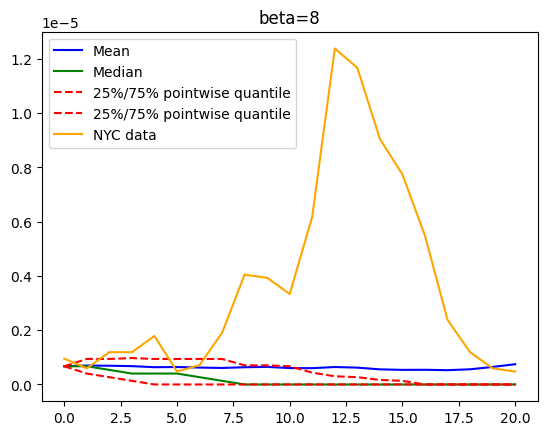

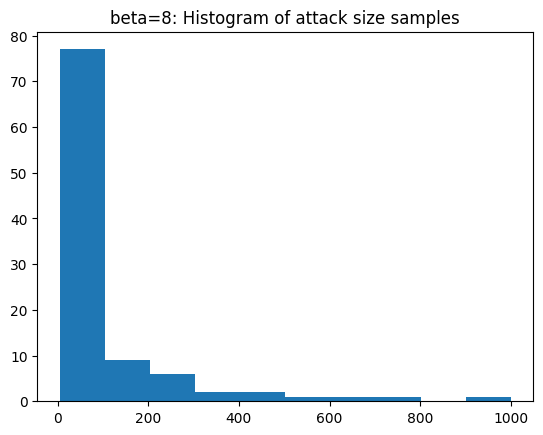

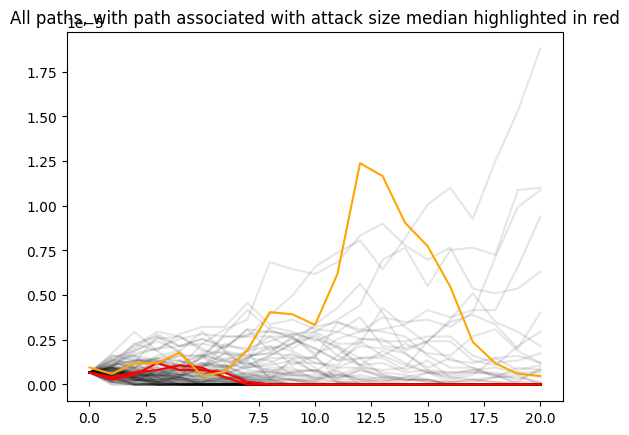

(7.250441540574548e-05, <spatial_tsir.spatial_tSIR_pool object at 0x7fad32310670>, <Figure size 640x480 with 1 Axes>, <Figure size 640x480 with 1 Axes>)


In [28]:
with Pool(12) as p:
    print(
        calib_obj(8, 
              sim_pop=sum(patch_pop['pop']), 
              dataset=biweekly_cases, data_pop=nyc_population,
              base_config=config, plot=True, seed=I, pool_worker=p, draws=100,obj="median_attacksize")
    )

Probability of large outbreak: 0.202
(244.0, array([ 1.,  3.,  2.,  5.,  3.,  6.,  7., 11., 21., 18., 16., 19., 21.,
       13., 16., 16., 14., 15., 11.,  8.,  6., 12.]))


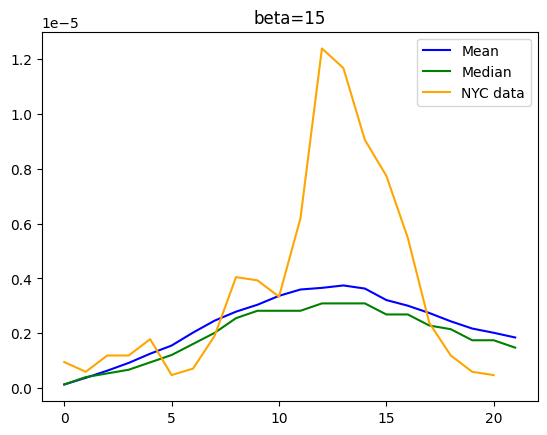

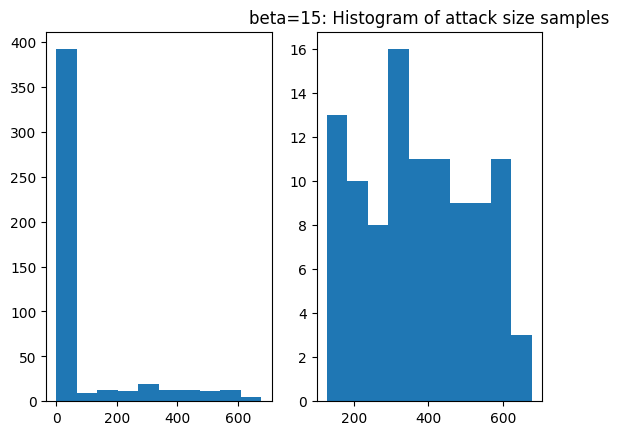

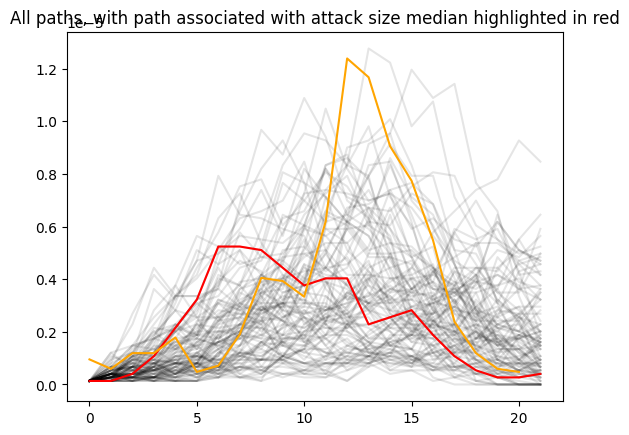

(2.6896590043280824e-05, <spatial_tsir.spatial_tSIR_pool object at 0x7fe2fe108220>, <Figure size 640x480 with 1 Axes>, <Figure size 640x480 with 2 Axes>)


In [54]:
with Pool(12) as p:
    print(
        calib_obj(15, 
              sim_pop=sum(patch_pop['pop']), 
              dataset=biweekly_cases, data_pop=nyc_population,
              base_config=config, plot=True, seed=I, pool_worker=p, draws=500,obj="median_attacksize", drop_zero=True)
    )

In [ ]:
np.array(biweekly_cases).reshape(1,-1)

In [30]:
from scipy.optimize import minimize




In [ ]:
with Pool(12) as p:
    opt_result = minimize(
        fun = calib_obj,
        x0=10,
        args= (sum(patch_pop['pop']), biweekly_cases, I, nyc_population, config, p),
        options={'maxiter':25},
        bounds=[(0.1,None)]
    )

## Parameter sweep: finding some suitable values of a parameter

In [20]:
dulles_index = patch_pop[patch_pop['zipcode'] == 20166].index
I = np.zeros(len(patch_pop.index))
np.put(I,dulles_index,2)

In [35]:
pd.Series(I).to_csv(project_path.format('data/for_sim_opt_cleaned/dulles_seed.csv'),index=False,header=False)

Probability of large outbreak: 0.0022
(146.0, array([ 1.,  2.,  2.,  5.,  5.,  5.,  9.,  9.,  5.,  8.,  5.,  6., 11.,
       13., 17., 15.,  9.,  5.,  3.,  7.,  4.]))


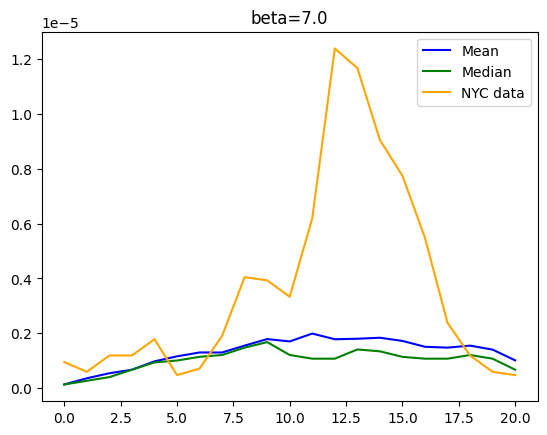

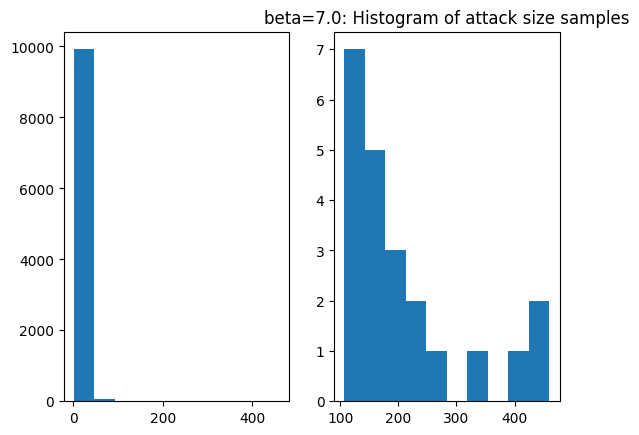

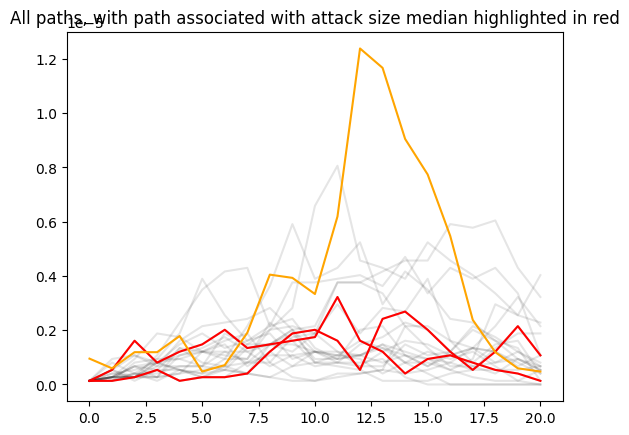

Probability of large outbreak: 0.0035
(169.0, array([ 1.,  1.,  6.,  7.,  5.,  5.,  7., 11.,  7.,  4.,  3.,  8., 18.,
       25., 22.,  9.,  8.,  4.,  5.,  9.,  4.]))


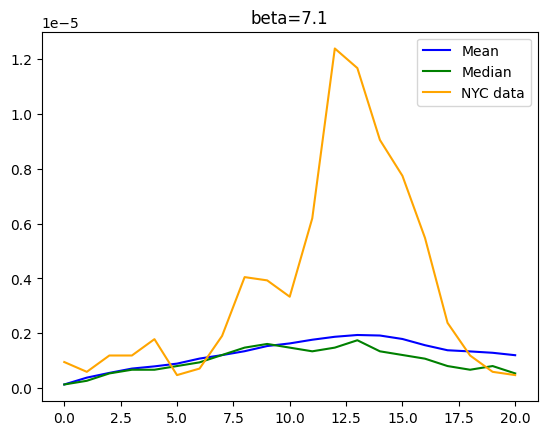

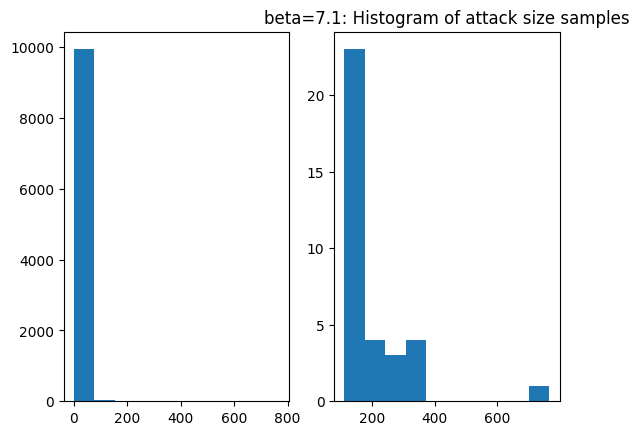

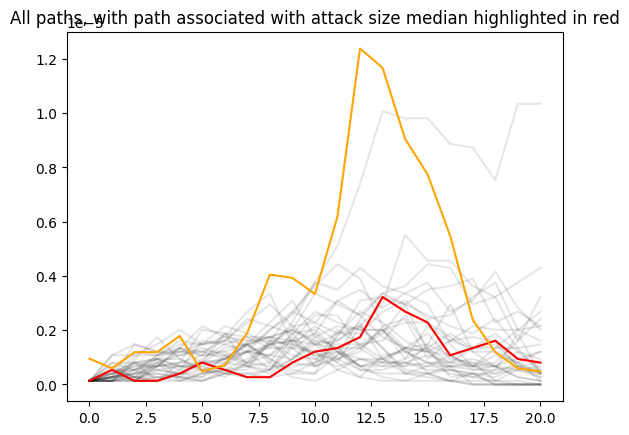

Probability of large outbreak: 0.0042
(145.0, array([ 1.,  1.,  1.,  1.,  6., 10., 16., 10.,  8., 10.,  8.,  7., 13.,
       11., 12.,  6.,  3.,  4.,  5.,  3.,  9.]))


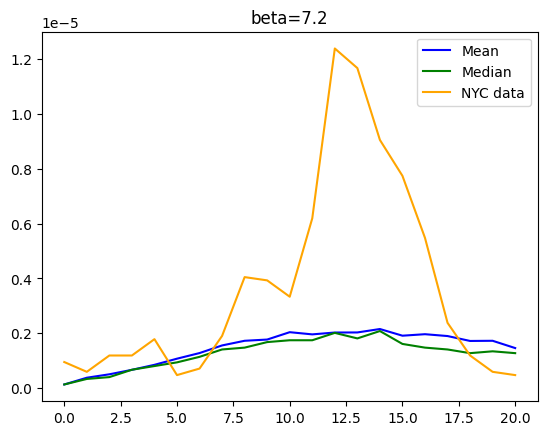

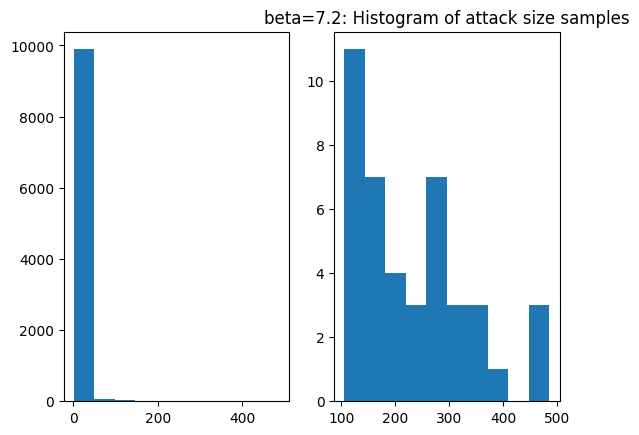

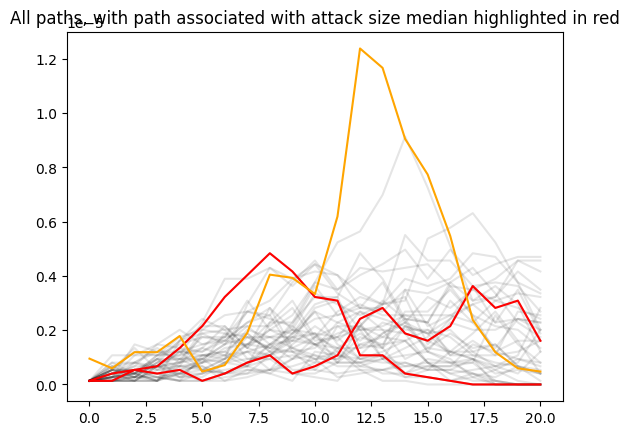

Probability of large outbreak: 0.0048
(340.0, array([ 1.,  3.,  2.,  2.,  5., 10., 10., 11., 10., 26., 28., 27., 24.,
       22., 29., 23., 37., 34., 17., 13.,  6.]))


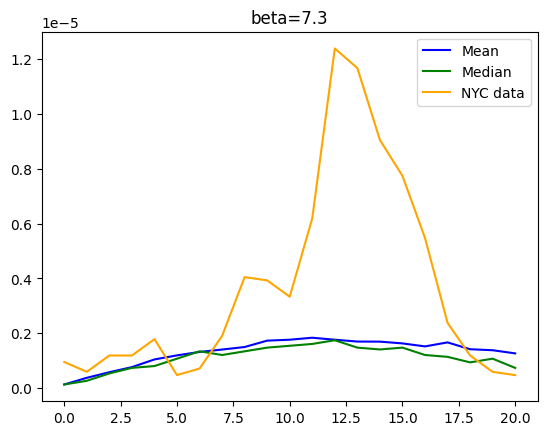

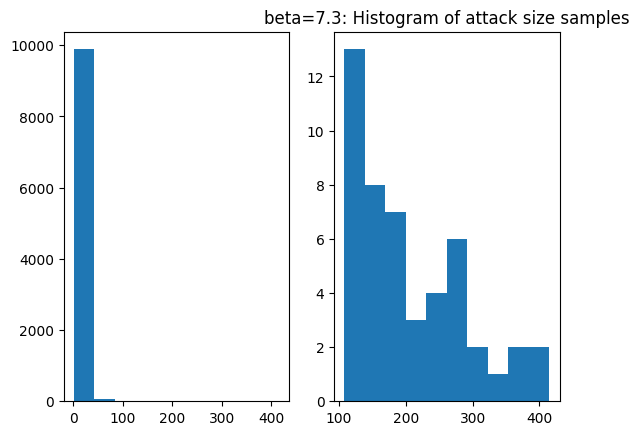

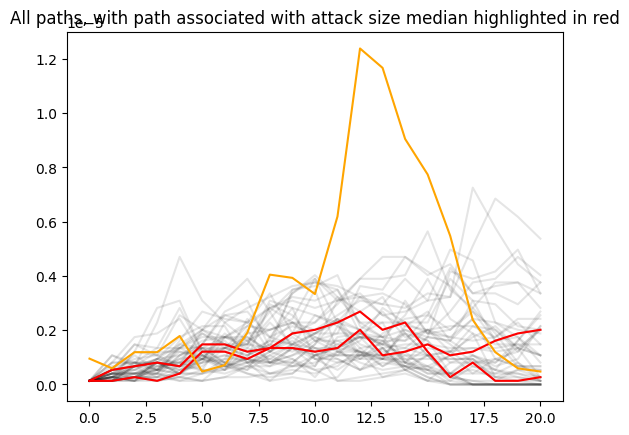

Probability of large outbreak: 0.0061
(111.0, array([ 1.,  3.,  2.,  2.,  5., 10., 10., 11., 10., 17., 19.,  7.,  7.,
        3.,  2.,  1.,  1.,  0.,  0.,  0.,  0.]))


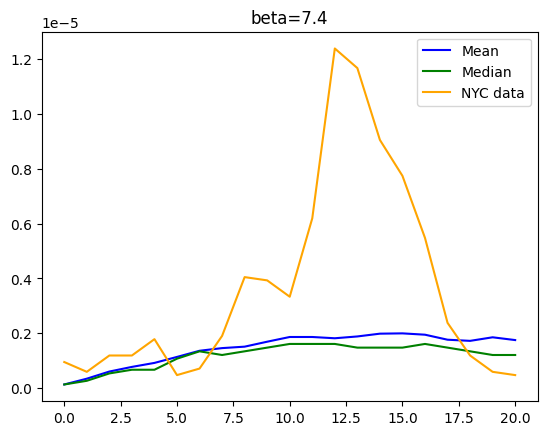

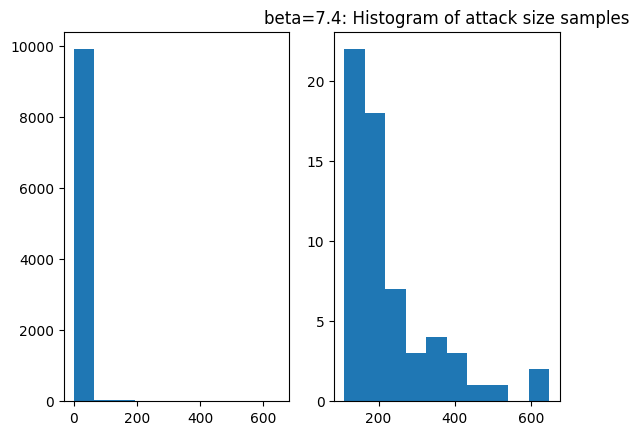

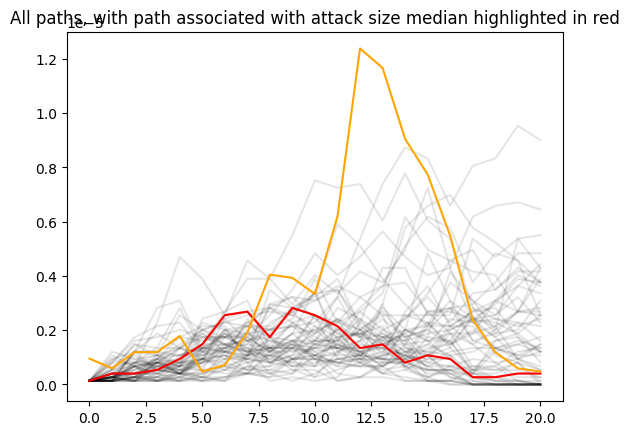

Probability of large outbreak: 0.0065
(201.0, array([ 1.,  5.,  4.,  5.,  7.,  8.,  6.,  8.,  6., 10., 12., 17., 11.,
       19., 26., 23., 12.,  7.,  6.,  5.,  3.]))


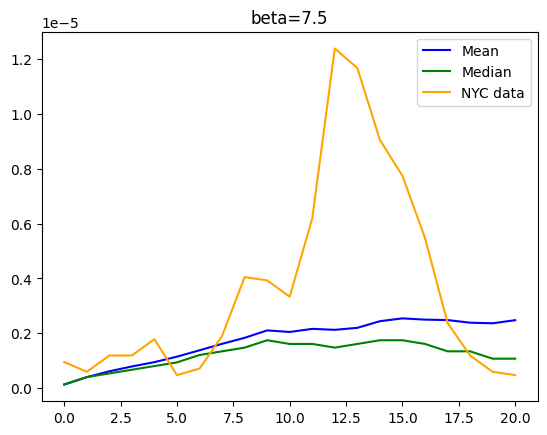

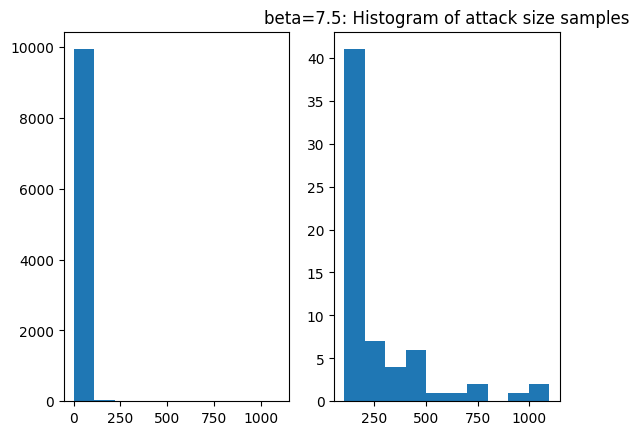

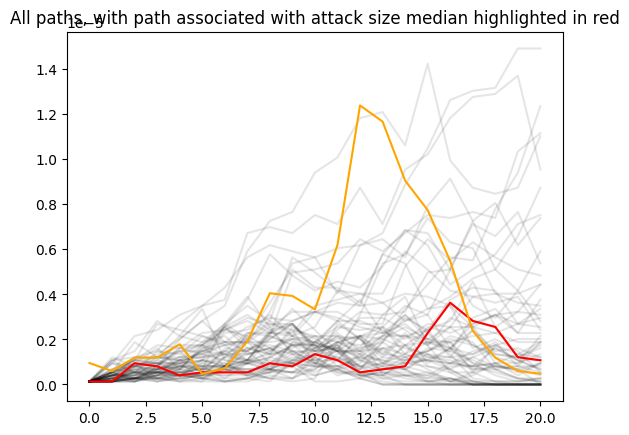

Probability of large outbreak: 0.0082
(148.0, array([ 1.,  3.,  7.,  5.,  4.,  3.,  6., 11., 11.,  9.,  7., 12.,  9.,
        8., 17.,  7.,  6.,  5.,  6.,  4.,  7.]))


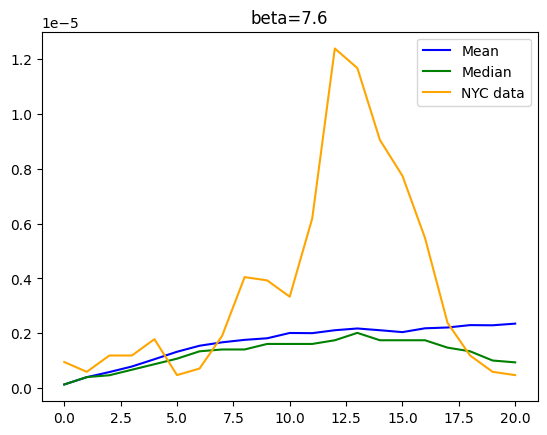

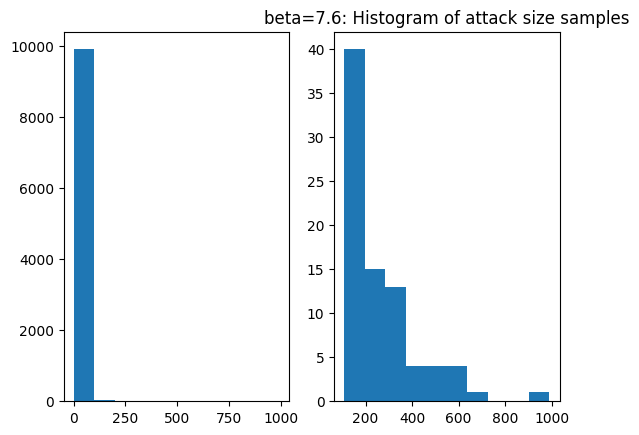

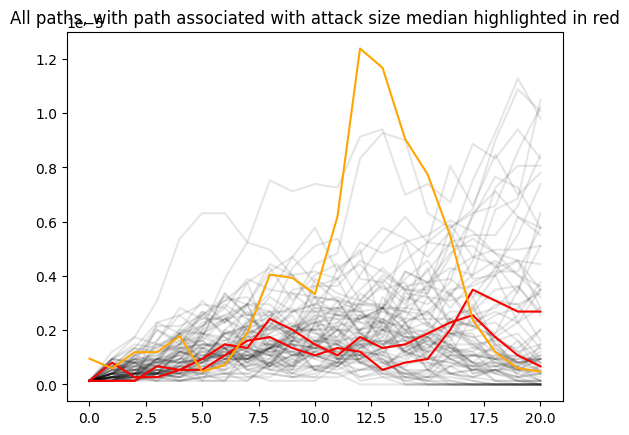

Probability of large outbreak: 0.0065
(110.0, array([ 1.,  4.,  4., 10., 11., 12.,  4.,  9., 12.,  5.,  6., 11.,  6.,
        2.,  3.,  2.,  5.,  3.,  0.,  0.,  0.]))


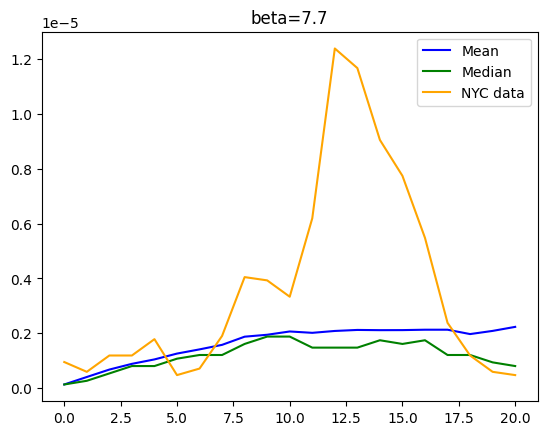

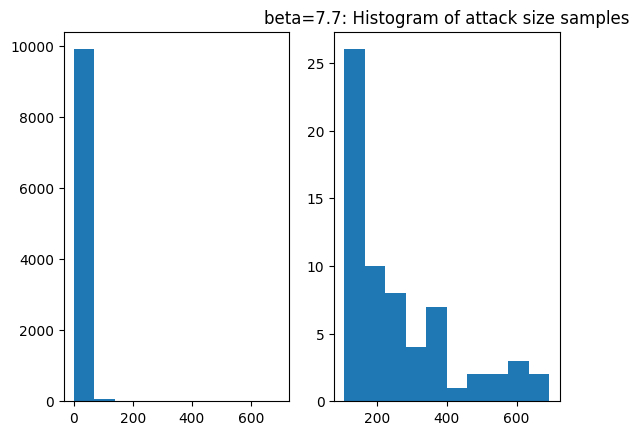

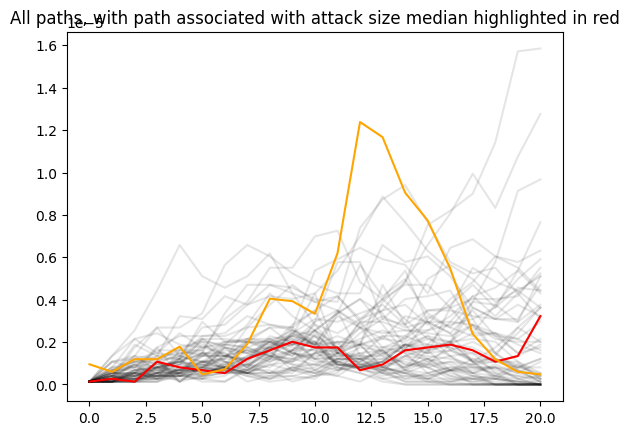

Probability of large outbreak: 0.0079
(115.0, array([ 1.,  2.,  7., 14.,  8., 10.,  8., 13., 14., 13.,  6.,  7.,  7.,
        4.,  1.,  0.,  0.,  0.,  0.,  0.,  0.]))


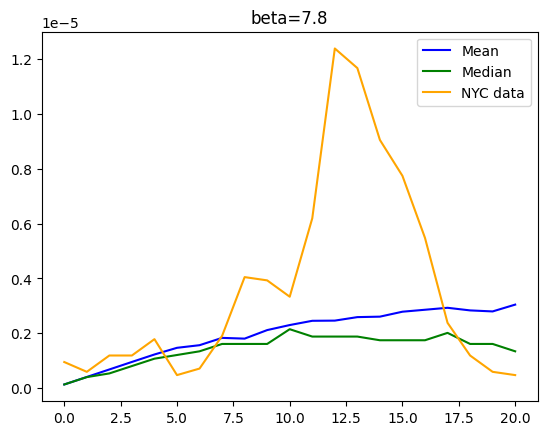

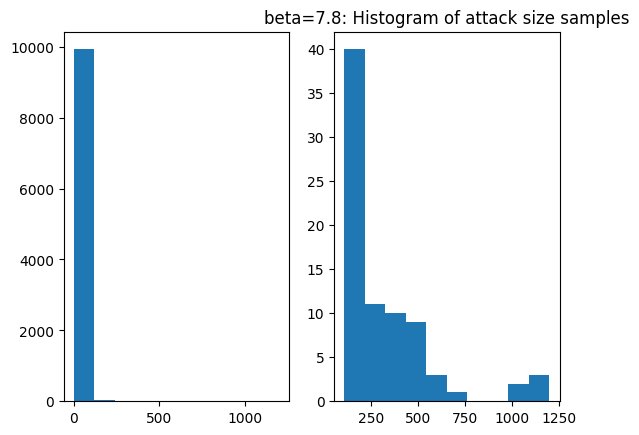

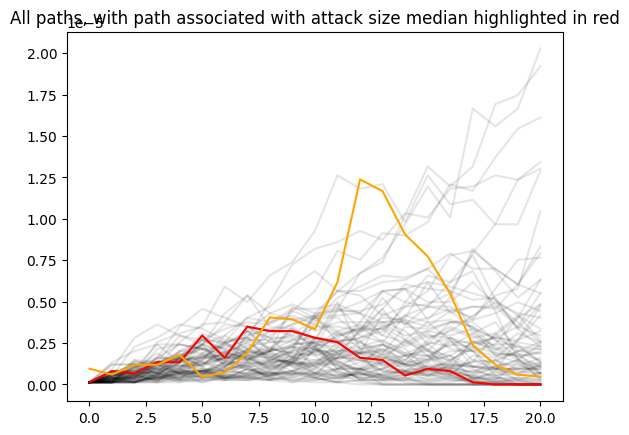

Probability of large outbreak: 0.0104
(169.0, array([ 1.,  3.,  4.,  2.,  6., 19., 19., 18., 13., 13., 23., 17., 10.,
        6.,  4.,  6.,  4.,  1.,  0.,  0.,  0.]))


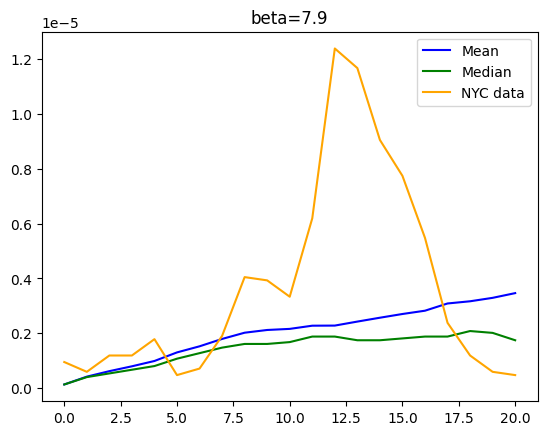

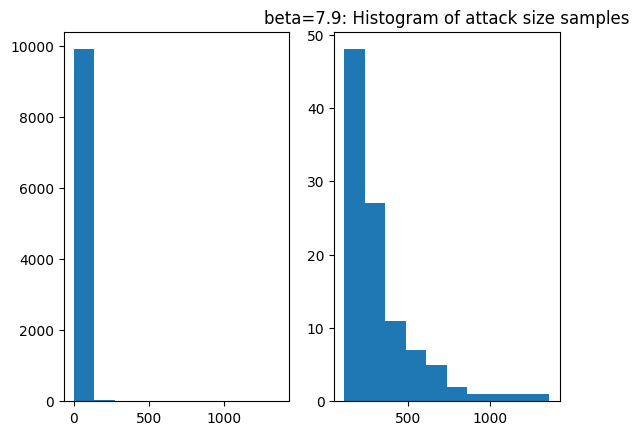

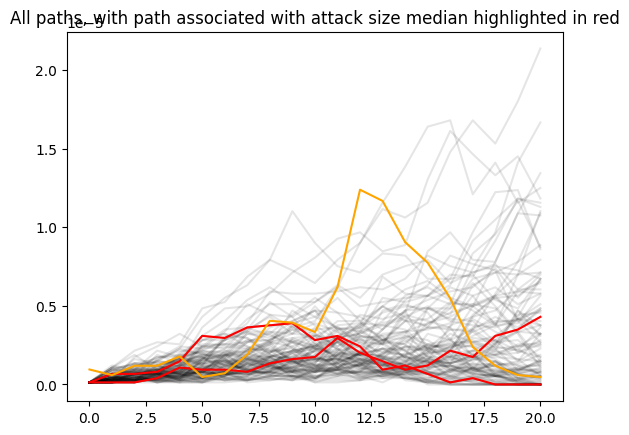

Probability of large outbreak: 0.0126
(556.0, array([ 1.,  2.,  1.,  1.,  1.,  3.,  5.,  2., 10., 12., 14., 31., 43.,
       50., 49., 49., 62., 62., 58., 57., 43.]))


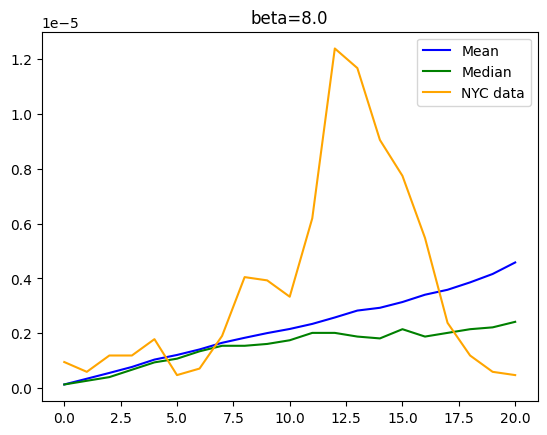

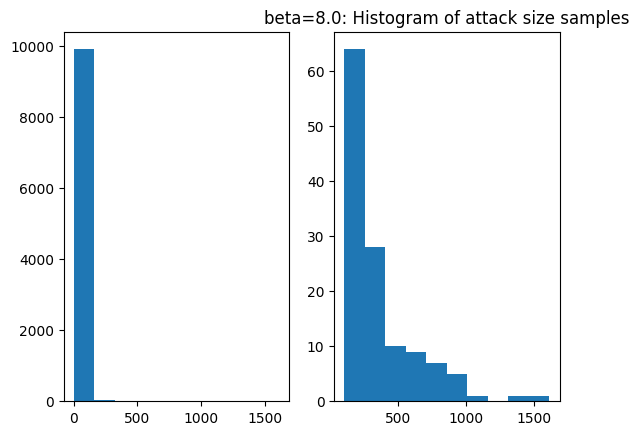

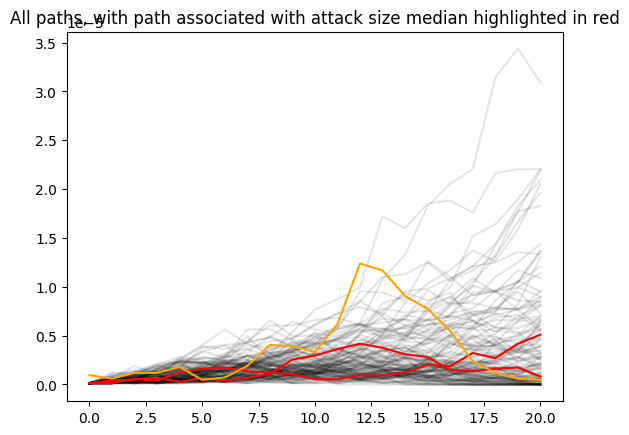

[5.504044693116402e-05, 5.7122689326210275e-05, 4.966691816975435e-05, 5.416724850743495e-05, 5.201783700287108e-05, 5.362989563129398e-05, 5.013710193637769e-05, 5.134614590769487e-05, 4.8525043307954784e-05, 4.476357317496801e-05, 4.5838278927249947e-05]


[<Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>]

In [41]:
# 'parameter sweep'
betas_to_try = np.linspace(7,8,11)
figures = []
mses = []
pools = []
with Pool(12) as p:
    for beta in betas_to_try:
        mse, pool, plot1, plot2 = calib_obj(beta, 
                  sim_pop=sum(patch_pop['pop']), 
                  dataset=biweekly_cases, data_pop=nyc_population,
                  base_config=config, seed=I, pool_worker=p, plot=True, draws=10    219K000, obj="median_attacksize", drop_zero=True)
        figures.append(plot1)
        figures.append(plot2)
        pools.append(pool)
        mses.append(mse)
print(mses)
figures

Probability of large outbreak: 0.0064
(142.0, array([ 2.,  7.,  7.,  8.,  9.,  6.,  6., 12.,  6., 10.,  7.,  5.,  9.,
        8., 10.,  7.,  8.,  7.,  8.,  0.,  0.]))


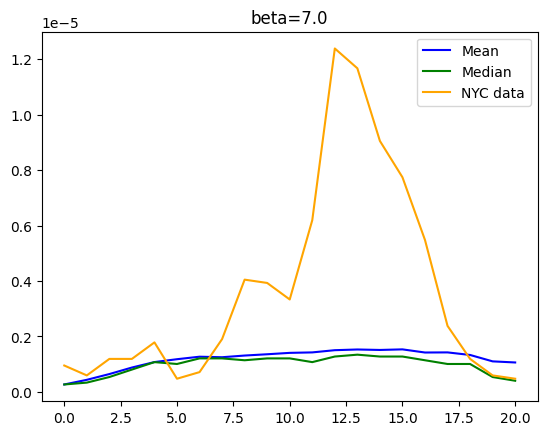

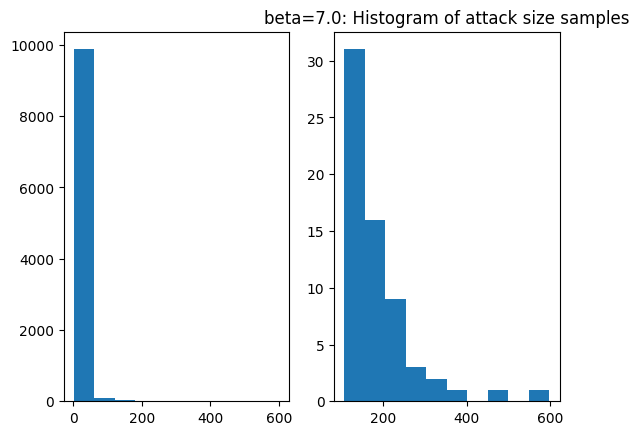

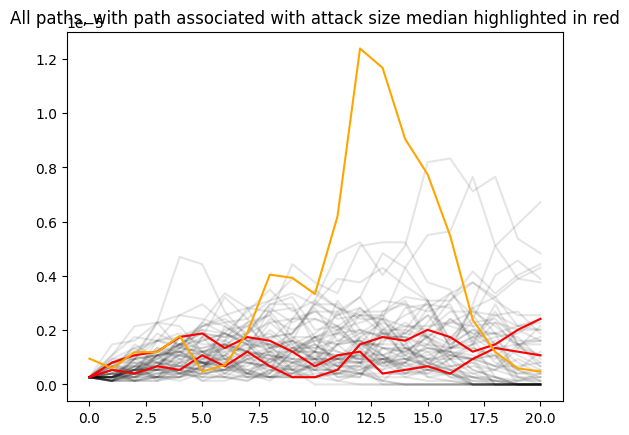

Probability of large outbreak: 0.0063
(163.0, array([ 2.,  2.,  9., 10.,  8.,  6.,  6.,  7.,  5., 12., 16., 14.,  5.,
        6.,  7.,  8.,  7.,  5.,  9.,  9., 10.]))


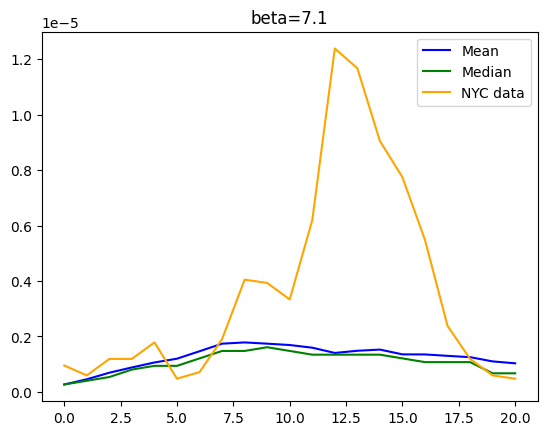

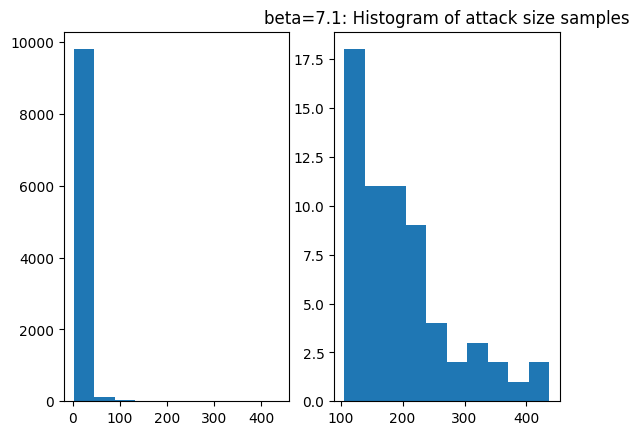

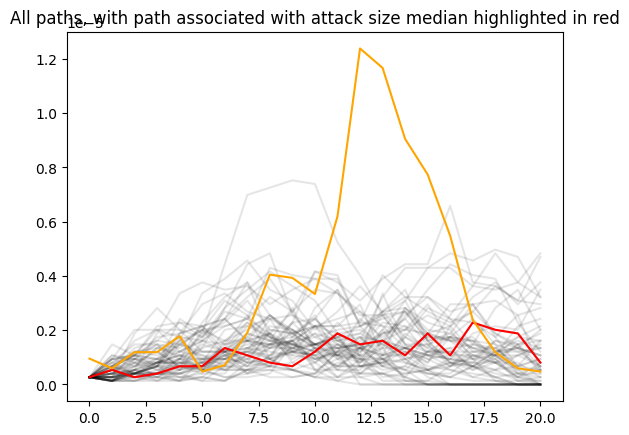

Probability of large outbreak: 0.0095
(122.0, array([ 2.,  7.,  6.,  5.,  4.,  6.,  4.,  2.,  2.,  6.,  8.,  5.,  7.,
       15., 14., 17.,  7.,  4.,  1.,  0.,  0.]))


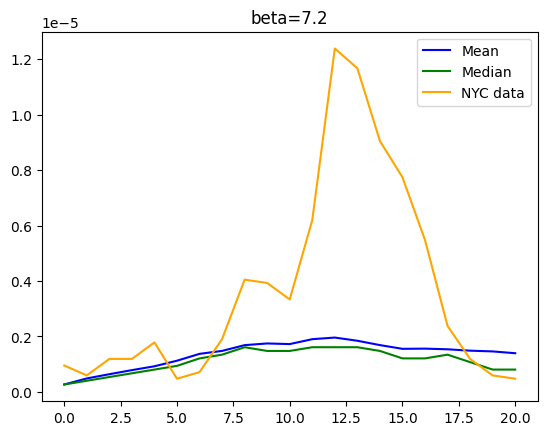

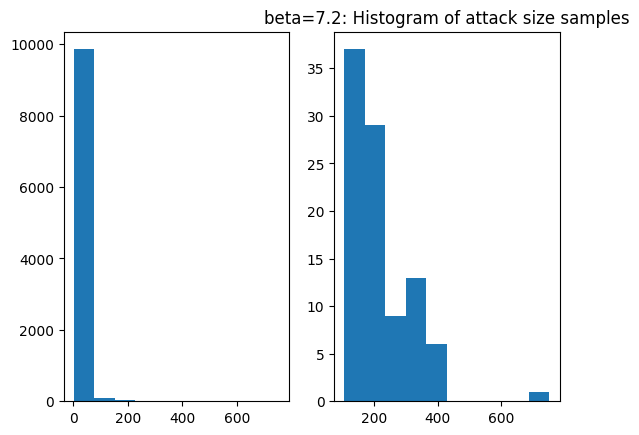

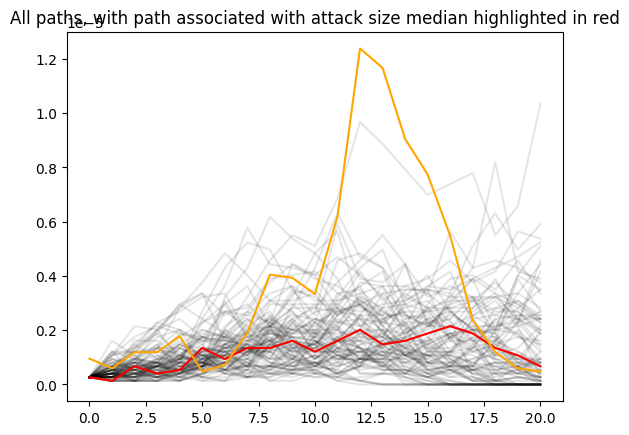

Probability of large outbreak: 0.0082
(206.0, array([ 2.,  2.,  4.,  4., 13., 12., 11., 10.,  7.,  8., 23., 14., 16.,
       21., 13., 11., 13.,  9.,  3.,  5.,  5.]))


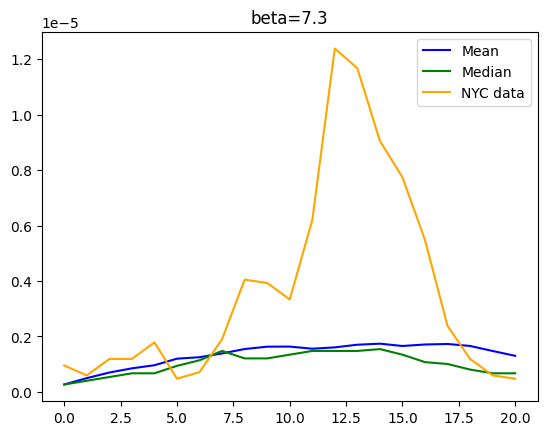

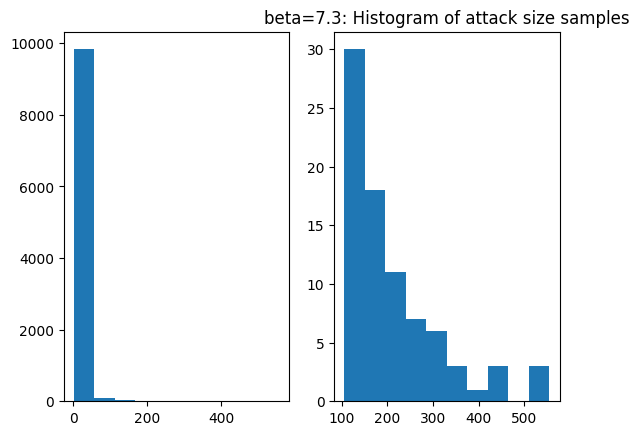

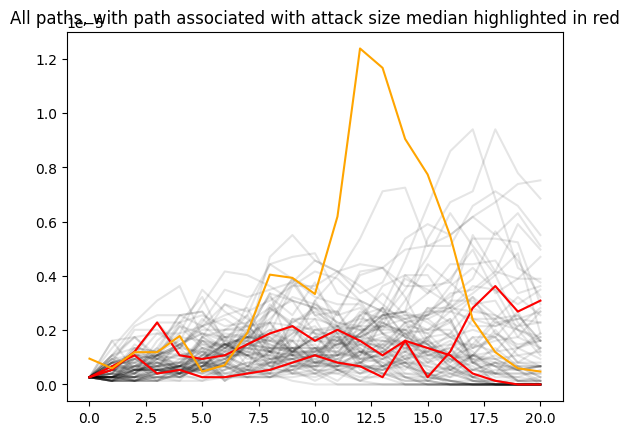

Probability of large outbreak: 0.0106
(108.0, array([ 2.,  3.,  3.,  4.,  9., 10.,  5.,  3.,  8., 14., 24., 13.,  4.,
        3.,  2.,  1.,  0.,  0.,  0.,  0.,  0.]))


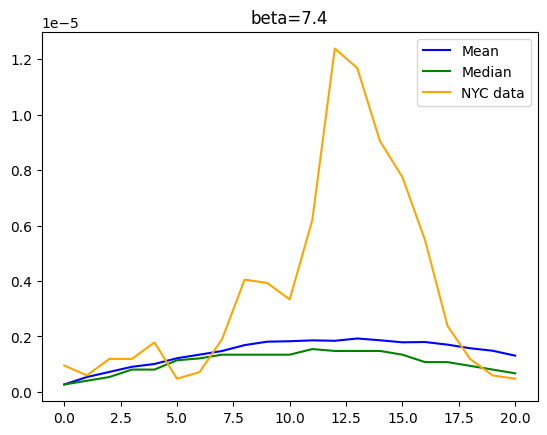

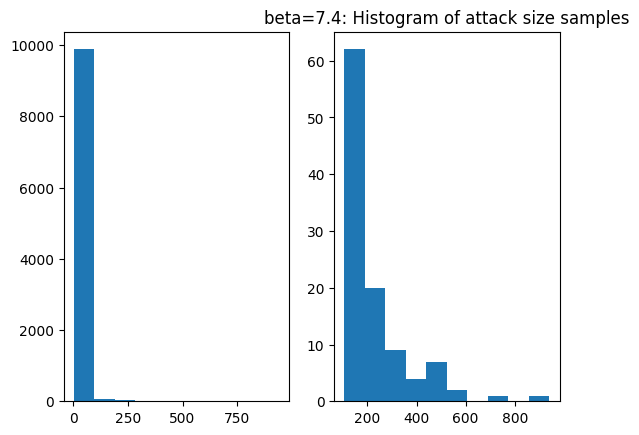

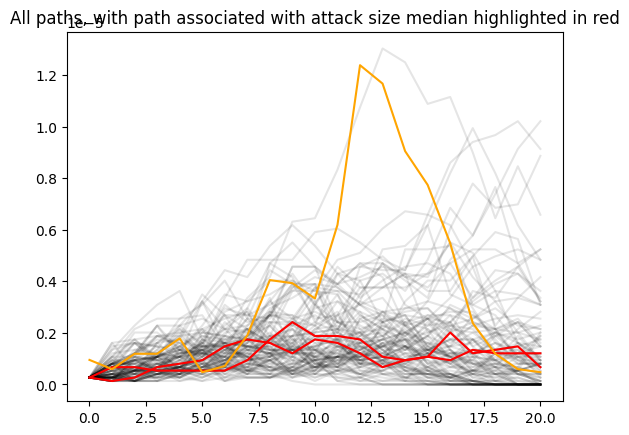

Probability of large outbreak: 0.0136
(224.0, array([ 2.,  4.,  3., 10.,  6., 11., 14., 13., 20., 24., 17., 15., 22.,
       14., 13., 12.,  9.,  9.,  6.,  0.,  0.]))


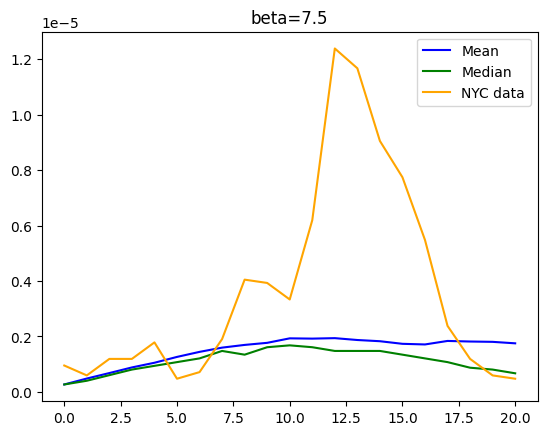

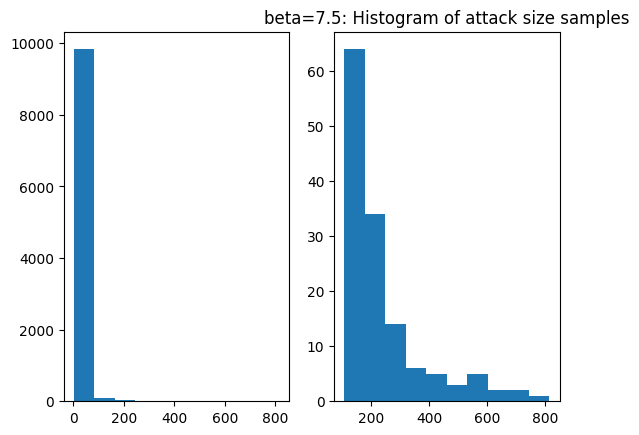

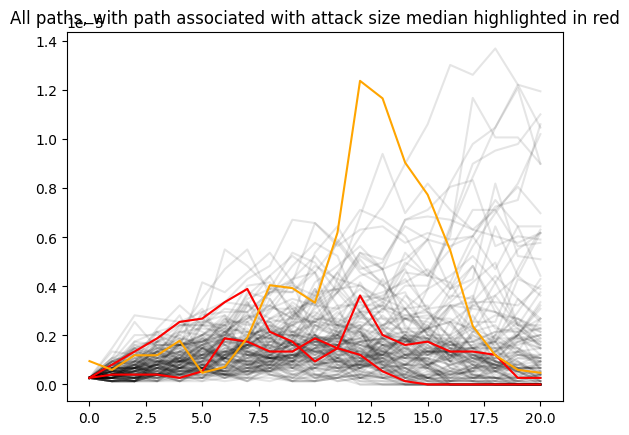

Probability of large outbreak: 0.0153
(205.0, array([ 2.,  4.,  6.,  7.,  8., 11., 10.,  9.,  6.,  7.,  7., 12., 10.,
       11., 15.,  6., 14., 14., 22., 16.,  8.]))


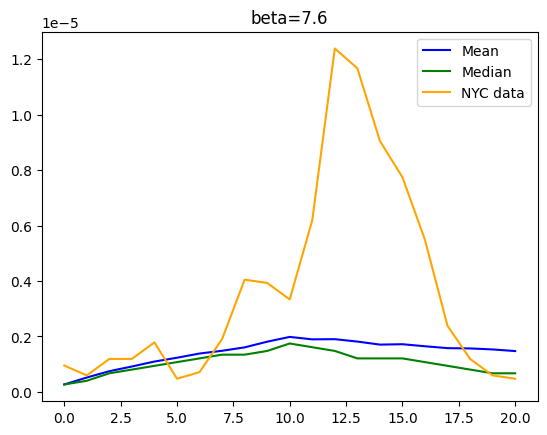

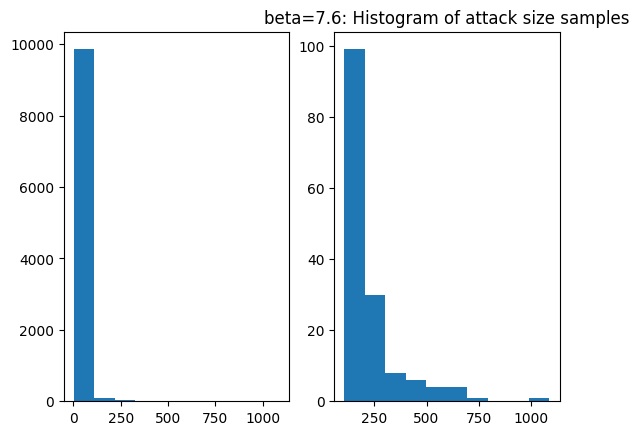

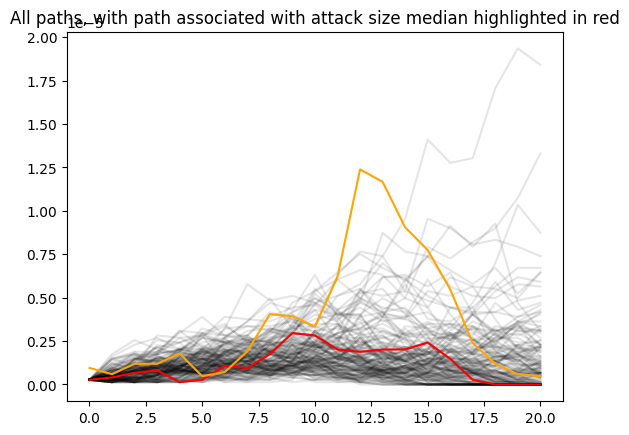

Probability of large outbreak: 0.018
(194.0, array([ 2.,  3.,  2.,  8.,  5.,  9.,  8.,  7.,  7.,  4.,  7., 11., 13.,
       17., 19., 13.,  9.,  7., 11., 15., 17.]))


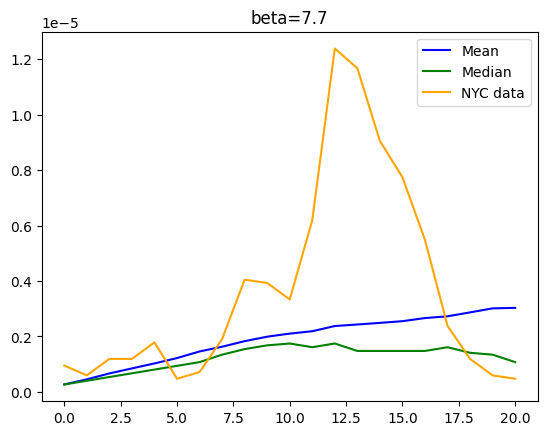

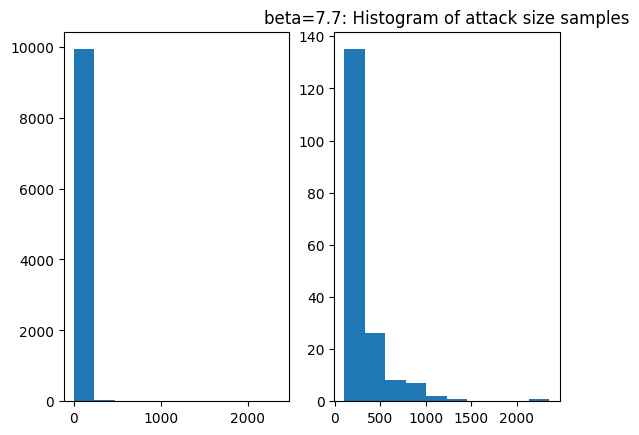

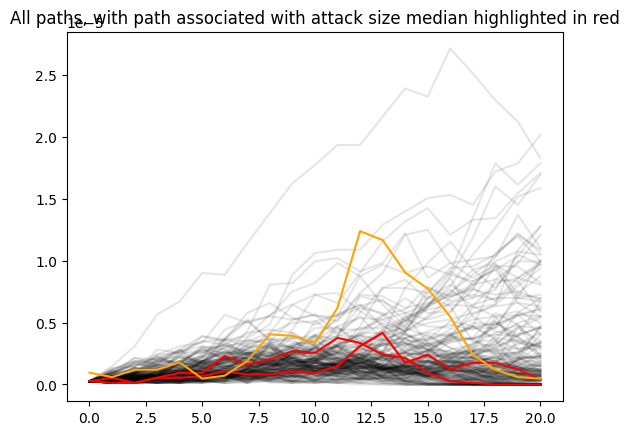

Probability of large outbreak: 0.0178
(349.0, array([ 2.,  1.,  1., 10., 11., 19., 19., 21., 23., 24., 29., 26., 27.,
       21., 26., 31., 24., 15.,  9.,  4.,  6.]))


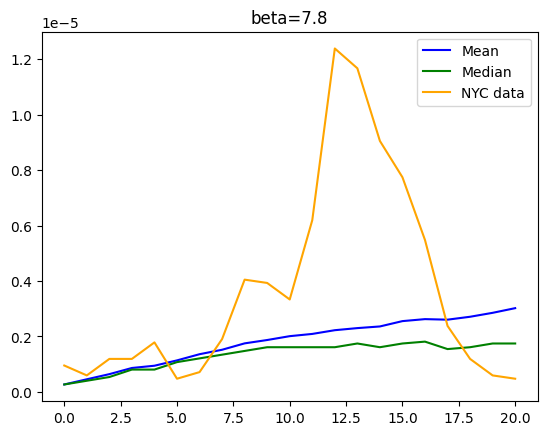

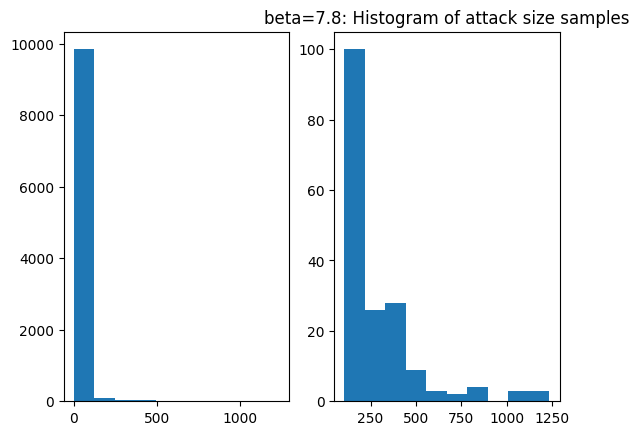

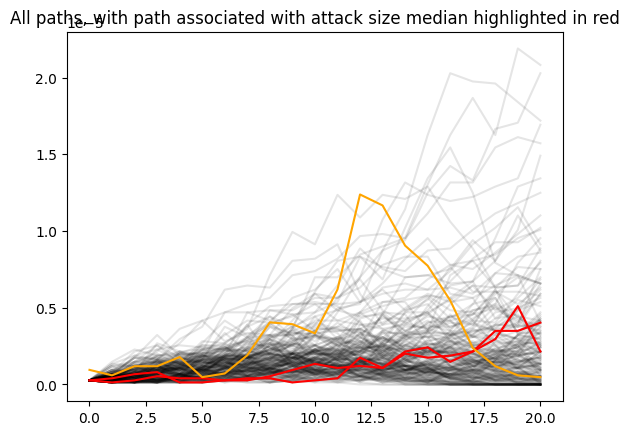

Probability of large outbreak: 0.0207
(144.0, array([ 2.,  1.,  2.,  1.,  2.,  2.,  8.,  3.,  6.,  6.,  5.,  8.,  8.,
       15., 12., 12., 10., 12., 12.,  9.,  8.]))


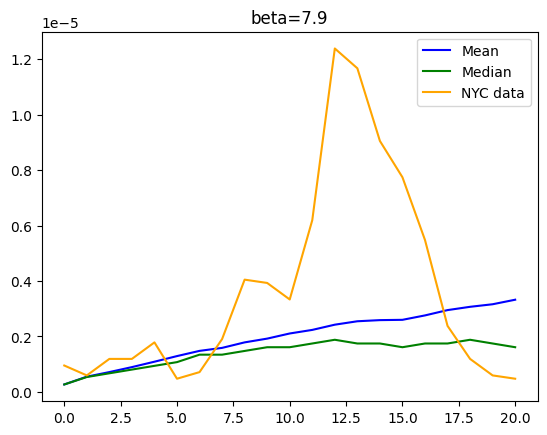

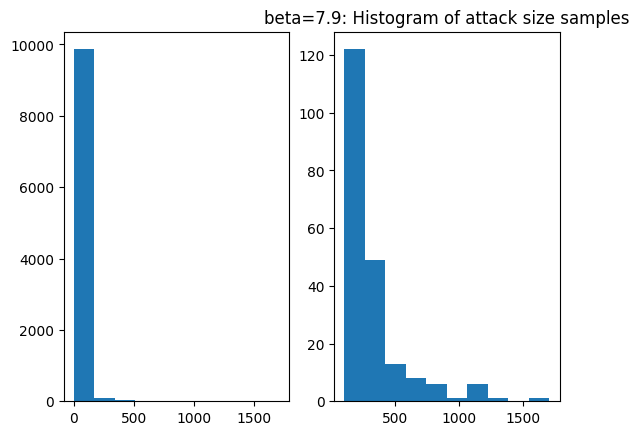

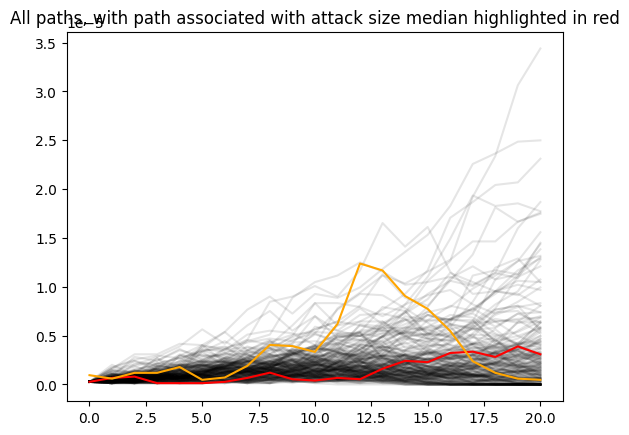

In [ ]:
dulles_index = patch_pop[patch_pop['zipcode'] == 20166].index
I = np.zeros(len(patch_pop.index))
np.put(I,dulles_index,2)
# 'parameter sweep'
betas_to_try = np.linspace(7,8,11)
figures = []
mses = []
pools = []
with Pool(12) as p:
    for beta in betas_to_try:
        mse, pool, plot1, plot2 = calib_obj(beta, 
                  sim_pop=sum(patch_pop['pop']), 
                  dataset=biweekly_cases, data_pop=nyc_population,
                  base_config=config, seed=I, pool_worker=p, plot=True, draws=10000, obj="median_attacksize", drop_zero=True)
        figures.append(plot1)
        figures.append(plot2)
        pools.append(pool)
        mses.append(mse)
print(mses)
figures

Probability of large outbreak: 0.0091
(230.0, array([ 3.,  5.,  8.,  8., 16., 10., 10., 15., 17., 26., 26., 24., 12.,
       17., 11., 10.,  3.,  3.,  3.,  1.,  2.]))


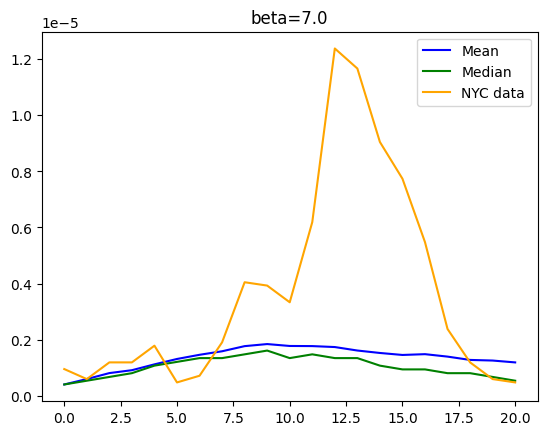

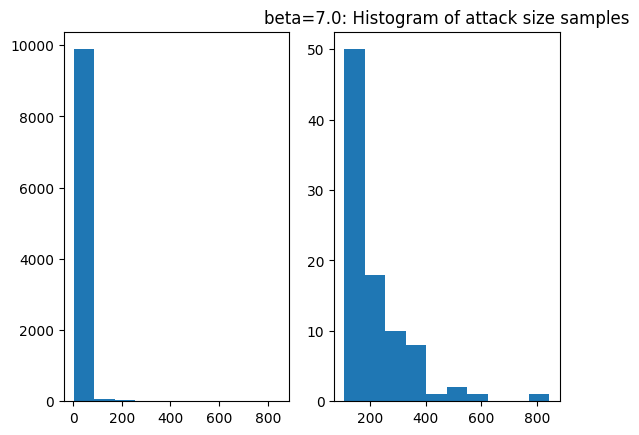

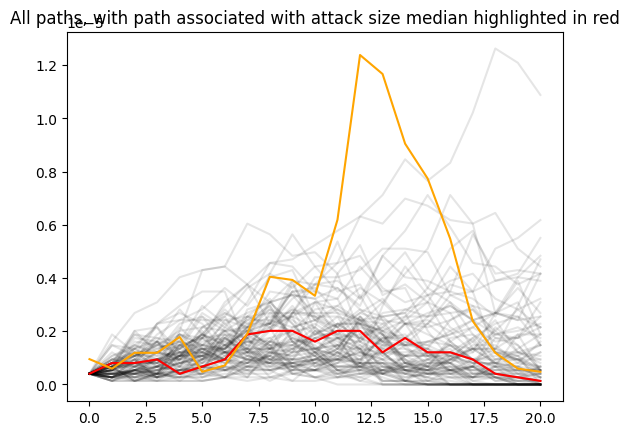

Probability of large outbreak: 0.0114
(140.0, array([ 3.,  6.,  7.,  9.,  8., 10.,  9.,  9.,  8.,  6.,  8.,  8.,  7.,
        7., 10.,  6.,  7.,  7.,  3.,  1.,  1.]))


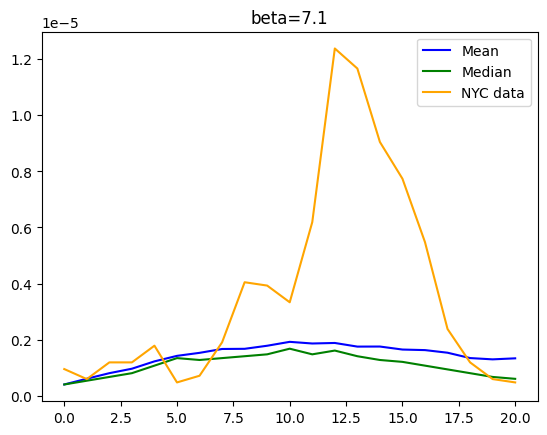

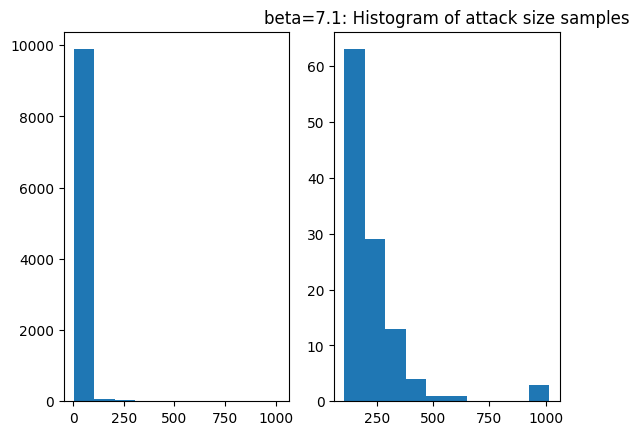

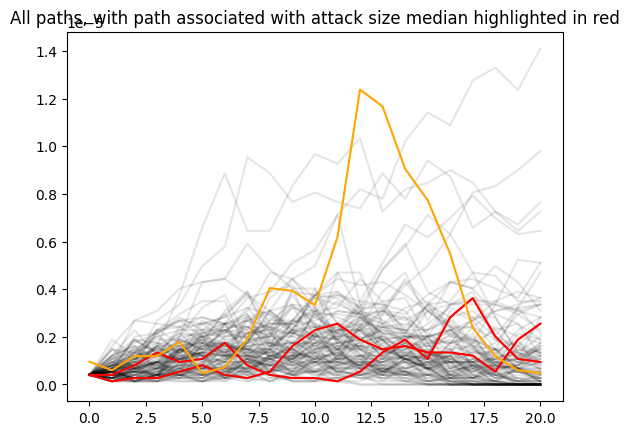

Probability of large outbreak: 0.0143
(152.0, array([ 3.,  8.,  8.,  6.,  5.,  6.,  4.,  1.,  3.,  6., 10., 16., 20.,
       13.,  9., 13., 10., 10.,  1.,  0.,  0.]))


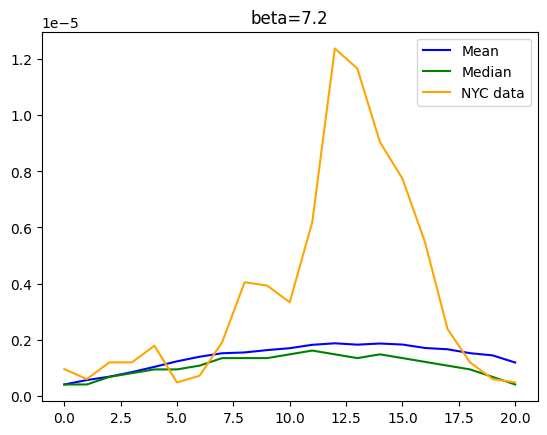

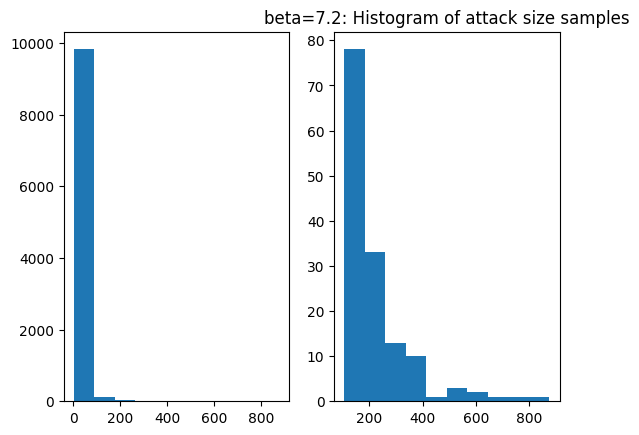

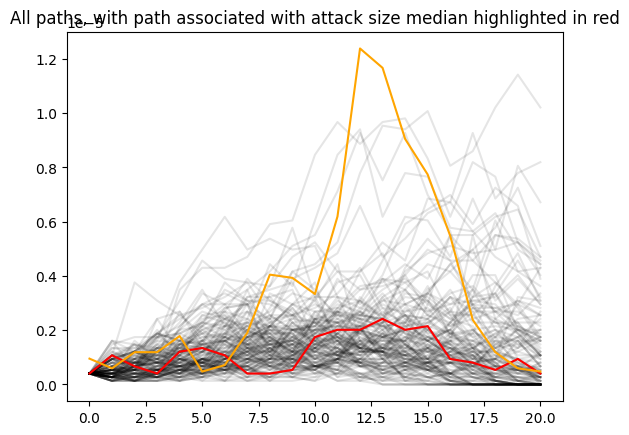

Probability of large outbreak: 0.0145
(208.0, array([ 3.,  3.,  6.,  7.,  9.,  2.,  3.,  9., 11.,  4.,  1.,  5.,  7.,
       10., 20., 15., 18., 13., 13., 24., 25.]))


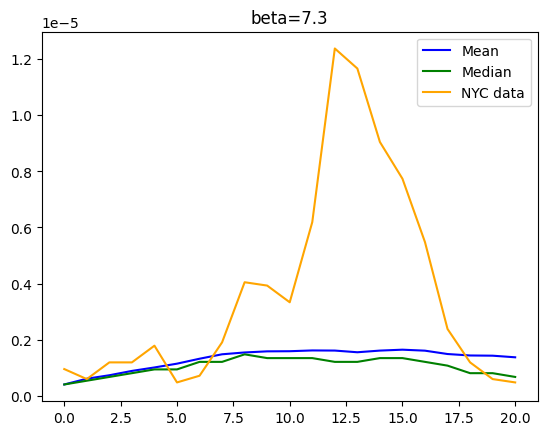

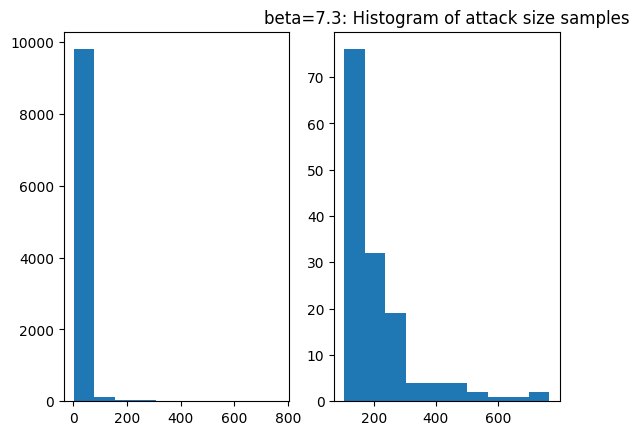

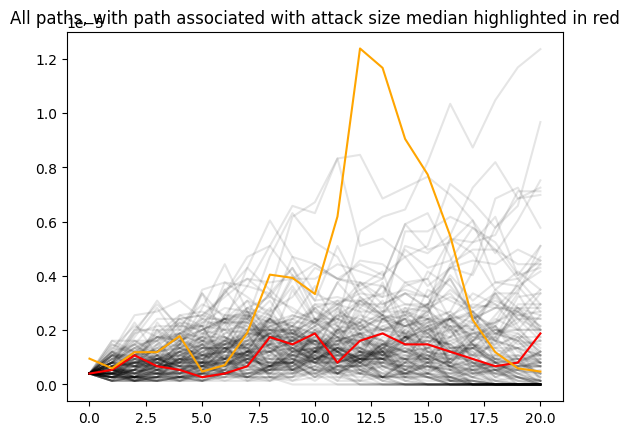

Probability of large outbreak: 0.0179
(132.0, array([ 3.,  4.,  2.,  4.,  8.,  5.,  3.,  7.,  6.,  4.,  7.,  5.,  9.,
        9.,  9.,  9.,  6.,  6.,  6., 16.,  4.]))


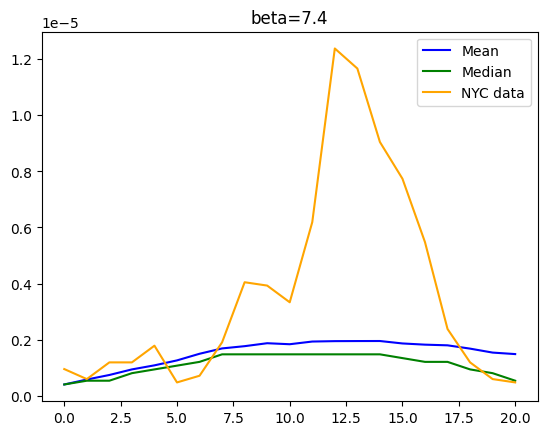

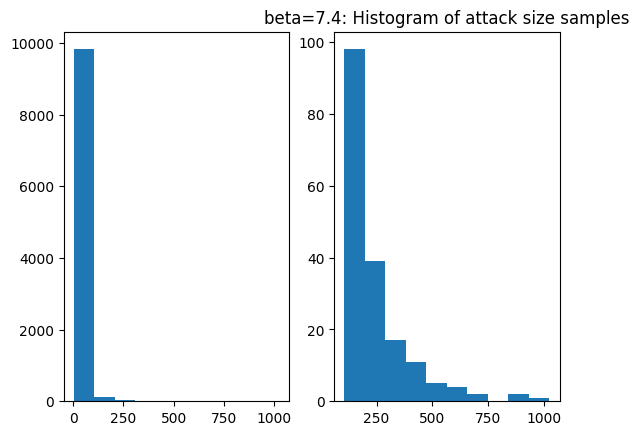

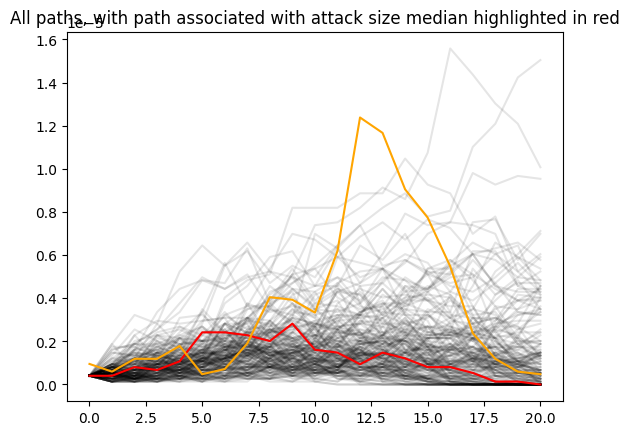

Probability of large outbreak: 0.02
(169.0, array([ 3.,  7., 13.,  7.,  9.,  8.,  6.,  7., 12.,  9.,  7.,  4.,  4.,
        6.,  7., 14., 10., 11., 10.,  6.,  9.]))


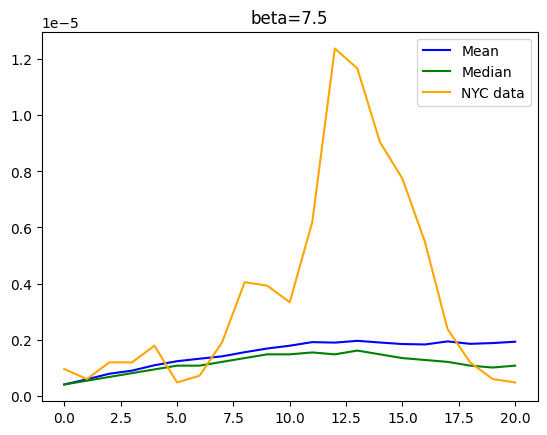

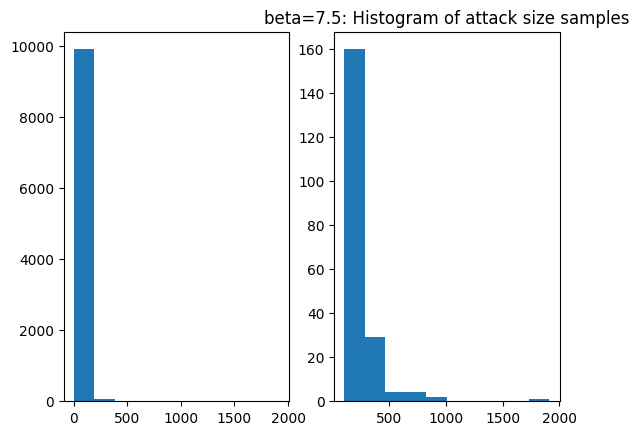

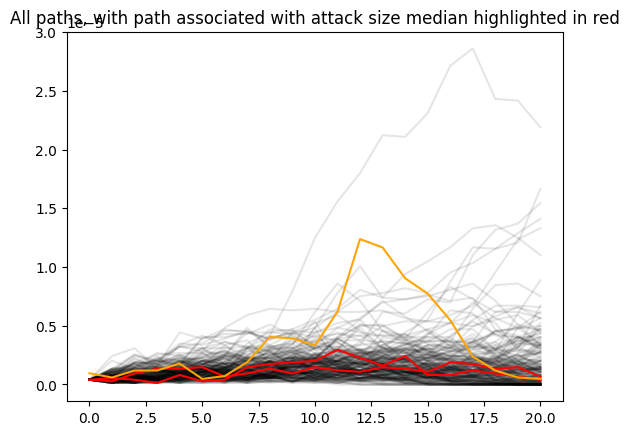

Probability of large outbreak: 0.0254
(156.0, array([ 3.,  6.,  5.,  6.,  6., 12., 13., 13., 10., 13., 14., 17., 13.,
        8., 11.,  4.,  2.,  0.,  0.,  0.,  0.]))


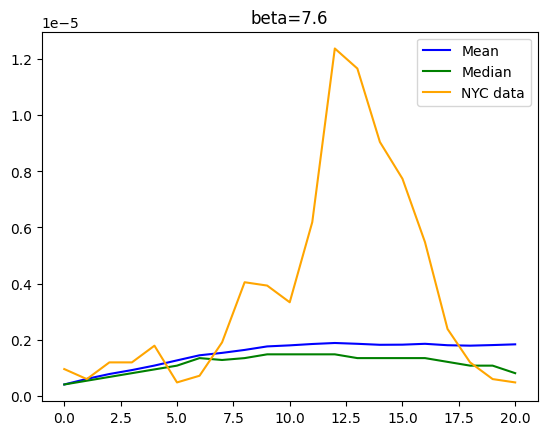

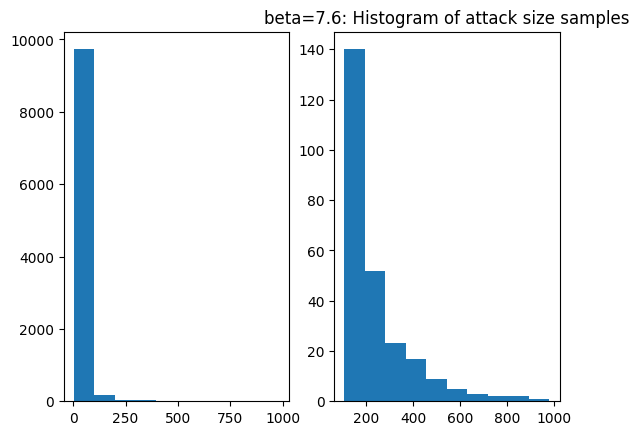

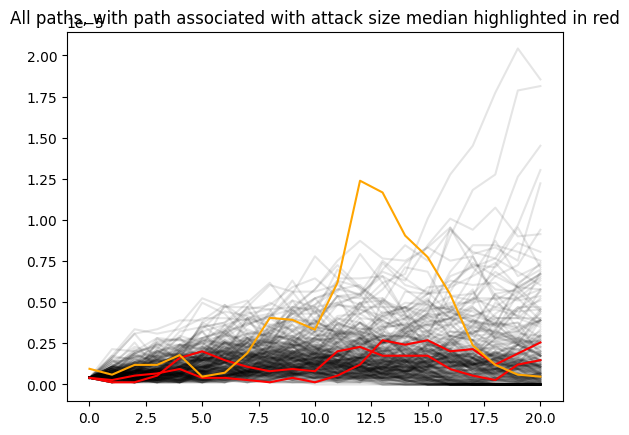

Probability of large outbreak: 0.0269
(395.0, array([ 3.,  5., 12.,  7.,  4., 19., 29., 33., 38., 15., 16., 21., 16.,
       24., 17., 21., 27., 24., 20., 19., 25.]))


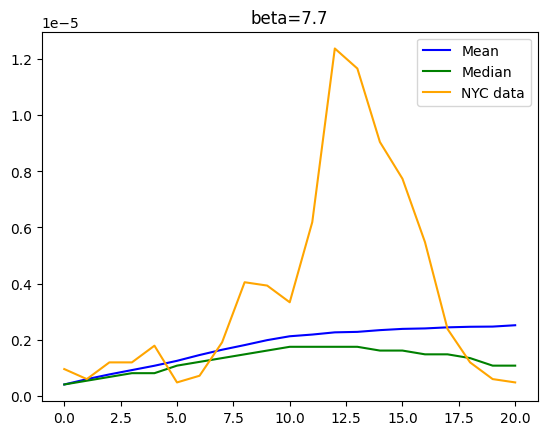

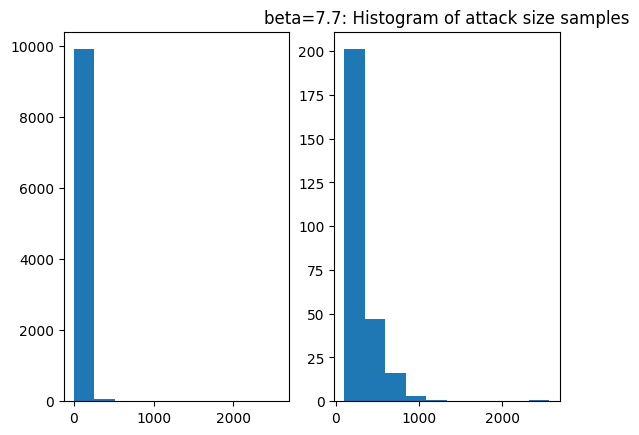

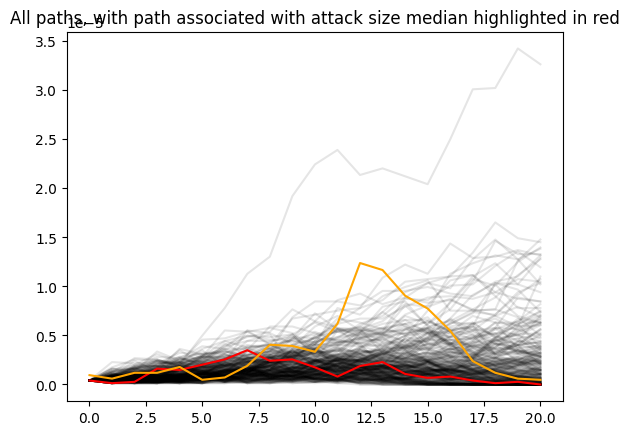

In [ ]:
dulles_index = patch_pop[patch_pop['zipcode'] == 20166].index
I = np.zeros(len(patch_pop.index))
np.put(I,dulles_index,3)
# 'parameter sweep'
betas_to_try = np.linspace(7,8,11)
figures = []
mses = []
pools = []
with Pool(12) as p:
    for beta in betas_to_try:
        mse, pool, plot1, plot2 = calib_obj(beta, 
                  sim_pop=sum(patch_pop['pop']), 
                  dataset=biweekly_cases, data_pop=nyc_population,
                  base_config=config, seed=I, pool_worker=p, plot=True, draws=10000, obj="median_attacksize", drop_zero=True)
        figures.append(plot1)
        figures.append(plot2)
        pools.append(pool)
        mses.append(mse)
print(mses)
figures

Probability of large outbreak: 0.0027
(131.0, array([ 1.,  1.,  3.,  1.,  2.,  2.,  2.,  5.,  6.,  7.,  4.,  2.,  2.,
       10.,  7., 11., 19., 10., 13., 14.,  9.]))


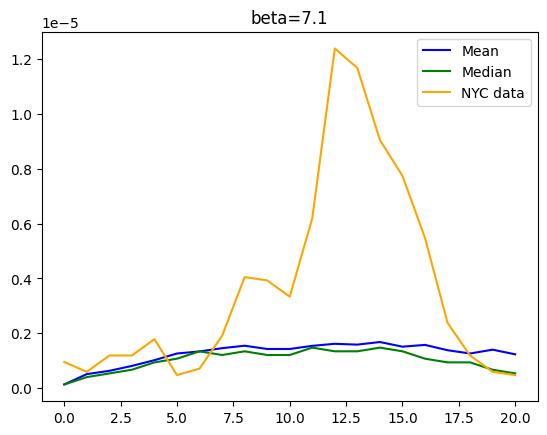

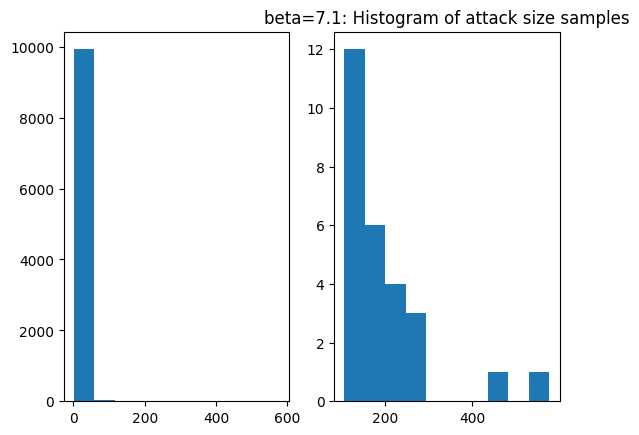

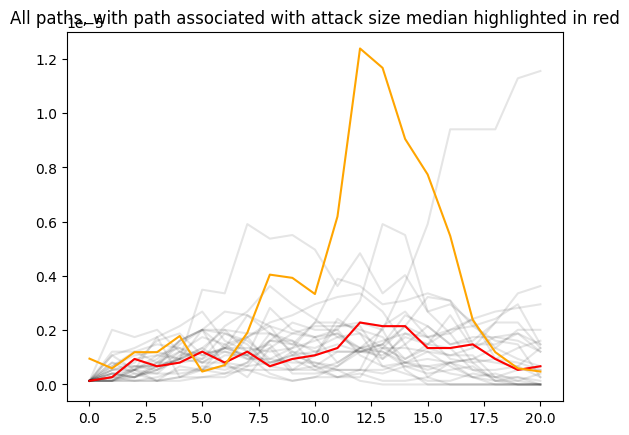

(5.4570263164540684e-05, <spatial_tsir.spatial_tSIR_pool object at 0x7f4fde134550>, <Figure size 640x480 with 1 Axes>, <Figure size 640x480 with 2 Axes>)


In [33]:
with Pool(12) as p:
    print(
        calib_obj(7.1, 
              sim_pop=sum(patch_pop['pop']), 
              dataset=biweekly_cases, data_pop=nyc_population,
              base_config=config, plot=True, seed=I, pool_worker=p, draws=10000,obj="median_attacksize", drop_zero=True)
    )

Probability of large outbreak: 0.0083
(133.0, array([ 1.,  6., 13.,  7., 10.,  3.,  6.,  4., 15., 18.,  9.,  8.,  5.,
        3.,  9.,  6.,  6.,  4.,  0.,  0.,  0.]))


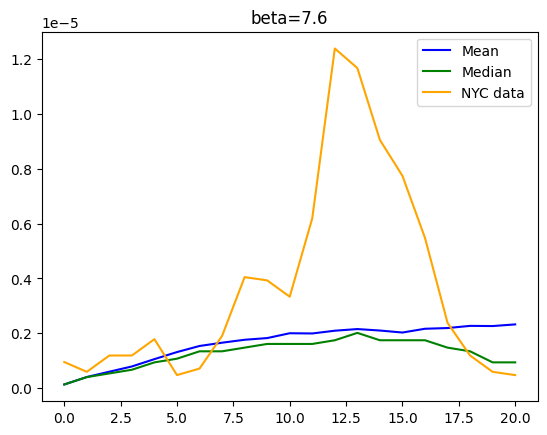

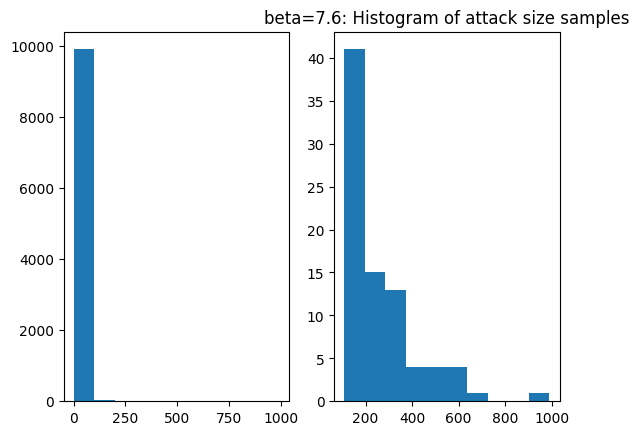

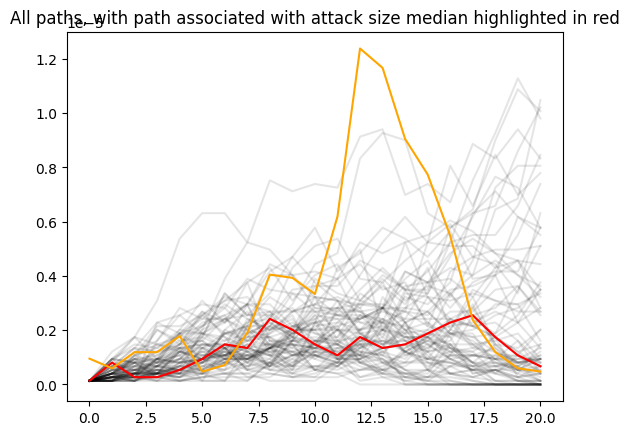

(5.054011659348342e-05, <spatial_tsir.spatial_tSIR_pool object at 0x7fad7a5a7730>, <Figure size 640x480 with 1 Axes>, <Figure size 640x480 with 2 Axes>)


In [40]:
with Pool(12) as p:
    print(
        calib_obj(7.6, 
              sim_pop=sum(patch_pop['pop']), 
              dataset=biweekly_cases, data_pop=nyc_population,
              base_config=config, plot=True, seed=I, pool_worker=p, draws=10000,obj="median_attacksize", drop_zero=True)
    )

Probability of large outbreak: 0.0036
(200.0, array([ 1.,  5.,  9., 11., 10.,  6.,  6.,  5., 12., 11., 10., 13., 16.,
       10., 14.,  9.,  9., 12., 13.,  8., 10.]))


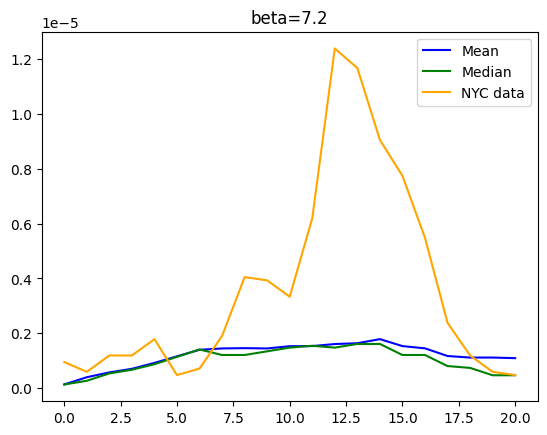

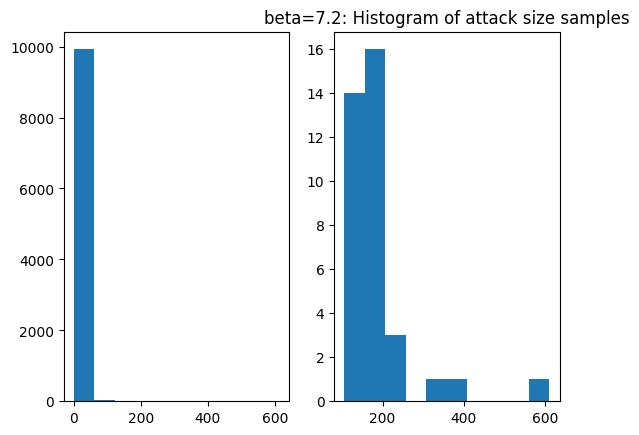

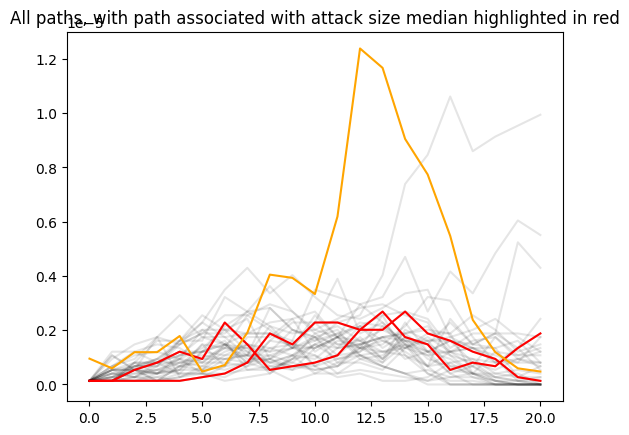

(5.483893960261116e-05, <spatial_tsir.spatial_tSIR_pool object at 0x7f4fde2280d0>, <Figure size 640x480 with 1 Axes>, <Figure size 640x480 with 2 Axes>)


In [34]:
with Pool(12) as p:
    print(
        calib_obj(7.2, 
              sim_pop=sum(patch_pop['pop']), 
              dataset=biweekly_cases, data_pop=nyc_population,
              base_config=config, plot=True, seed=I, pool_worker=p, draws=10000,obj="median_attacksize", drop_zero=True)
    )

Probability of large outbreak: 0.0134
(145.0, array([ 1.,  4.,  8., 10., 11., 19., 26., 14., 13., 10.,  6.,  4.,  5.,
        6.,  3.,  4.,  1.,  0.,  0.,  0.,  0.]))


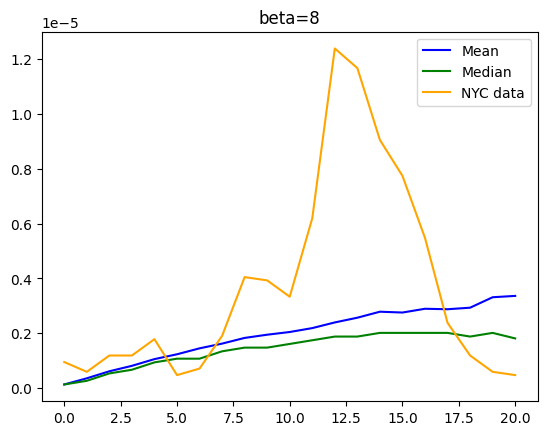

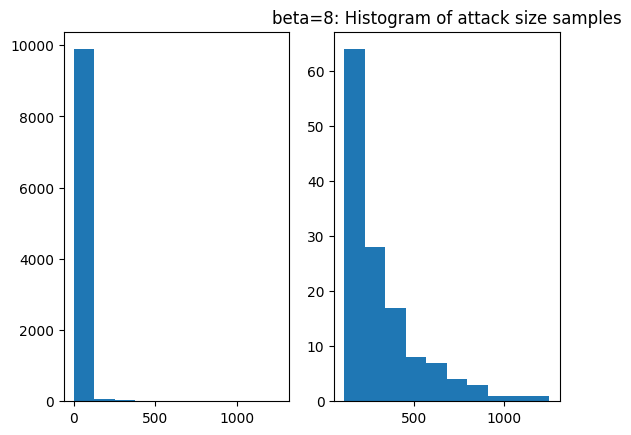

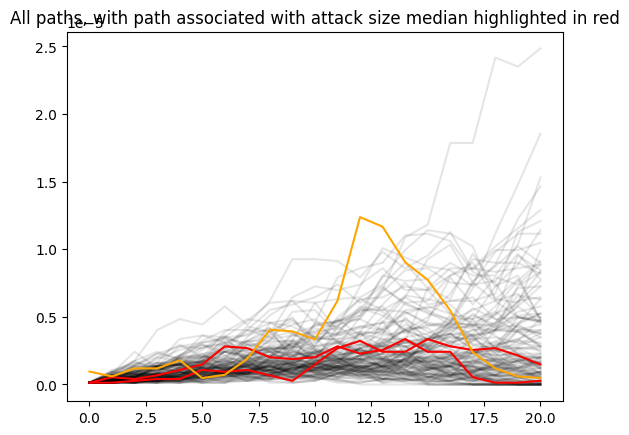

(4.4965080503520876e-05, <spatial_tsir.spatial_tSIR_pool object at 0x7f4fdef66740>, <Figure size 640x480 with 1 Axes>, <Figure size 640x480 with 2 Axes>)


In [35]:
with Pool(12) as p:
    print(
        calib_obj(8, 
              sim_pop=sum(patch_pop['pop']), 
              dataset=biweekly_cases, data_pop=nyc_population,
              base_config=config, plot=True, seed=I, pool_worker=p, draws=10000,obj="median_attacksize", drop_zero=True)
    )

Probability of large outbreak: 0.018571428571428572
(161.0, array([ 1.,  2.,  2.,  3.,  4.,  4.,  3.,  6.,  3., 10.,  8.,  4.,  9.,
        8.,  9., 15., 10., 12., 12., 18., 18.]))


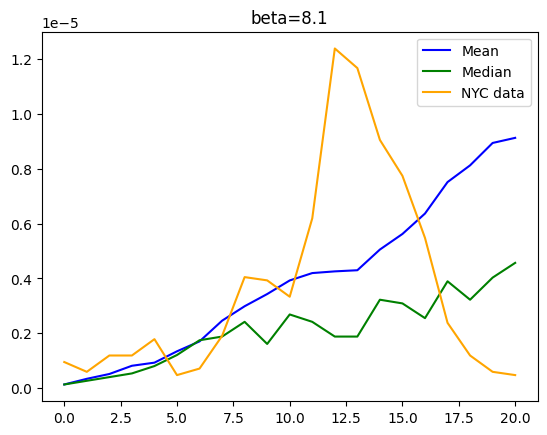

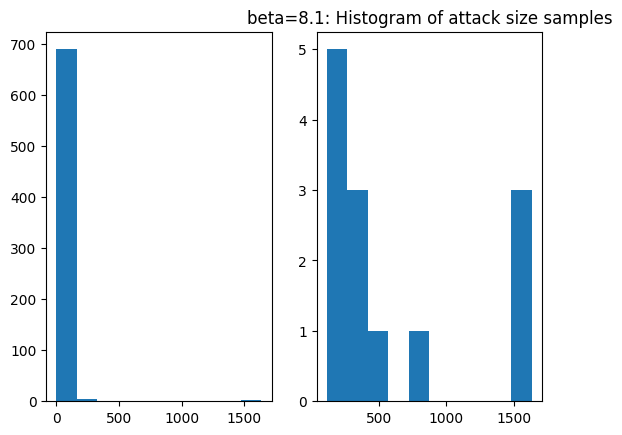

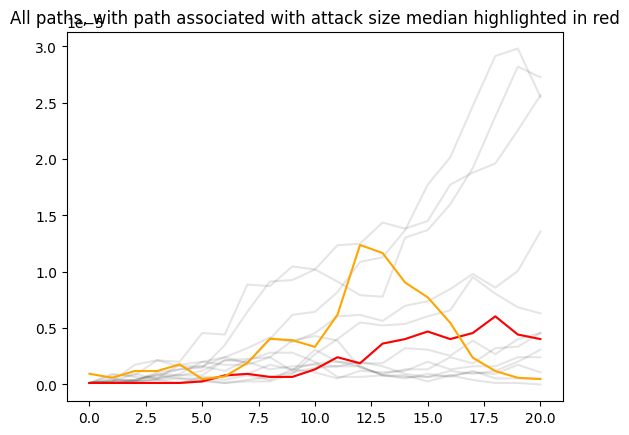

(3.388217743311341e-05, <spatial_tsir.spatial_tSIR_pool object at 0x7f4fb7454a30>, <Figure size 640x480 with 1 Axes>, <Figure size 640x480 with 2 Axes>)


In [40]:
with Pool(12) as p:
    print(
        calib_obj(8.1, 
              sim_pop=sum(patch_pop['pop']), 
              dataset=biweekly_cases, data_pop=nyc_population,
              base_config=config, plot=True, seed=I, pool_worker=p, draws=700,obj="median_attacksize", drop_zero=True)
    )

Probability of large outbreak: 0.18
(361.0, array([ 1.,  5.,  8.,  5.,  9., 14., 18., 14., 17., 21., 21., 30., 27.,
       37., 39., 33., 18.,  8., 12., 15.,  9.]))


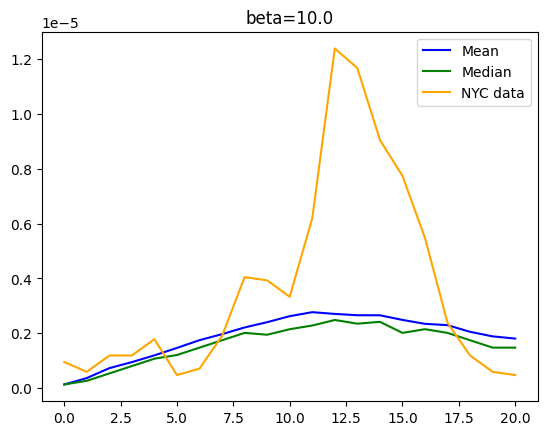

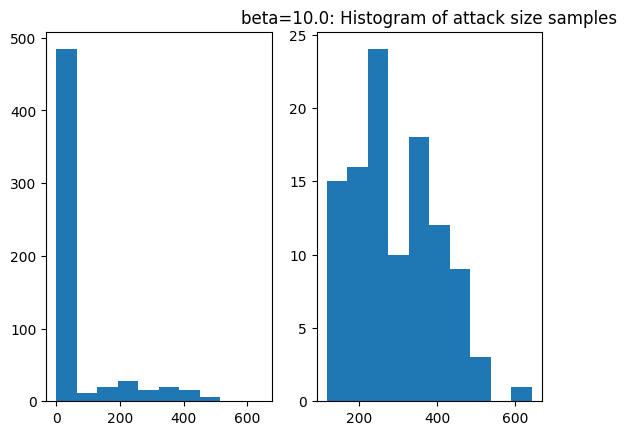

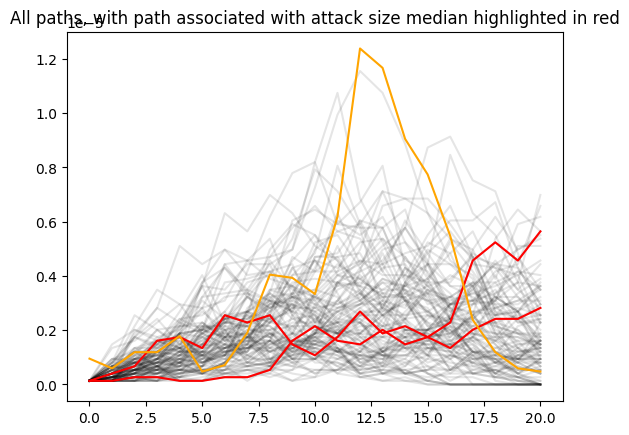

Probability of large outbreak: 0.2
(599.0, array([ 1.,  5., 13., 32., 48., 74., 77., 75., 63., 72., 43., 35., 20.,
       15.,  9.,  6.,  8.,  1.,  1.,  1.,  0.]))


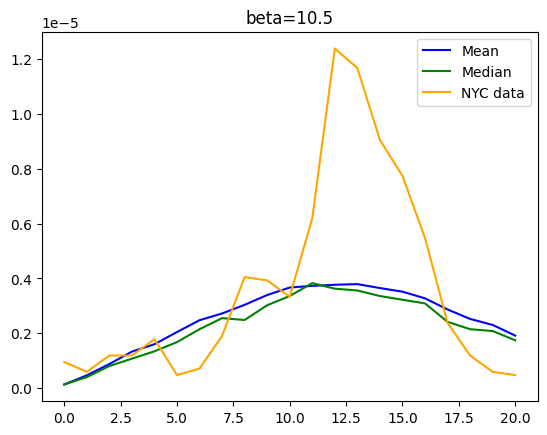

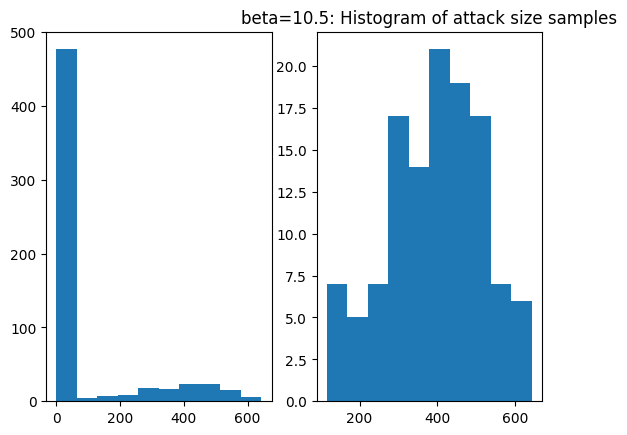

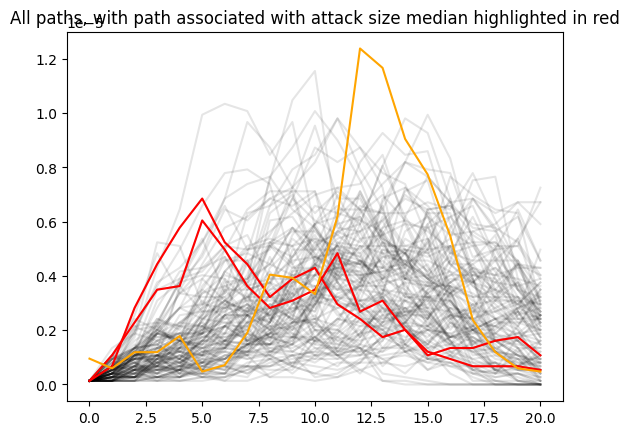

Probability of large outbreak: 0.24833333333333332
(492.0, array([ 1.,  1.,  5.,  9., 11., 24., 38., 52., 48., 44., 39., 31., 34.,
       26., 30., 23., 16., 11., 19., 19., 11.]))


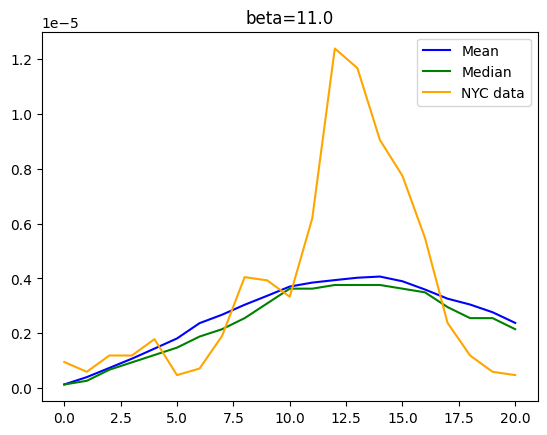

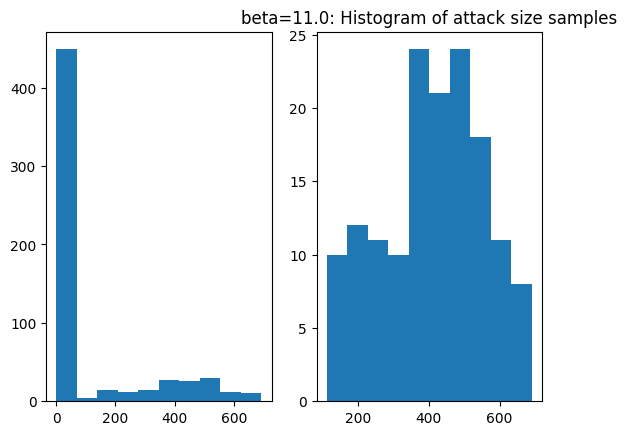

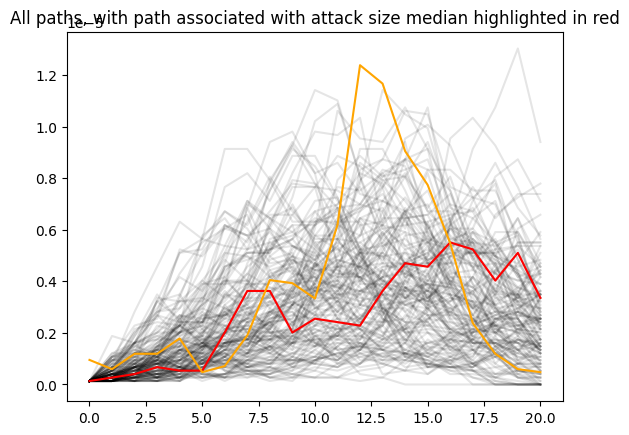

Probability of large outbreak: 0.2733333333333333
(647.0, array([ 1.,  1.,  3.,  9., 15., 22., 37., 47., 55., 52., 48., 62., 49.,
       53., 58., 52., 32., 19., 15.,  8.,  9.]))


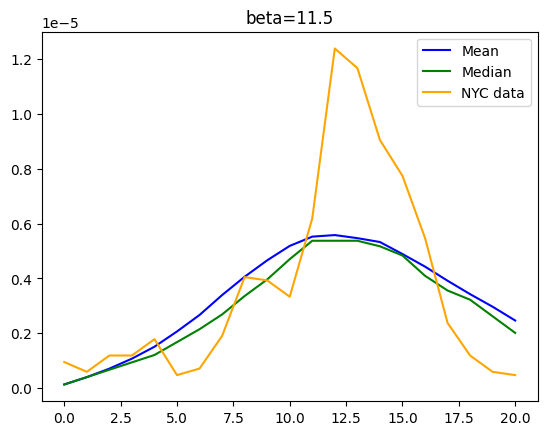

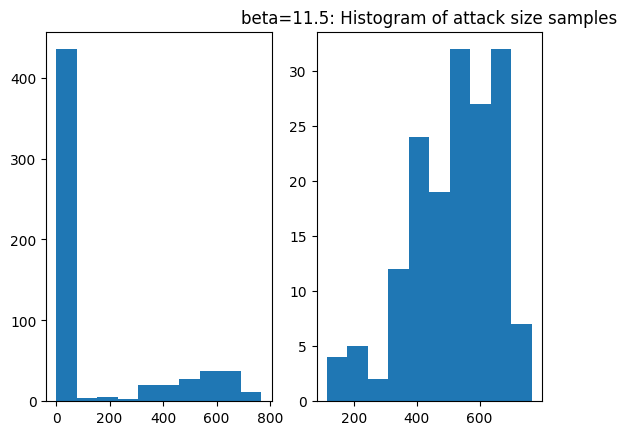

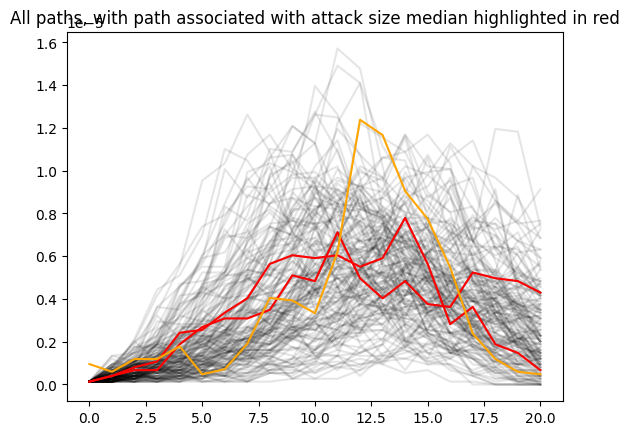

Probability of large outbreak: 0.33166666666666667
(537.0, array([ 1.,  1.,  2.,  7., 16., 20., 54., 54., 47., 76., 82., 58., 39.,
       34., 20., 10.,  7.,  2.,  1.,  3.,  3.]))


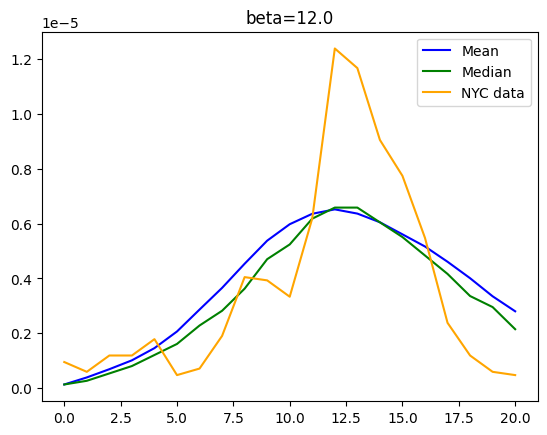

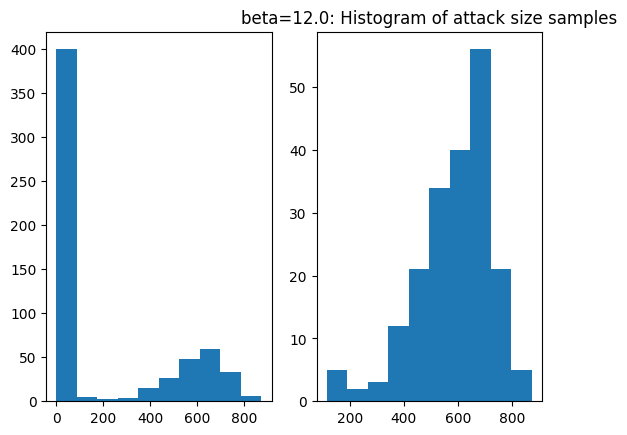

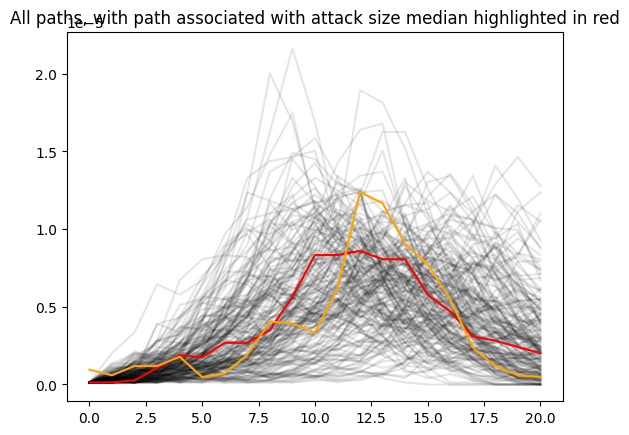

Probability of large outbreak: 0.3516666666666667
(701.0, array([ 1., 11., 21., 16., 16., 28., 44., 65., 63., 69., 57., 48., 49.,
       57., 41., 33., 39., 19., 15.,  8.,  1.]))


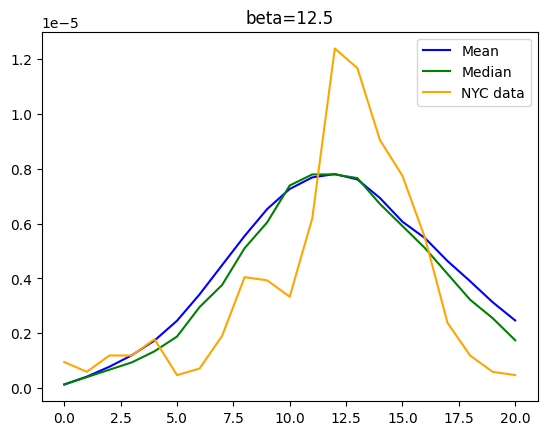

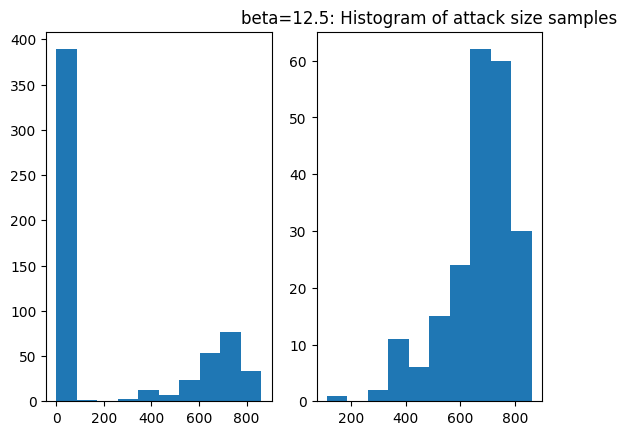

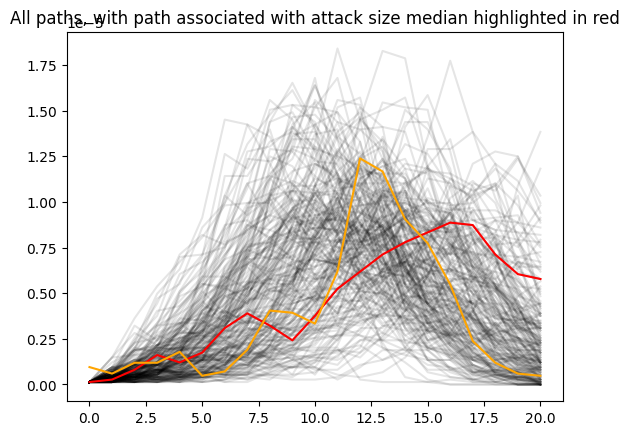

Probability of large outbreak: 0.36833333333333335
(878.0, array([  1.,   1.,   3.,   8.,   9.,  12.,  18.,  20.,  21.,  42.,  70.,
        73., 102., 102., 107., 113.,  85.,  50.,  30.,   9.,   2.]))


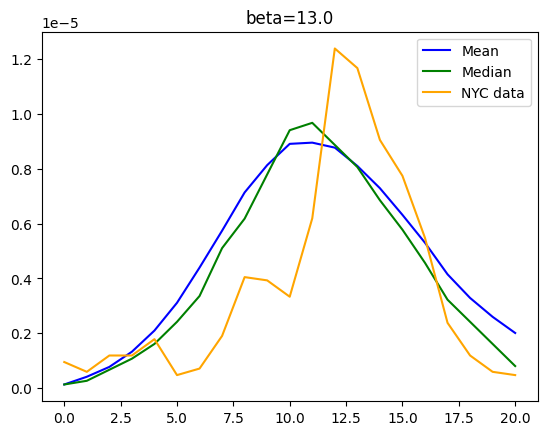

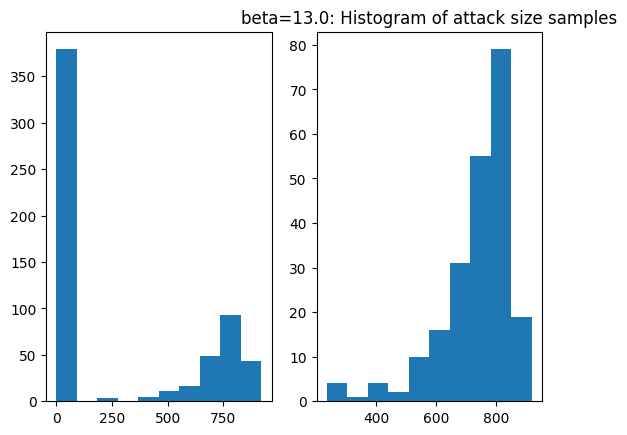

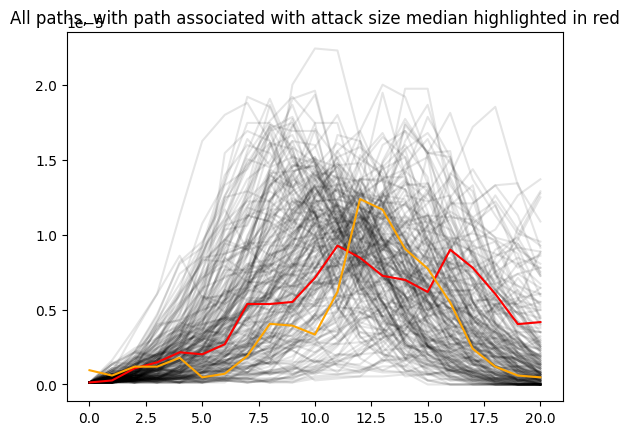

Probability of large outbreak: 0.41
(782.0, array([  1.,   3.,   4.,  10.,  12.,  18.,  29.,  40.,  46.,  70.,  96.,
        96., 105.,  94.,  63.,  37.,  23.,  17.,  12.,   4.,   2.]))


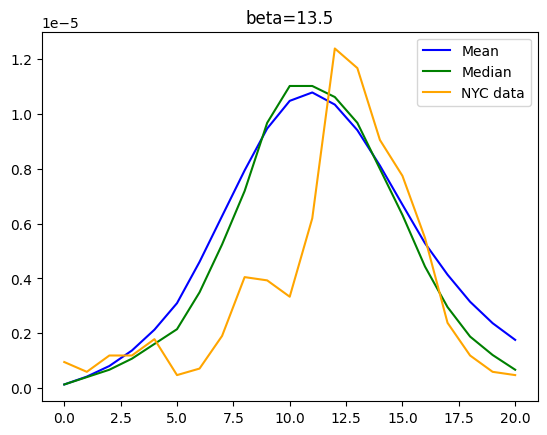

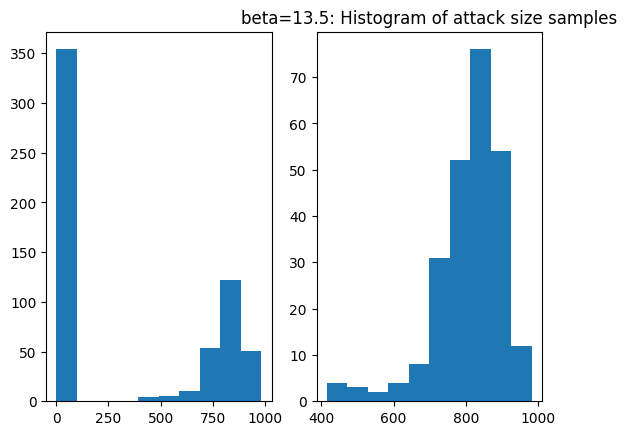

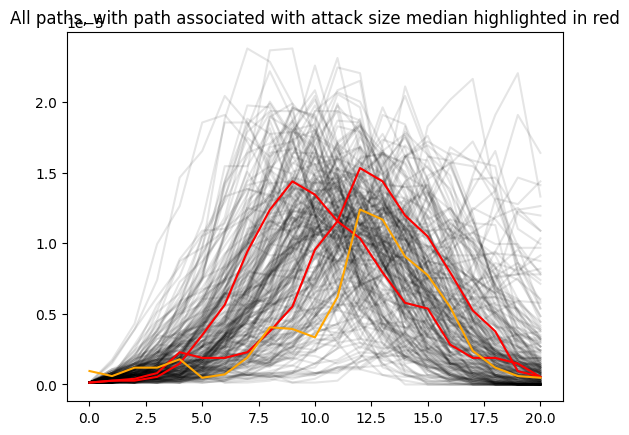

Probability of large outbreak: 0.4116666666666667
(931.0, array([  1.,   4.,   3.,  10.,  28.,  54.,  84., 108., 133., 140., 120.,
        84.,  56.,  42.,  24.,  17.,   7.,   5.,   3.,   3.,   5.]))


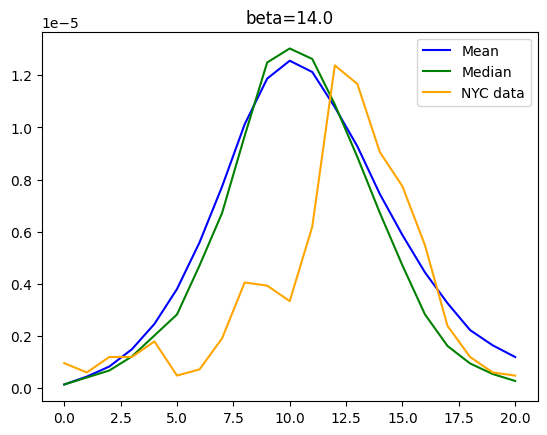

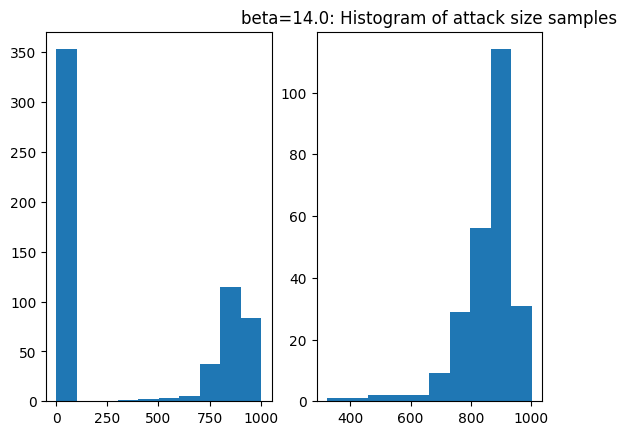

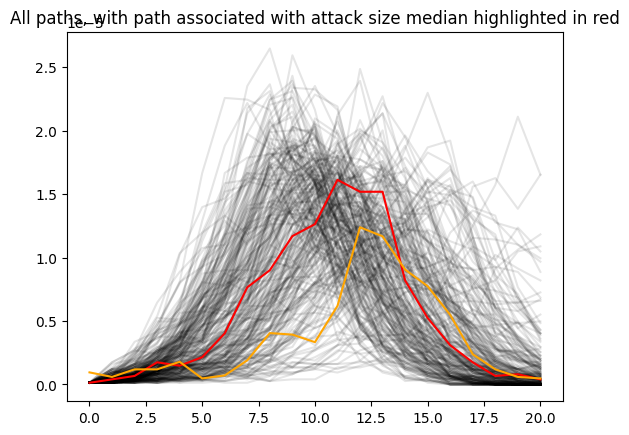

Probability of large outbreak: 0.45166666666666666
(916.0, array([  1.,   4.,   8.,  12.,  24.,  22.,  29.,  46.,  50.,  56.,  73.,
        96., 124., 143., 106.,  70.,  33.,  12.,   4.,   3.,   0.]))


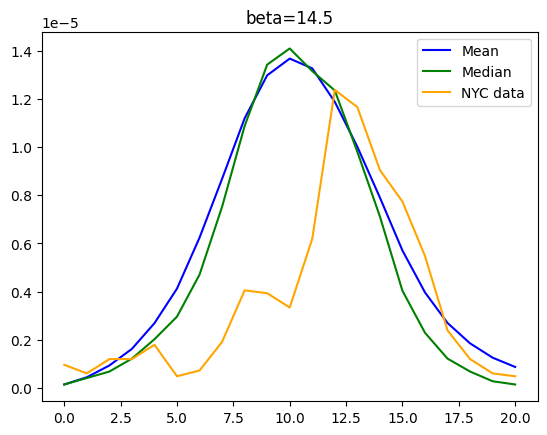

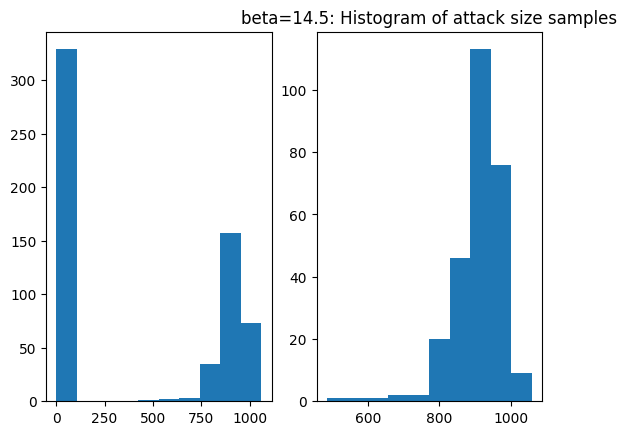

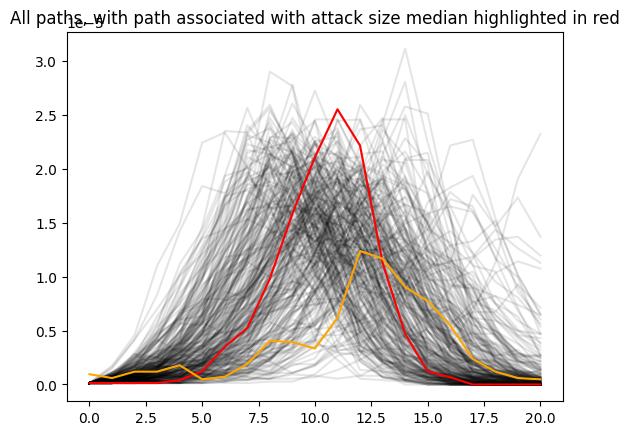

Probability of large outbreak: 0.48333333333333334
(711.0, array([ 1.,  4.,  6.,  3.,  6.,  8., 11., 18., 12., 20., 40., 51., 53.,
       62., 61., 67., 62., 67., 55., 59., 45.]))


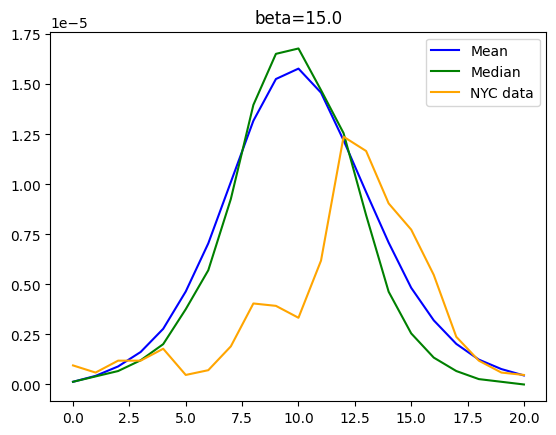

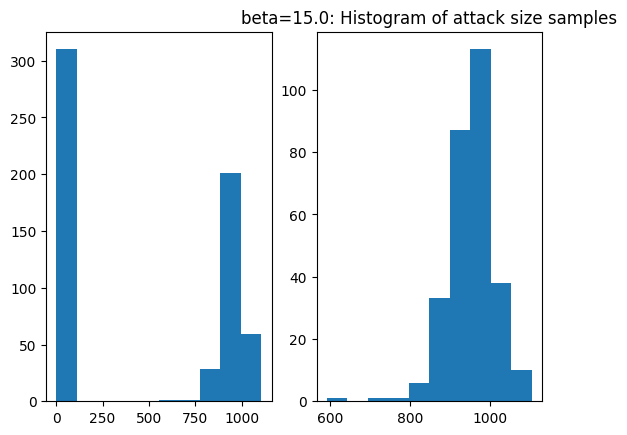

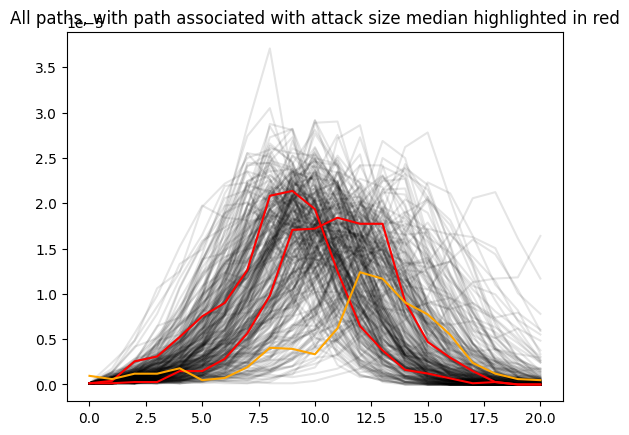

[4.0934933932463617e-05, 2.1791737719941628e-05, 2.017967909151872e-05, 3.5889090406663297e-06, 4.538553210965809e-06, 1.5957301828961384e-05, 2.4957962504322593e-05, 3.3555608522578084e-05, 4.080987235048115e-05, 4.591472467382035e-05, 5.135542254474766e-05]


[<Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 2 Axes>]

In [40]:
# 'parameter sweep'
betas_to_try = np.linspace(10,15,11)
figures = []
mses = []
pools = []
with Pool(12) as p:
    for beta in betas_to_try:
        mse, pool, plot1, plot2 = calib_obj(beta, 
                  sim_pop=sum(patch_pop['pop']), 
                  dataset=biweekly_cases, data_pop=nyc_population,
                  base_config=config, seed=I, pool_worker=p, plot=True, draws=600, obj="median_attacksize",drop_zero=True)
        figures.append(plot1)
        figures.append(plot2)
        pools.append(pool)
        mses.append(mse)
print(mses)
figures

In [ ]:
# 'parameter sweep'
betas_to_try = np.linspace(12,18,7)
figures = []
mses = []
pools = []
with Pool(12) as p:
    for beta in betas_to_try:
        mse, pool, plot1, plot2 = calib_obj(beta, 
                  sim_pop=sum(patch_pop['pop']), 
                  dataset=biweekly_cases, data_pop=nyc_population,
                  base_config=config, seed=I, pool_worker=p, plot=True, draws=100, obj="median_attacksize",drop_zero=True)
        figures.append(plot1)
        figures.append(plot2)
        pools.append(pool)
        mses.append(mse)
print(mses)
figures

In [ ]:
plt.scatter(betas_to_try,
         [9.710574643822625e-06, 2.361458031397017e-05, 3.953365926964635e-05, 5.3706341377864376e-05, 6.0423252329626487e-05, 6.848354547174102e-05, 7.426008889025643e-05])
plt.title(r'Difference between median sim and NYC attack size vs. $\beta$')
plt.xlabel(r'$\beta$')
plt.ylabel(r'Difference')

In [ ]:
plt.bar(betas_to_try,
         [2.3806811005470255e-05, 2.5142032883844e-06, 1.6561823814619975e-05, 3.060016770380276e-05, 4.356380584070362e-05, 5.323615761124104e-05, 6.096060520576747e-05, 6.848354547174102e-05, 7.45287653283269e-05],
       width=0.2)
plt.title(r'Difference between median sim and NYC attack size vs. $\beta$')
plt.xlabel(r'$\beta$')
plt.ylabel(r'Difference')

In [ ]:
# 'parameter sweep'
betas_to_try = np.linspace(15,17,11)
figures = []
mses = []
pools = []
with Pool(12) as p:
    for beta in betas_to_try:
        mse, pool, plot1, plot2 = calib_obj(beta, 
                  sim_pop=sum(patch_pop['pop']), 
                  dataset=biweekly_cases, data_pop=nyc_population,
                  base_config=config, seed=I, pool_worker=p, plot=True, draws=600, obj="median_attacksize",drop_zero=True)
        figures.append(plot1)
        figures.append(plot2)
        pools.append(pool)
        mses.append(mse)
print(mses)
figures

In [ ]:
plt.bar(betas_to_try,
         [4.0934933932463617e-05, 2.1791737719941628e-05, 2.017967909151872e-05, 3.5889090406663297e-06, 4.538553210965809e-06, 1.5957301828961384e-05, 2.4957962504322593e-05, 3.3555608522578084e-05, 4.080987235048115e-05, 4.591472467382035e-05, 5.135542254474766e-05],
       width=0.1)
plt.title(r'Difference between median sim and NYC attack size vs. $\beta$')
plt.xlabel(r'$\beta$')
plt.ylabel(r'Difference')

Text(0, 0.5, 'Difference')

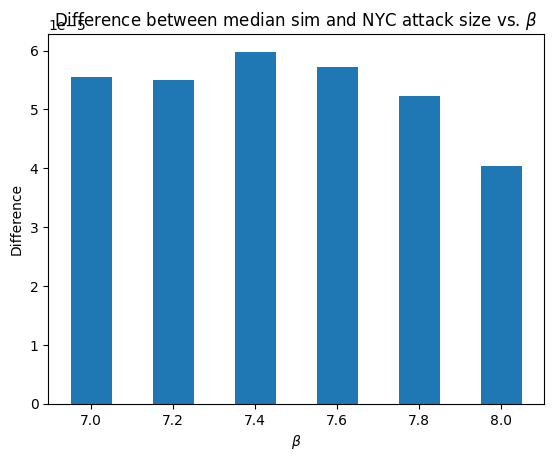

In [32]:
[5.5577799807304994e-05, 5.504044693116402e-05, 5.980945370691512e-05, 5.7189858435727895e-05, 5.2353682550459184e-05, 4.0397581056322645e-05]
plt.bar(betas_to_try,
         [5.5577799807304994e-05, 5.504044693116402e-05, 5.980945370691512e-05, 5.7189858435727895e-05, 5.2353682550459184e-05, 4.0397581056322645e-05],
       width=0.1)
plt.title(r'Difference between median sim and NYC attack size vs. $\beta$')
plt.xlabel(r'$\beta$')
plt.ylabel(r'Difference')

([<matplotlib.axis.XTick at 0x7fe2fb996770>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

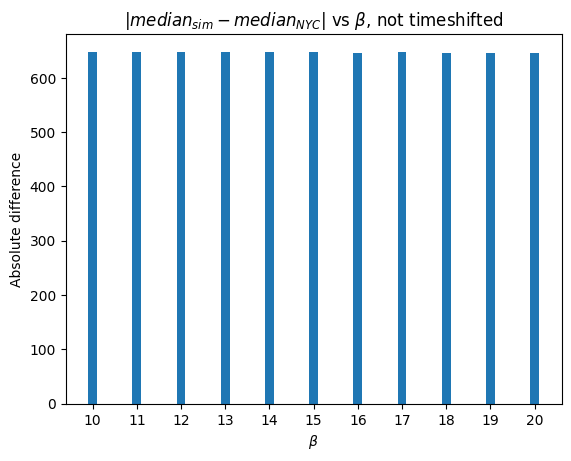

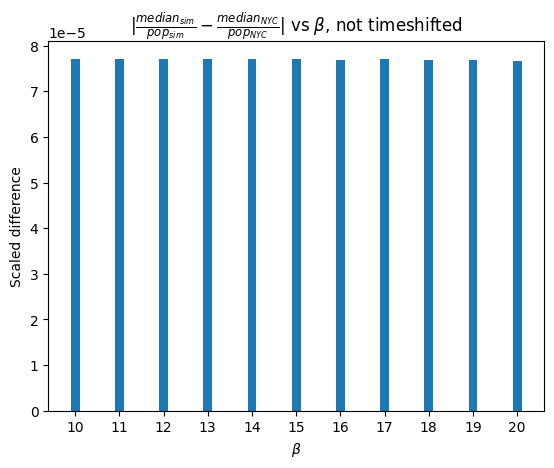

In [58]:
plt.figure()
plt.title(r'$|median_{sim} - median_{NYC}|$ vs $\beta$, not timeshifted')
plt.xlabel(r'$\beta$')
plt.ylabel(r'Absolute difference')
plt.bar(betas_to_try,[np.abs(np.median(np.sum(pool.get_samples(),axis=1)) - sum(biweekly_cases)) for pool in pools], width=0.2)
plt.xticks(betas_to_try)

plt.figure()
plt.title(r'$|\frac{median_{sim}}{pop_{sim}} - \frac{median_{NYC}}{pop_{NYC}}|$ vs $\beta$, not timeshifted')
plt.xlabel(r'$\beta$')
plt.ylabel(r'Scaled difference')
plt.bar(betas_to_try,[np.abs(np.median(np.sum(pool.get_samples(),axis=1))/sum(immun['pop']) - sum(biweekly_cases)/nyc_population) for pool in pools], width=0.2)
plt.xticks(betas_to_try)

Result: Using 705 zipcodes and assuming 1 case of measles is introduced in zipcode 20166 (Dulles Airport), then a value of $\beta$ near 8-8.4 seems to fit the biweekly scaled cases from NYC the best when comparing peaks generated from the mean. However, there's a fraction of simulations that do not result in large outbreaks, so the mean is biased downward, and the median is a better representative of realized epidemic size from the simulation. However, if we compare the median total outbreak size with the NYC outbreak size, a value of around $\beta =6$ matches the NYC value the best despite not having a similar shape in the epicurve.
- Try timeshifting as suggested?

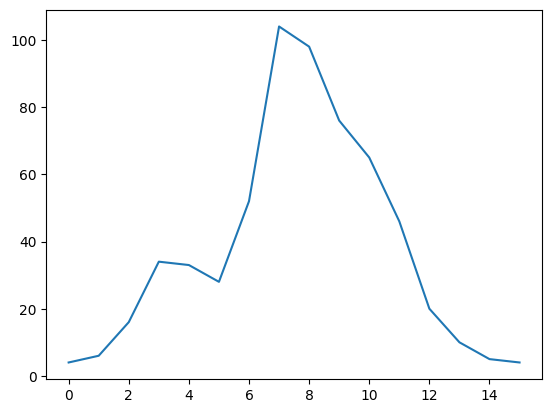

In [32]:
biweekly_cases_timeshifted = biweekly_cases[5:]
plt.plot(biweekly_cases_timeshifted)

(2.0, array([1., 1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]))


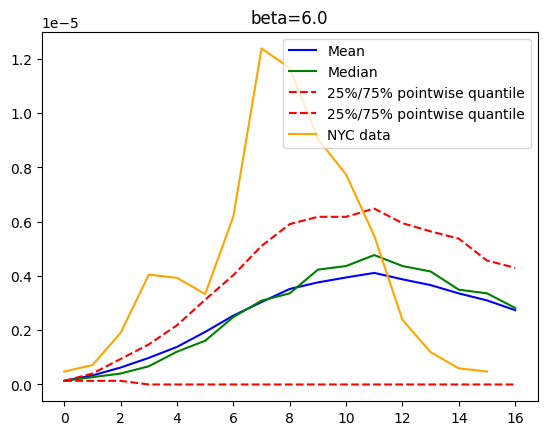

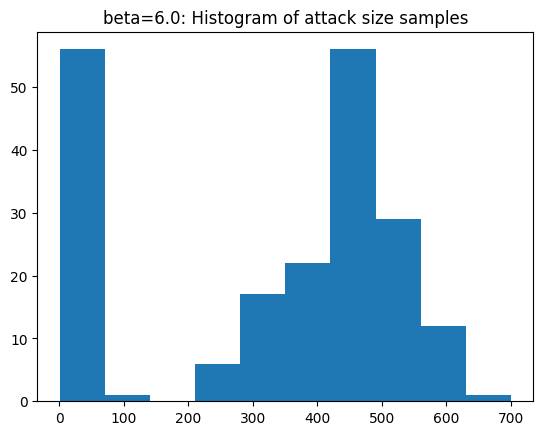

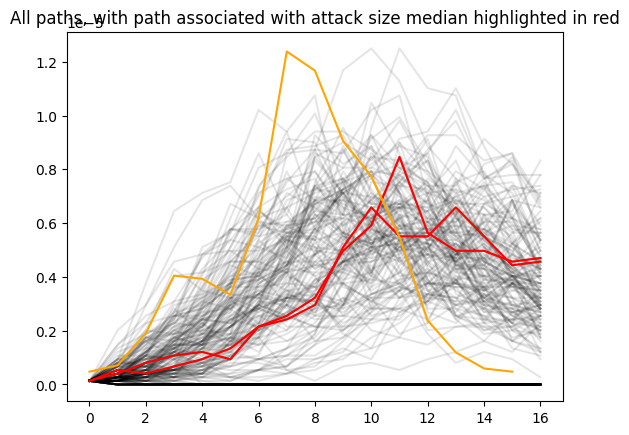

(1.0, array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]))


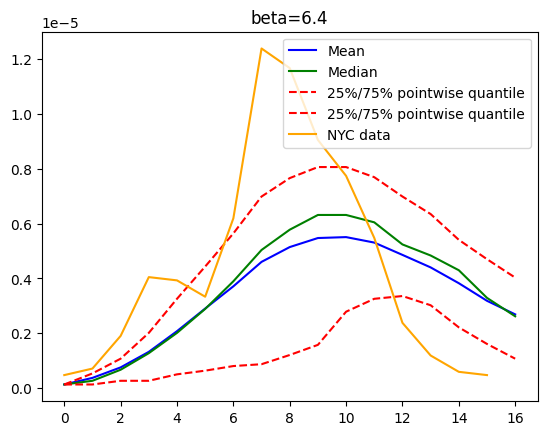

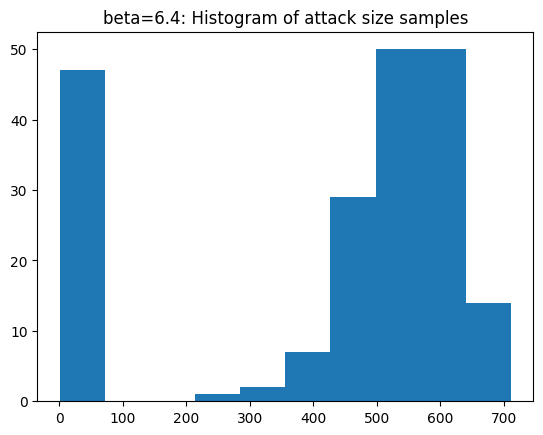

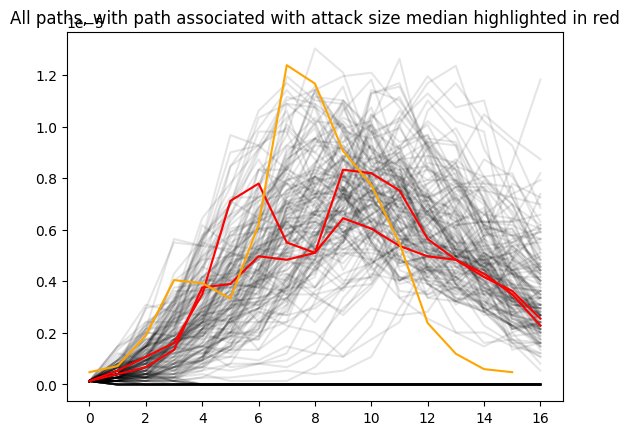

(687.0, array([ 1.,  2.,  7., 22., 32., 49., 67., 62., 79., 68., 62., 55., 57.,
       54., 31., 23., 16.]))


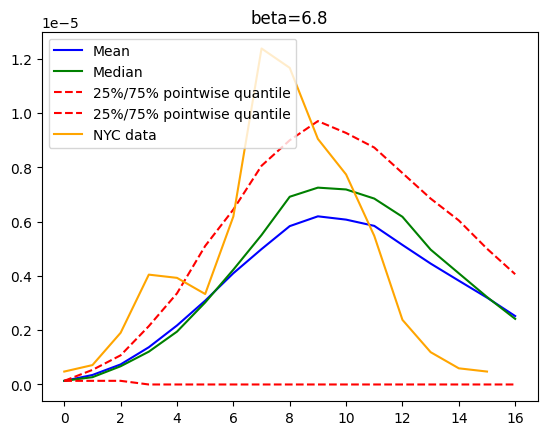

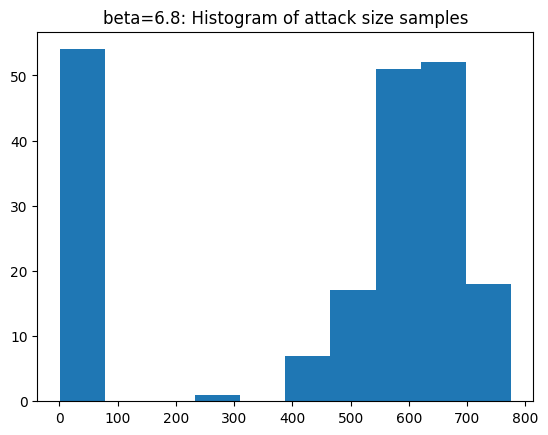

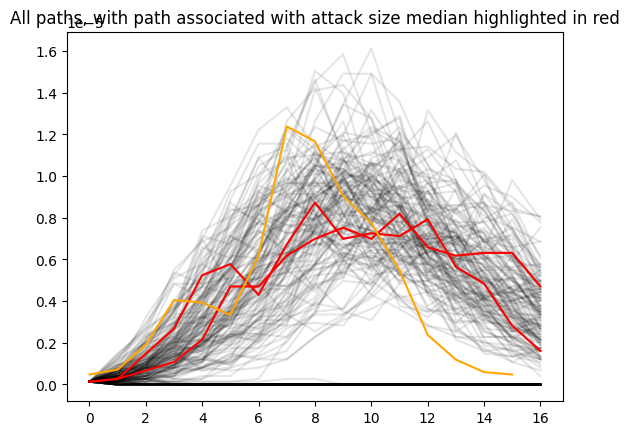

(1.0, array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]))


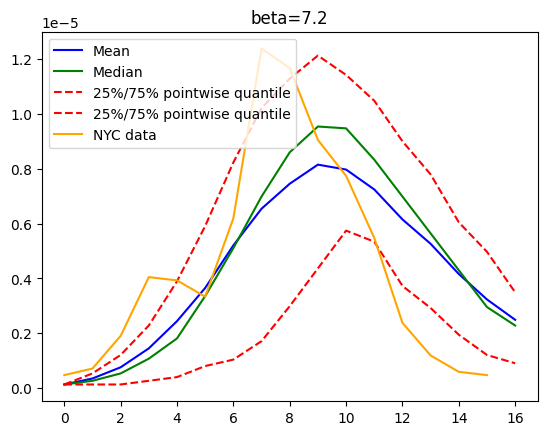

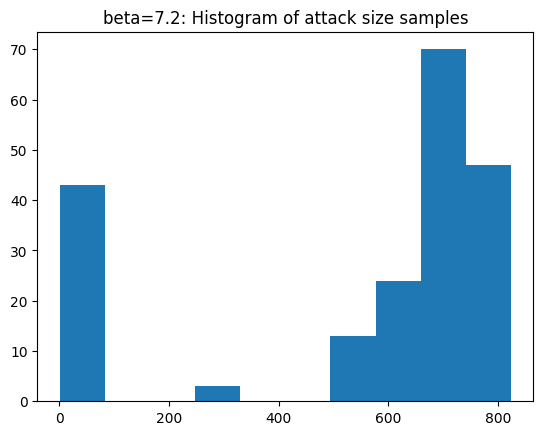

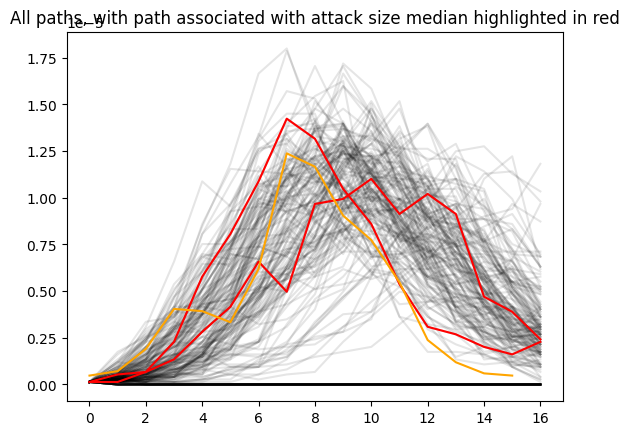

(763.0, array([ 1.,  3.,  7.,  8., 15., 31., 52., 61., 63., 79., 73., 71., 53.,
       78., 66., 55., 47.]))


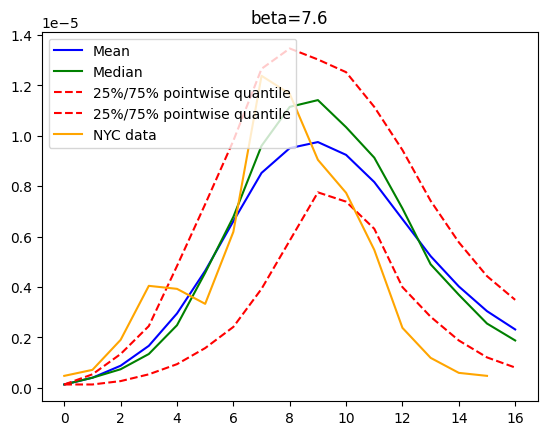

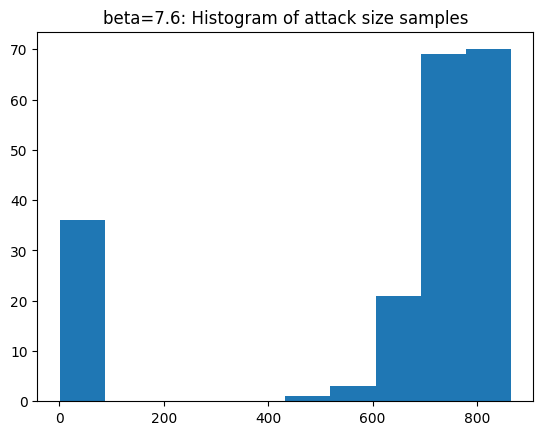

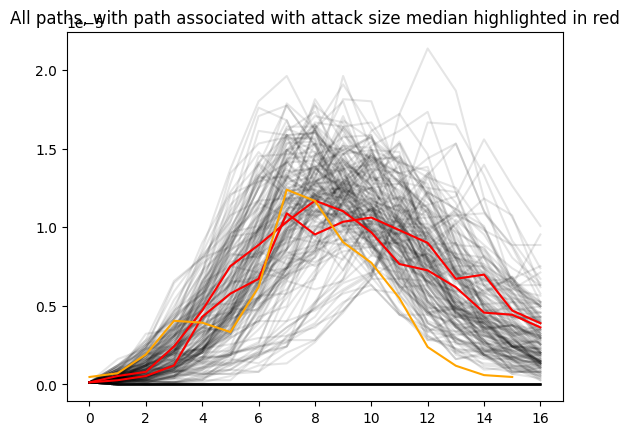

(1.0, array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.]))


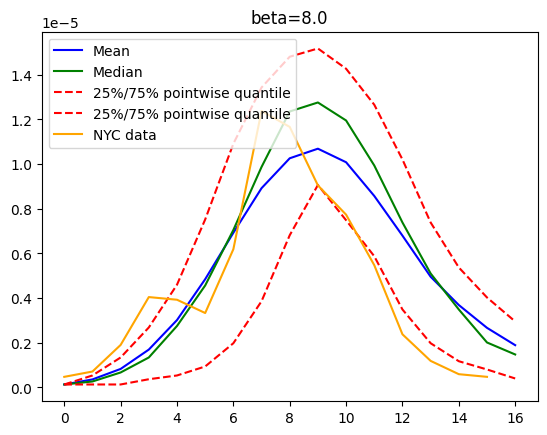

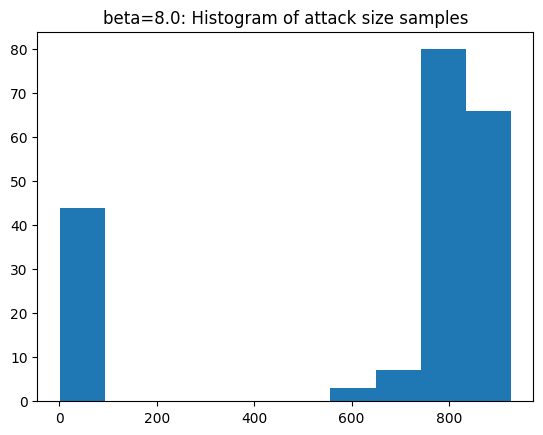

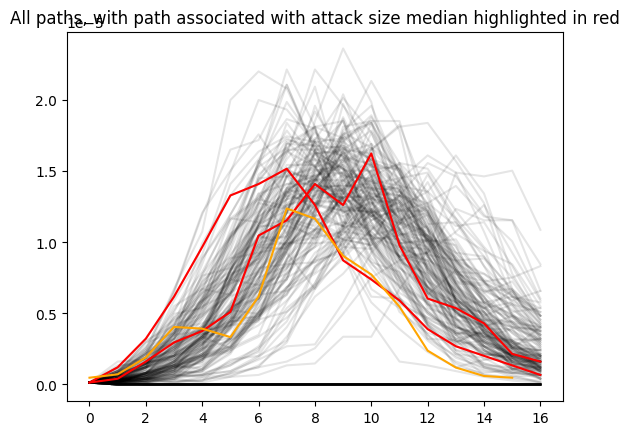

(916.0, array([  1.,   2.,   9.,  16.,  34.,  63., 121., 125., 152., 158., 107.,
        62.,  34.,  18.,   9.,   4.,   1.]))


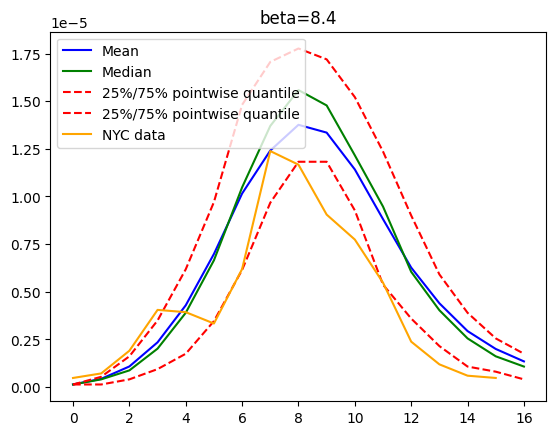

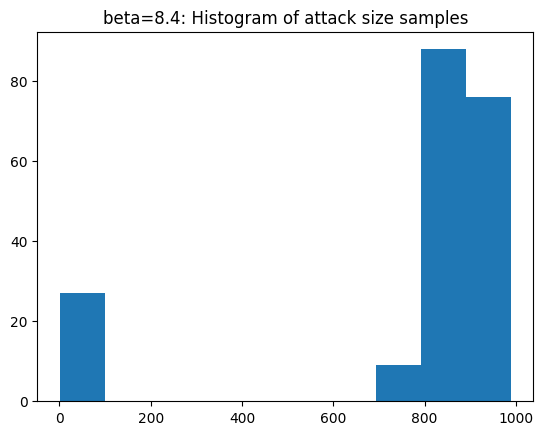

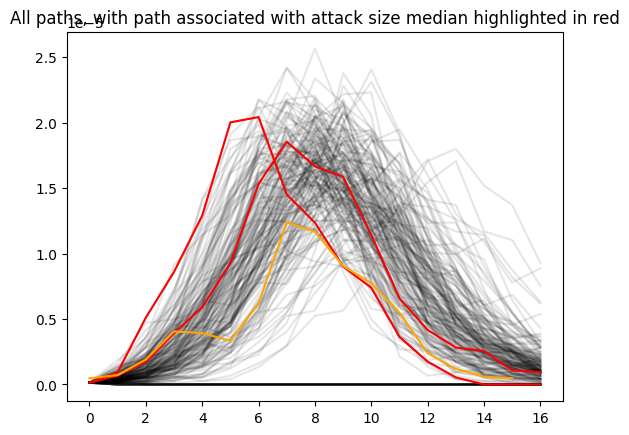

(905.0, array([  1.,   5.,  24.,  41.,  59.,  78., 120., 123., 109., 107.,  74.,
        60.,  36.,  24.,  20.,  18.,   6.]))


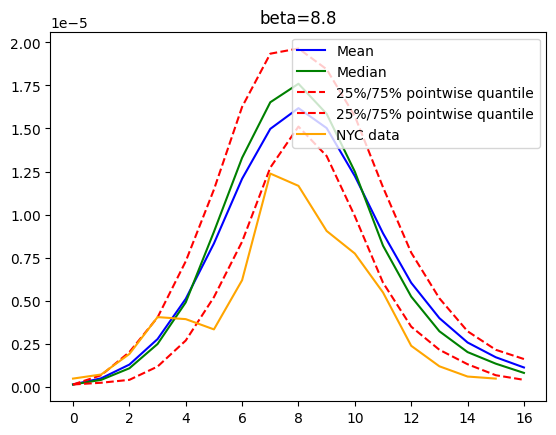

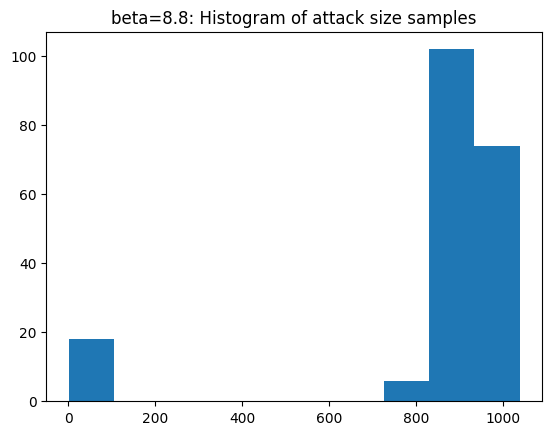

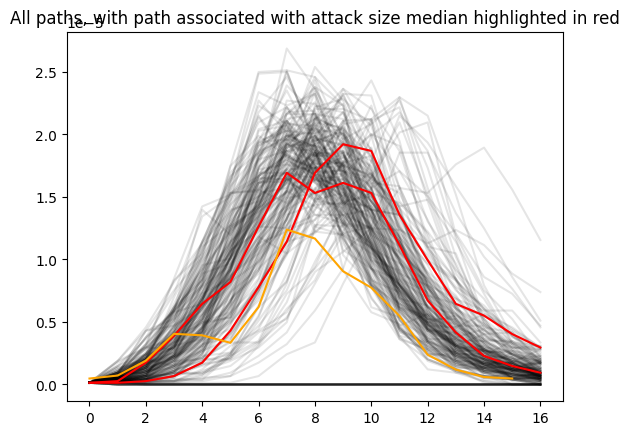

(986.0, array([  1.,   4.,  12.,  28.,  43.,  87., 112., 170., 158., 121.,  87.,
        77.,  43.,  21.,  11.,   7.,   4.]))


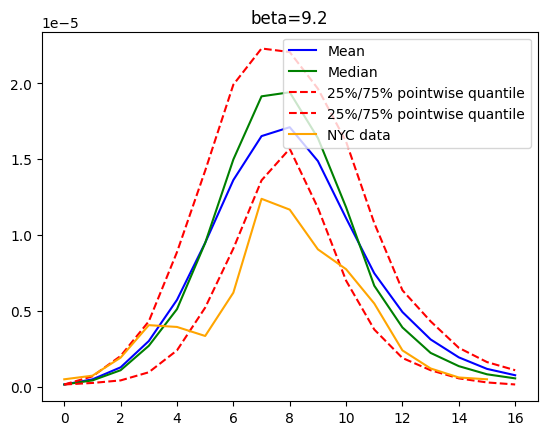

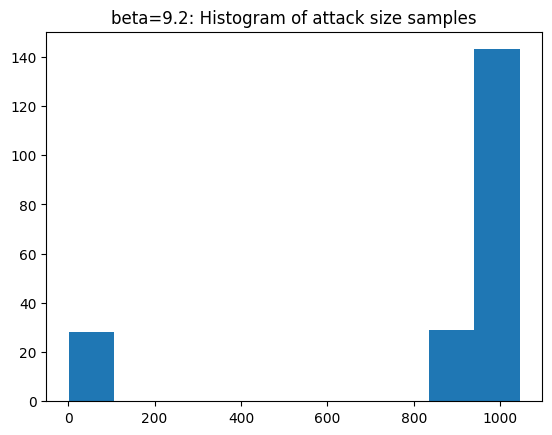

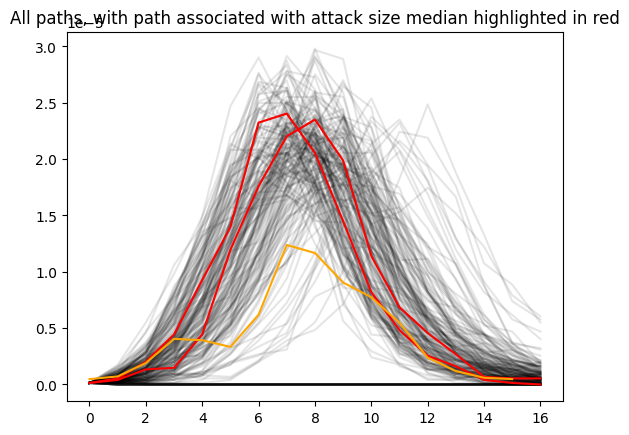

(997.0, array([  1.,   8.,  31.,  44.,  87., 149., 191., 180., 121.,  89.,  50.,
        26.,   8.,   7.,   3.,   1.,   1.]))


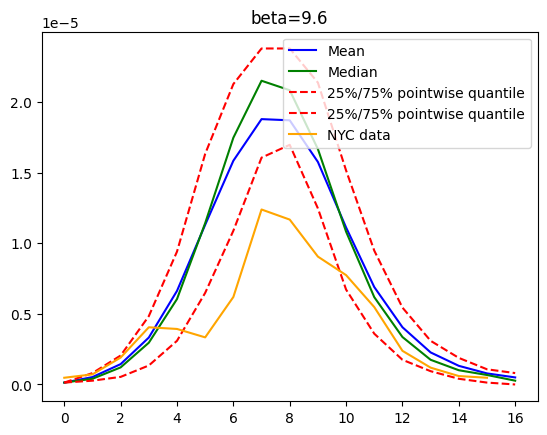

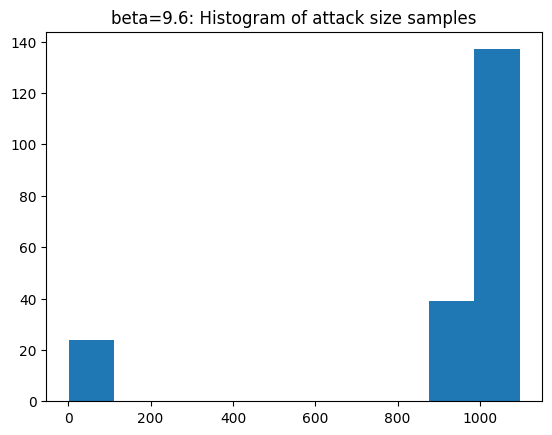

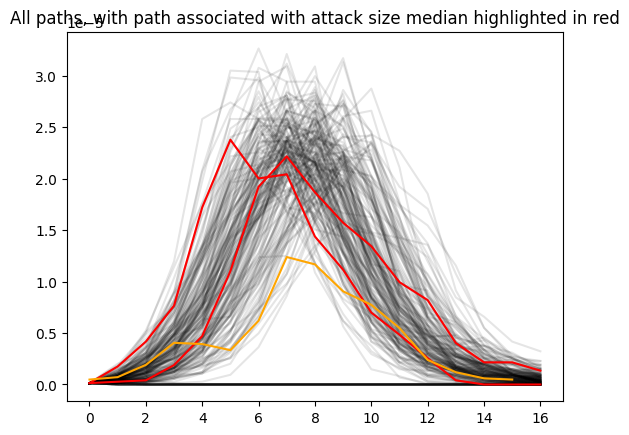

(1048.0, array([  1.,   4.,  13.,  25.,  67., 101., 148., 181., 235., 131.,  75.,
        34.,  16.,  10.,   5.,   2.,   0.]))


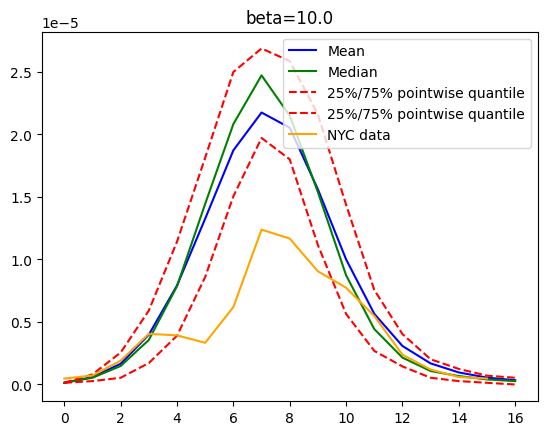

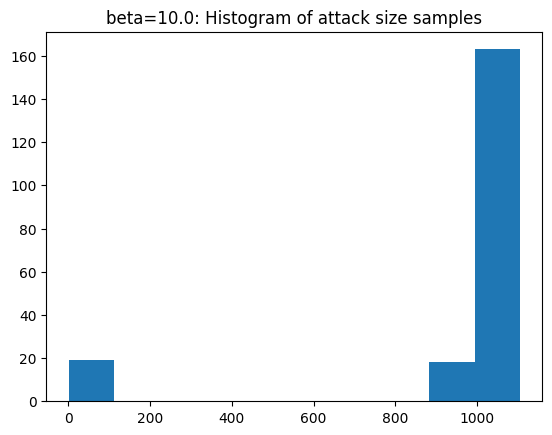

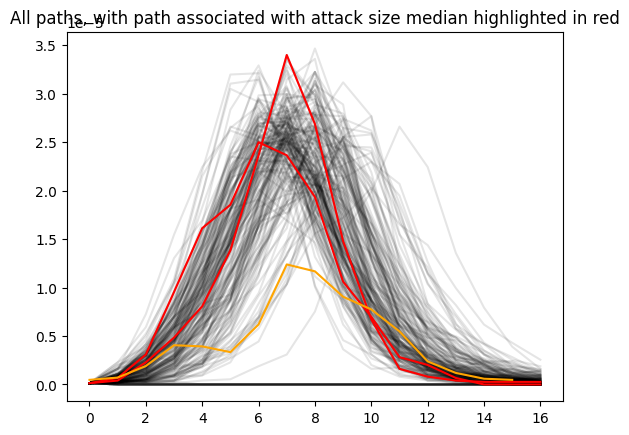

[1.5740754630424645e-05, 1.9039180697947184e-06, 7.902771919777955e-06, 1.9791704304396868e-05, 2.986707073204002e-05, 3.665115079331975e-05, 4.571898057819858e-05, 5.2100045982372565e-05, 5.834677316751134e-05, 6.385464014795627e-05, 6.761611028094303e-05]


[<Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>]

In [33]:
# 'parameter sweep'
betas_to_try = np.linspace(6,10,11)
figures = []
mses = []
shifted_pools= []
with Pool(12) as p:
    for beta in betas_to_try:
        mse,pool, plot1, plot2 = calib_obj(beta, 
                  sim_pop=sum(patch_pop['pop']), 
                  dataset=biweekly_cases_timeshifted, data_pop=nyc_population,
                  base_config=config, seed=I, pool_worker=p, plot=True, draws=200, obj="median_attacksize")
        figures.append(plot1)
        figures.append(plot2)
        shifted_pools.append(pool)
        mses.append(mse)
print(mses)
figures

In [ ]:
plt.plot([1.4800387097177948e-05, 3.918991355323352e-06, 7.969941029295575e-06, 1.952302786632639e-05, 3.067310004625147e-05, 3.880056229788361e-05, 4.672651722096289e-05, 5.2167215091890185e-05, 5.7339236524747014e-05, 6.264559617663908e-05, 6.78847867190135e-05])

([<matplotlib.axis.XTick at 0x7ff54190b640>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

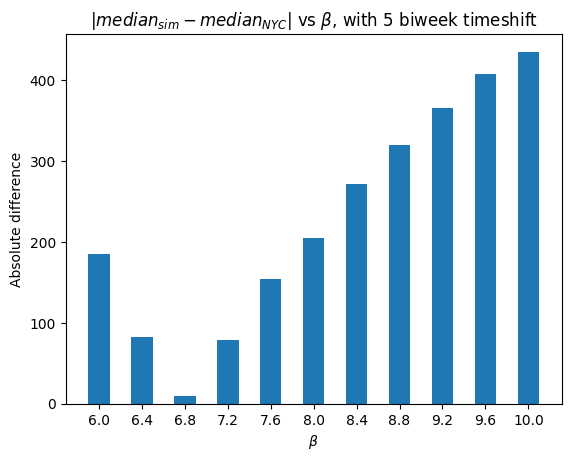

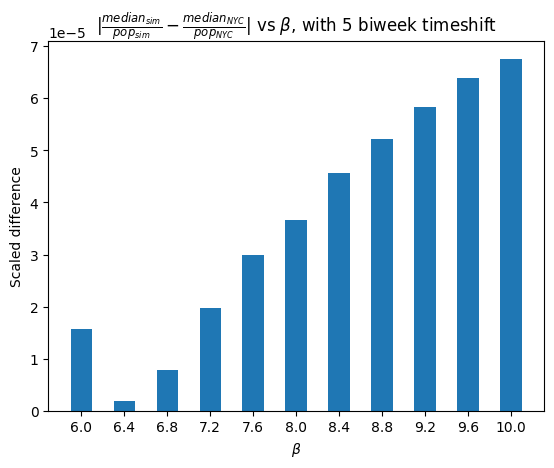

In [65]:
plt.figure()
plt.title(r'$|median_{sim} - median_{NYC}|$ vs $\beta$, with 5 biweek timeshift')
plt.xlabel(r'$\beta$')
plt.ylabel(r'Absolute difference')
plt.bar(betas_to_try,[np.abs(np.median(np.sum(pool.get_samples(),axis=1)) - sum(biweekly_cases_timeshifted)) for pool in shifted_pools], width=0.2)
plt.xticks(betas_to_try)

plt.figure()
plt.title(r'$|\frac{median_{sim}}{pop_{sim}} - \frac{median_{NYC}}{pop_{NYC}}|$ vs $\beta$, with 5 biweek timeshift')
plt.xlabel(r'$\beta$')
plt.ylabel(r'Scaled difference')
plt.bar(betas_to_try,[np.abs(np.median(np.sum(pool.get_samples(),axis=1))/sum(immun['pop']) - sum(biweekly_cases_timeshifted)/nyc_population) for pool in shifted_pools], width=0.2)
plt.xticks(betas_to_try)

(592.0, array([ 1.,  4., 14., 19., 22., 26., 31., 47., 64., 55., 44., 46., 47.,
       50., 48., 18., 12., 12.,  9., 10.,  6.,  7.]))


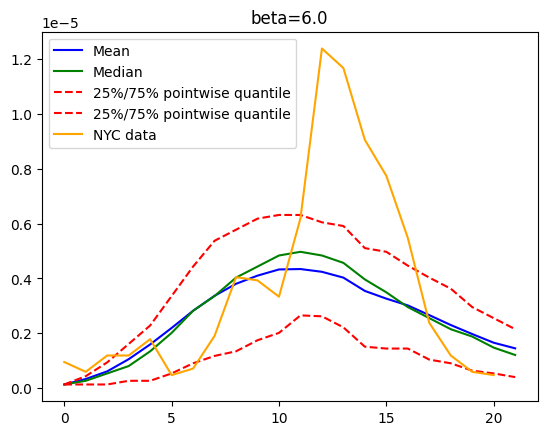

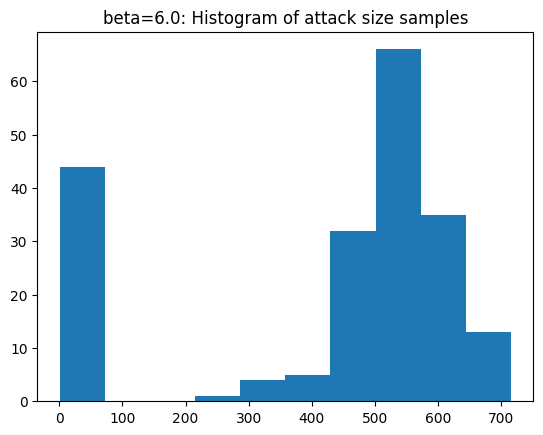

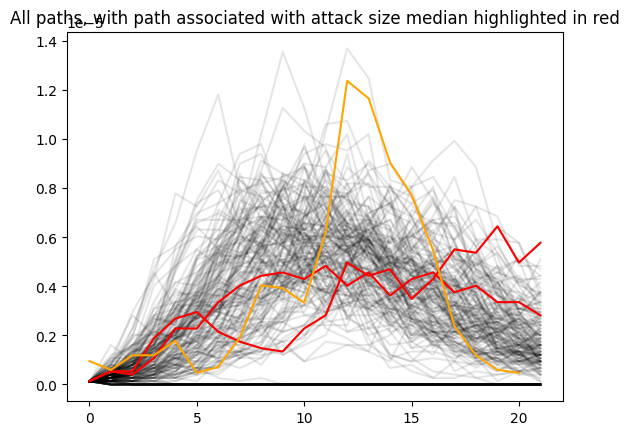

(463.0, array([ 1.,  5.,  6.,  6.,  8., 10.,  8., 10., 15., 25., 31., 41., 50.,
       51., 37., 51., 40., 21., 13., 10., 10., 14.]))


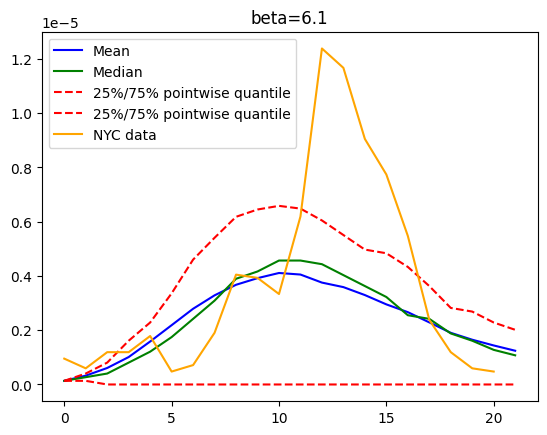

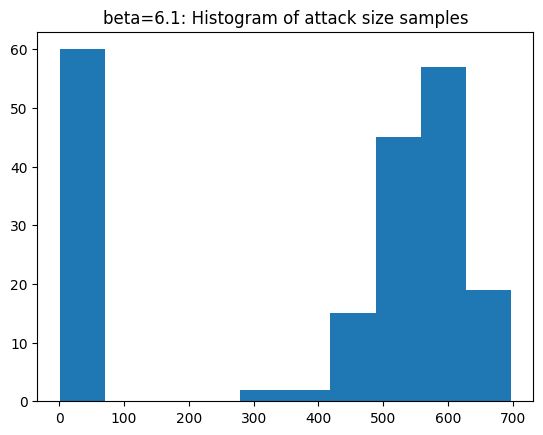

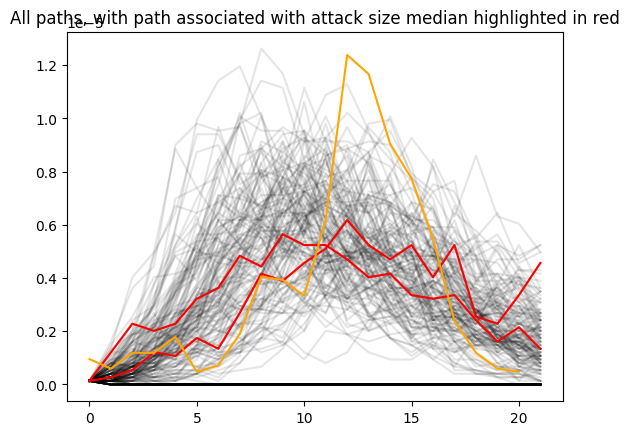

(636.0, array([ 1.,  2.,  9., 10., 20., 21., 26., 62., 73., 56., 58., 53., 56.,
       41., 28., 25., 20., 19., 16., 13., 16., 11.]))


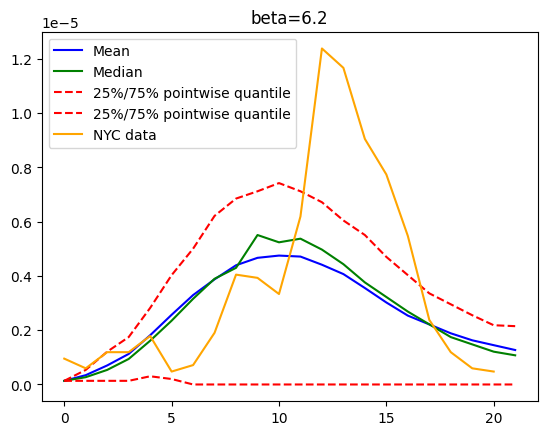

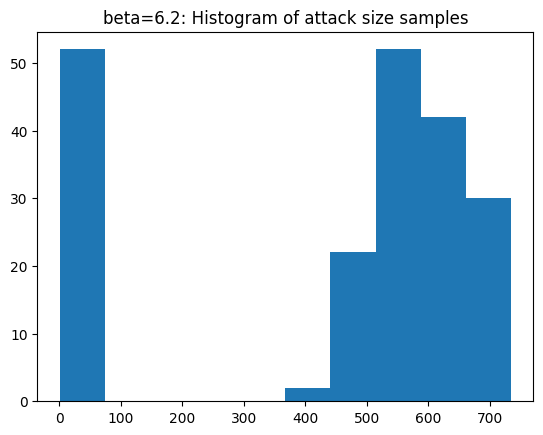

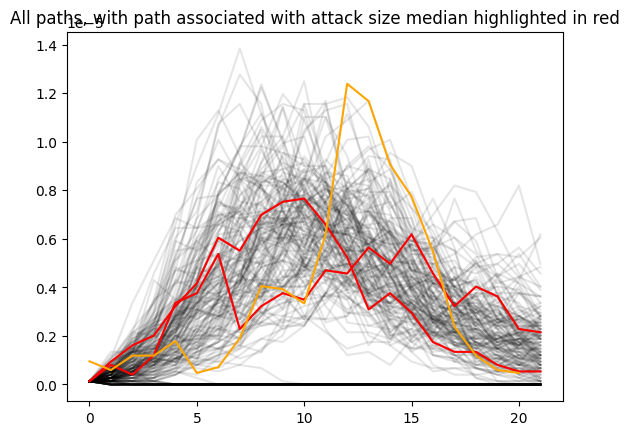

(1.0, array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.]))


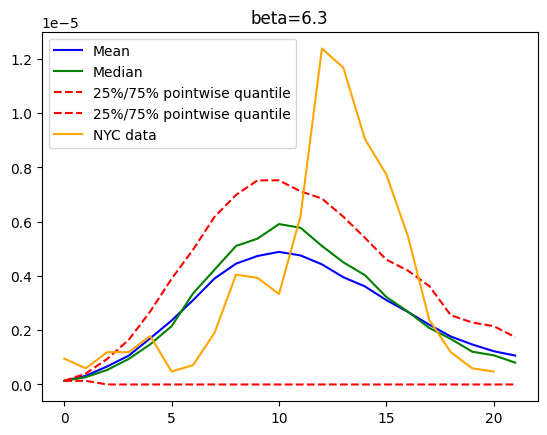

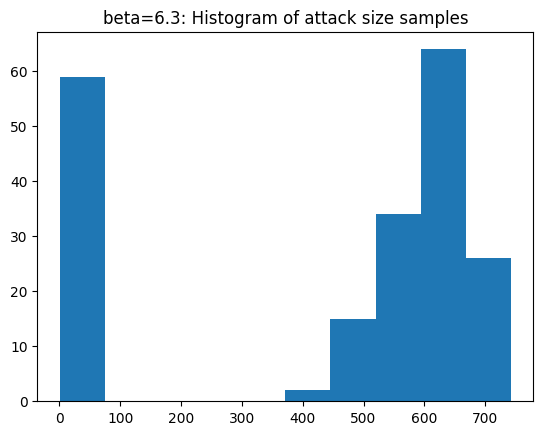

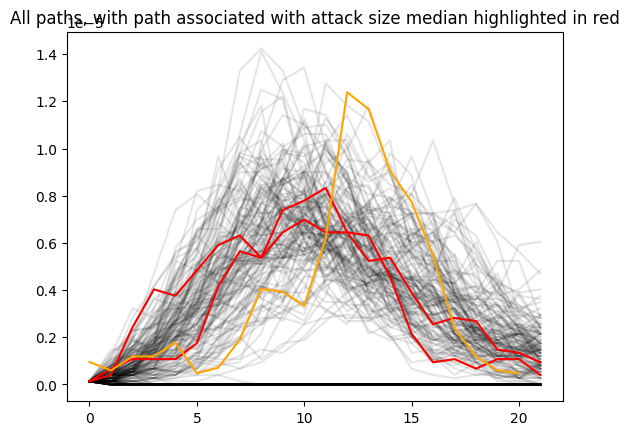

(1.0, array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.]))


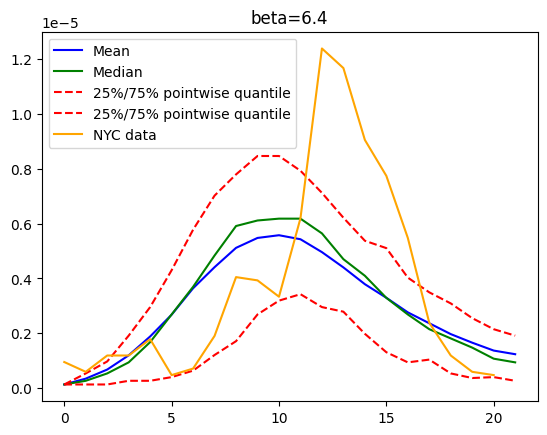

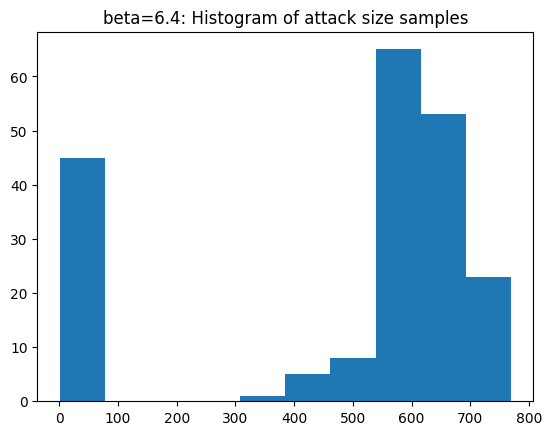

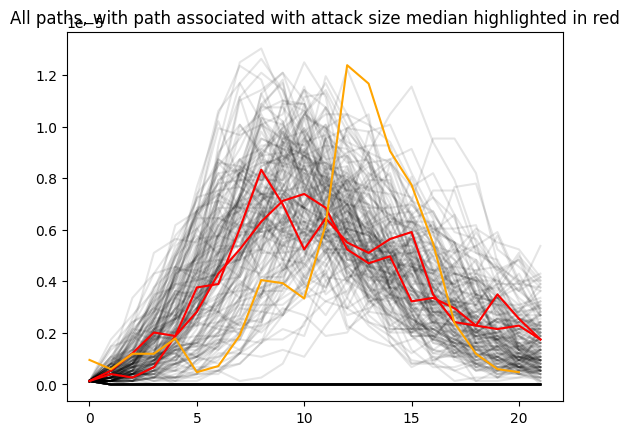

(580.0, array([ 1.,  2.,  6., 17., 29., 40., 40., 37., 42., 47., 49., 55., 46.,
       37., 22., 23., 26., 14., 13.,  9.,  9., 16.]))


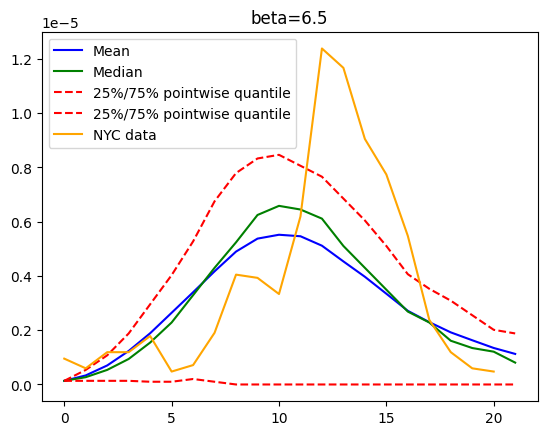

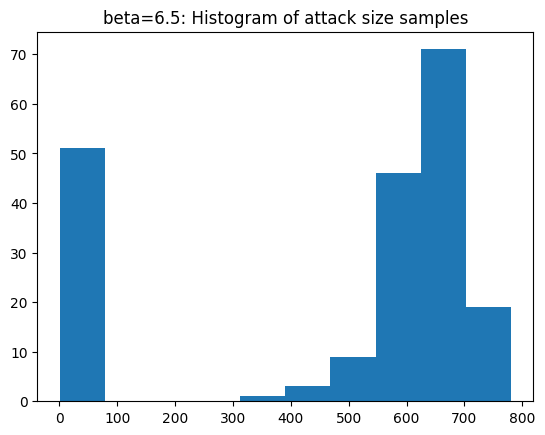

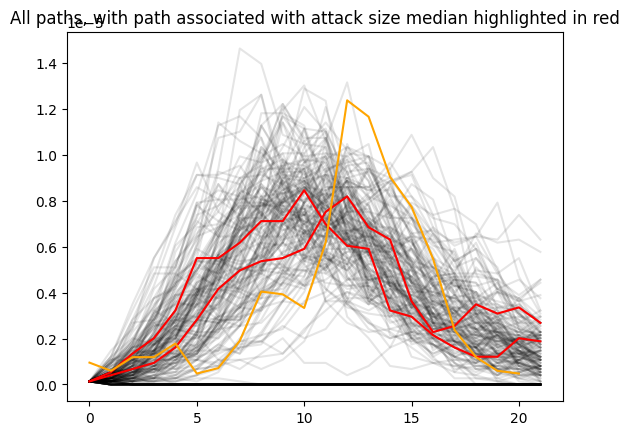

(635.0, array([ 1.,  2.,  3., 10., 13., 23., 29., 46., 46., 39., 59., 63., 47.,
       39., 39., 40., 40., 29., 22., 18., 13., 14.]))


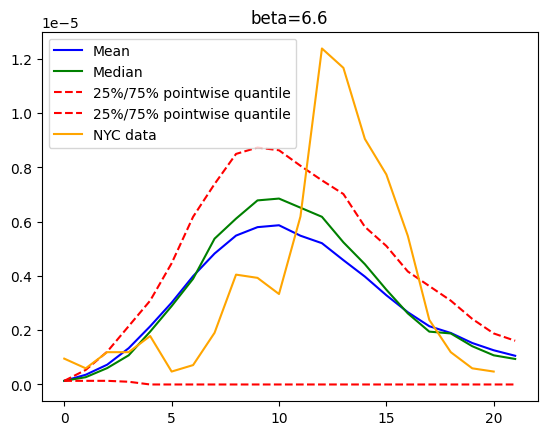

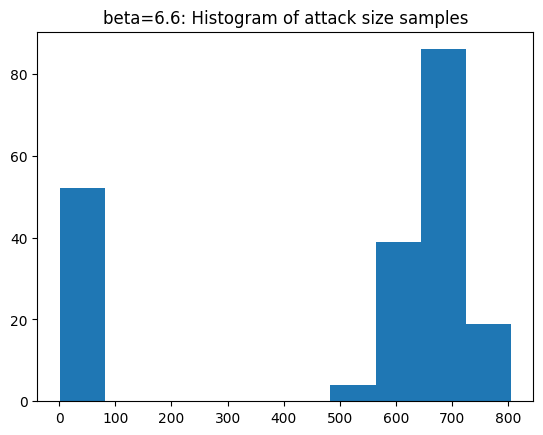

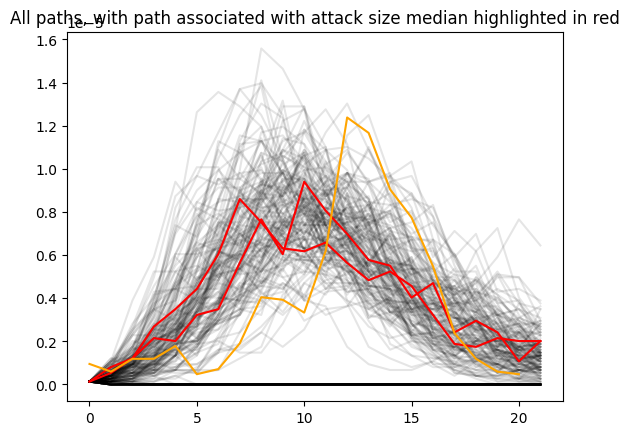

(718.0, array([ 1.,  6.,  6., 15., 23., 32., 67., 82., 73., 76., 79., 67., 55.,
       40., 41., 16., 16., 13.,  3.,  3.,  1.,  3.]))


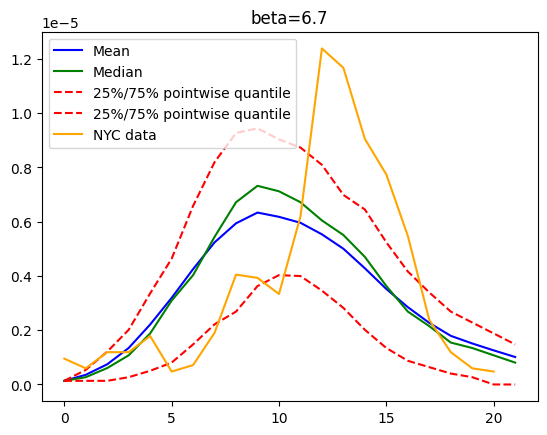

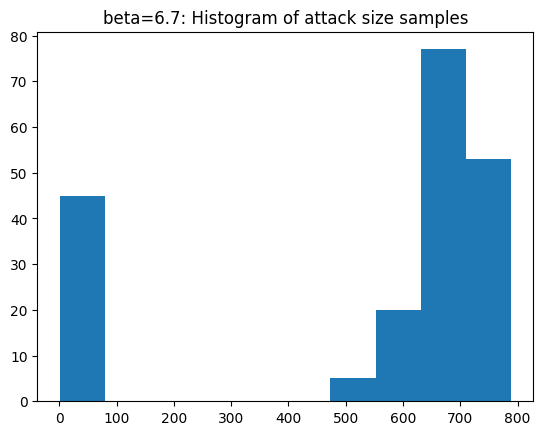

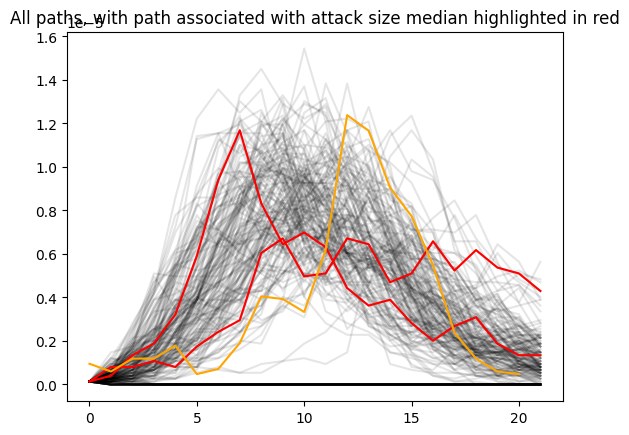

(747.0, array([ 1.,  2.,  6.,  7., 10., 13., 43., 43., 67., 77., 96., 91., 74.,
       49., 45., 39., 36., 17., 13., 11.,  5.,  2.]))


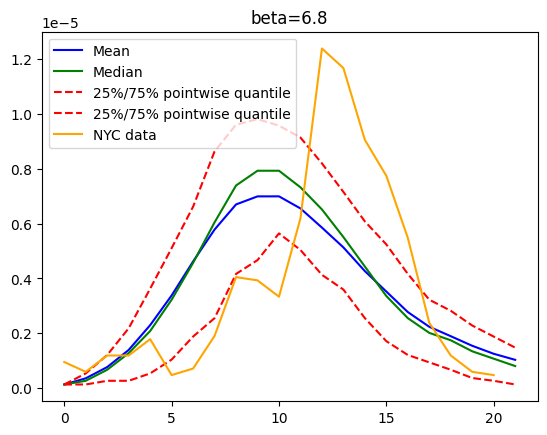

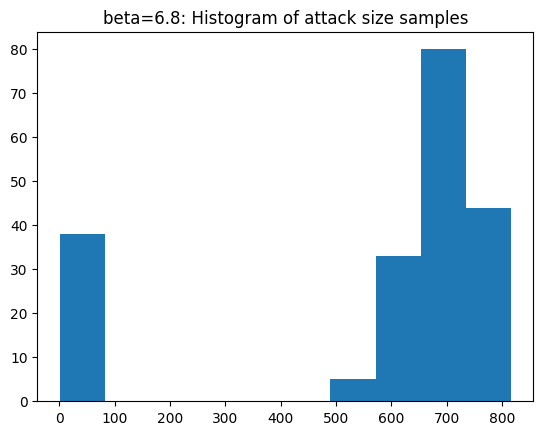

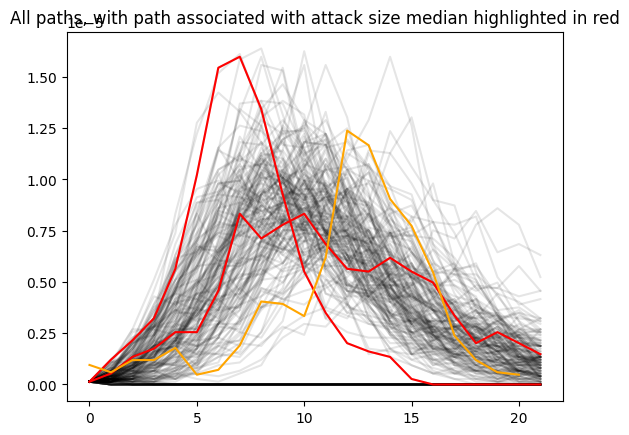

(626.0, array([ 1.,  4., 14., 20., 33., 54., 79., 96., 96., 65., 39., 22., 15.,
       10., 10., 11.,  7.,  5., 10., 15., 13.,  7.]))


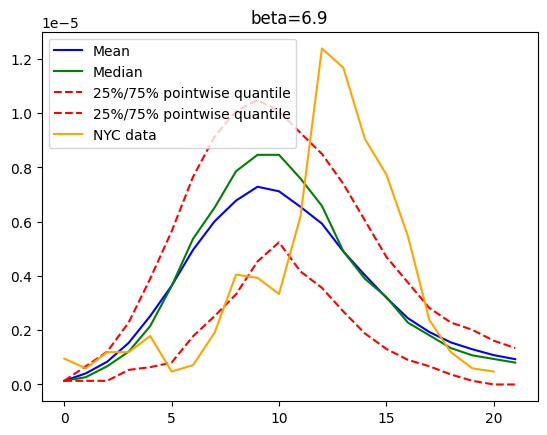

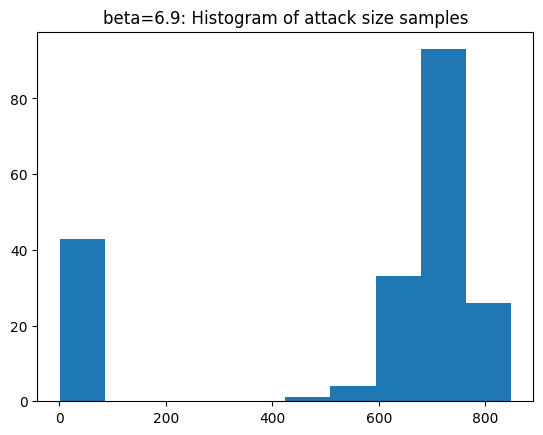

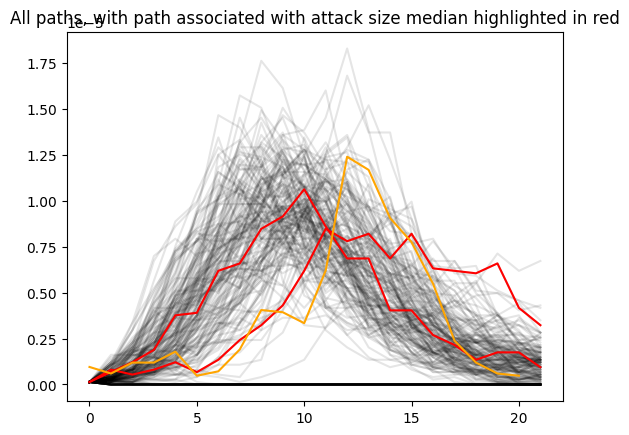

(1.0, array([1., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0.]))


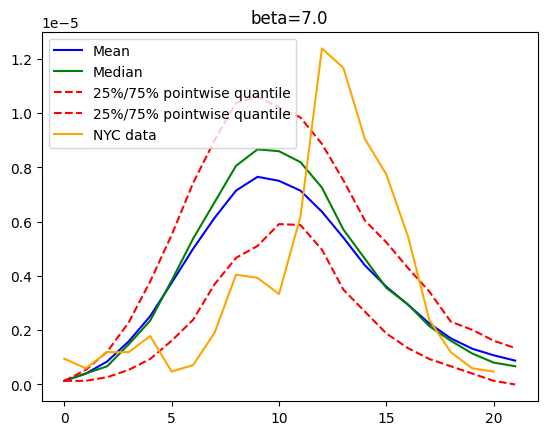

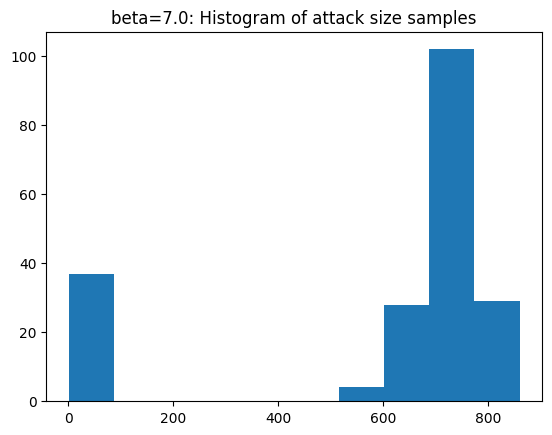

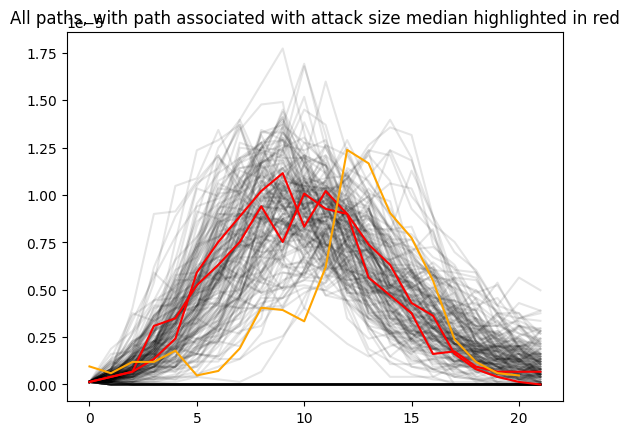

[6.745857187994526e-06, 7.216040954617864e-06, 3.5889090406663297e-06, 9.611534575003486e-08, 3.0608328015781477e-06, 5.008736977589161e-06, 9.979251081893118e-06, 1.1859986148386498e-05, 1.3539213886327019e-05, 1.6024470938479004e-05, 1.9248588195324806e-05]


[<Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>]

In [34]:
dulles_index = patch_pop[patch_pop['zipcode'] == 20166].index
I = np.zeros(len(patch_pop.index))
np.put(I,dulles_index,1)

# 'parameter sweep'
betas_to_try_focused = np.linspace(6,7,11)
figures = []
mses = []
focused_sweep_pools = []
with Pool(12) as p:
    for beta in betas_to_try_focused:
        mse, pool, plot1, plot2 = calib_obj(beta, 
                  sim_pop=sum(patch_pop['pop']), 
                  dataset=biweekly_cases, data_pop=nyc_population,
                  base_config=config, seed=I, pool_worker=p, plot=True, draws=200, obj="median_attacksize")
        figures.append(plot1)
        figures.append(plot2)
        focused_sweep_pools.append(pool)
        mses.append(mse)
print(mses)
figures

In [78]:
[np.abs(np.median(np.sum(pool.get_samples(),axis=1)) - sum(biweekly_cases)) for pool in focused_sweep_pools]

[146.0, 98.0, 95.0, 72.5, 51.0, 26.0, 13.5, 2.5, 20.0, 50.0, 53.5]

([<matplotlib.axis.XTick at 0x7fdded5ffac0>,
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

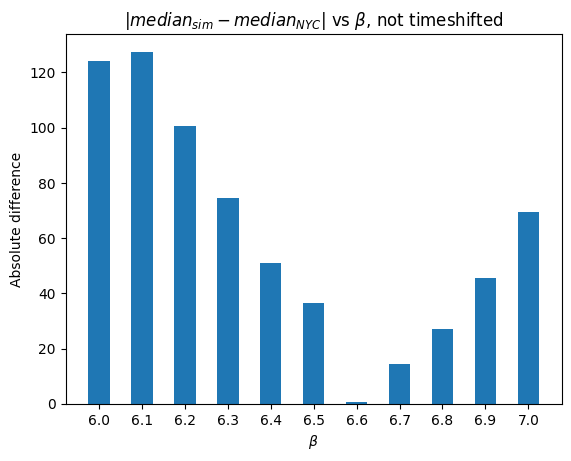

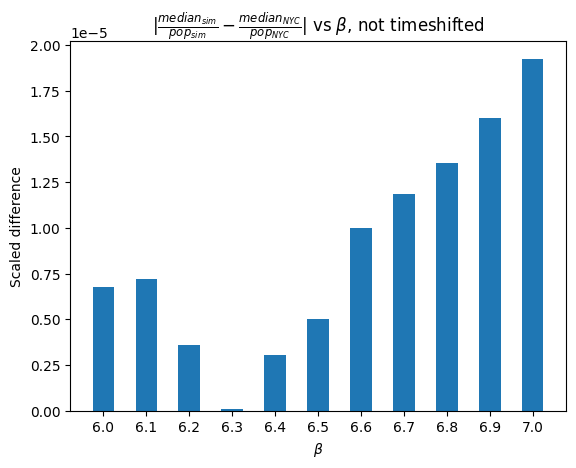

In [35]:
plt.figure()
plt.title(r'$|median_{sim} - median_{NYC}|$ vs $\beta$, not timeshifted')
plt.xlabel(r'$\beta$')
plt.ylabel(r'Absolute difference')
plt.bar(
    betas_to_try_focused,
    [np.abs(np.median(np.sum(pool.get_samples(),axis=1)) - sum(biweekly_cases)) for pool in focused_sweep_pools], 
    width=0.05)
plt.xticks(betas_to_try_focused)

plt.figure()
plt.title(r'$|\frac{median_{sim}}{pop_{sim}} - \frac{median_{NYC}}{pop_{NYC}}|$ vs $\beta$, not timeshifted')
plt.xlabel(r'$\beta$')
plt.ylabel(r'Scaled difference')
plt.bar(betas_to_try_focused,
        [np.abs(np.median(np.sum(pool.get_samples(),axis=1))/sum(immun['pop']) - sum(biweekly_cases)/nyc_population) for pool in focused_sweep_pools], 
        width=0.05)
plt.xticks(betas_to_try_focused)

In [ ]:
tsir_pool = calib_obj(6.8, 
          sim_pop=sum(patch_pop['pop']), 
          dataset=biweekly_cases, data_pop=nyc_population,
          base_config=config, seed=I, pool_worker=p, plot=True, draws=200, obj="median_attacksize", return_pool=True)

In [ ]:
plt.plot(tsir_pool.get_samples().T,color='black', alpha=0.1)

## More rigorous calibration
- metric: total attack size
- How to optimize?

In [ ]:
plt

## sensitivity to missing zipcodes?

In [27]:
# immunization data
immun = pd.read_csv(project_path.format("data/VA_zipcodes_cleaned/ZC_immunization_sifat.csv"))
# drop rows with zero population
immun = immun[immun['population'] > 0]
immun.sort_values(by='zipcode',inplace=True)
immun.reset_index(drop=True, inplace=True)
immun.head()

In [29]:
# strong linear relationship between population and nVaccCount, but note a bit of heteroskedasticity
plt.scatter(immun['population'],immun['nVaccCount'])

In [39]:
immun_imputed = pd.read_csv(project_path.format('data/VA_zipcodes_cleaned/2017_acs_pop_imputed_nVaccCount.csv'))
immun_imputed = immun_imputed[~np.isnan(immun_imputed['zipcode'])]

In [45]:
immun_imputed['zipcode'].astype('int')

In [46]:
# need to get the distances again
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
locator = Nominatim(user_agent="get_VA_zipcode_lat_long")
coder = RateLimiter(locator.geocode,min_delay_seconds=1.5)
queries = ["{} VA United States".format(x) for x in immun_imputed['zipcode'].astype('int')]
locations = [coder(query) for query in queries]

In [ ]:

result = pd.DataFrame([x.raw for x in locations])
result.drop('licence',axis=1,inplace=True)
result['zipcode'] = va_vax_schedule.reset_index()['zipcode']